# 1) Background

This is our main notebook to train the model and test within our neuromodulated system with goal-driven perception with uncertain goal identity and uncertain goal validity. 

We have modified the PyTorch implementation of EB and c-EB by Sam Greydanus (https://github.com/greydanus/excitationbp/). The code script utils.py in the current directory was modified from his package based on our own network architecture. The two code scripts including *\__*init*\__*.py in the current directory and eb_linear.py in the subdirectory called functions were directly from his package. All the rest code scripts (including load_mnist_data_pair.py, define_model.py, predict_w_cEB.py, train_n_test_model.py, show_cEB_results.py, and regulate_MNIST_pair_uncertainty.py) and two ipython notebook files (including train_n_test_results.ipynb and neuromodulated_goal_driven_perception_results.ipynb) in this entire folder were written completely by us for this project. 

For an in-depth explanation of EB and c-EB, refer to [this paper](https://arxiv.org/abs/1608.00507). Their [original code](https://github.com/jimmie33/Caffe-ExcitationBP) of EB and c-EB is in Caffe.

This ipython notebook was completely written by us, who are anonymous authors of the submitted paper under review.

In [1]:
import torch
import numpy as np
import os, sys, copy ; sys.path.append('..')
from train_n_test_model import train_model
from predict_w_cEB import get_each_ceb_accuracy
from show_cEB_results import print_all_overall_stats, show_cEB_example
from regulate_MNIST_pair_uncertainty import MNIST_uncertainty_task, plot_MNIST_uncertainty, average_probs

reseed = lambda: np.random.seed(seed=1) ; ms = torch.manual_seed(1) # for reproducibility
reseed()

if torch.cuda.is_available():
    useCuda = True
else:
    useCuda = False

print(useCuda)

True


# 2) Train the model

In [2]:
model, dataloader = train_model(total_steps = 4400,test_every = 200,test_pair_num = 2000,toTest = False)


Start to train 4400 steps, each with 256 all-combination pairs.


# 4) Neuromodulated goal-driven perception with uncertainties
Part 4 directly follows Part 2. Part 3, which is independent of Part 4, is in the other ipython notebook file named train_n_test_results.ipynb in the same directory.

In [3]:
ACH_CORRECT=1.20
ACH_INCORRECT=0.85
NE_INCORRECT=1.10
NE_CORRECT=0.85
trialRange=30
trialInterval=400
num_considered=10
num_threshold=8
hasAChLesion=True
hasNELesion=False

## 4.1: Single Valid Cue
Randomly change trial interval within the range (200+/-20) and have a single valid cue for each cue switch, and use one of the validity options: 0.99, 0.85, 0.70

In [4]:
alterValid=False

### 4.1.1: validity_choices=0.99

A cue was randomly picked among integers 0~3 (i.e. even, odd, low, high respectively) every 400+/-30 trials for 10 times.
The cue validity was randomly selected among 0.99 in each trial.
12/4032 = 0.3% trials occurred when the predicted digit matched the cued digit but the cue was invalid
3092/4032 = 76.7% trials occurred when the predicted digit did not match the cued digit.
    399/4032 trials occurred when the predicted digit did not match the guess-target digit.
    2990/4032 trials occurred when the guess-target digit did not match the cued digit, i.e. when the guessed action was wrong.
928/4032 = 23.0% trials occurred when the predicted digit matches the major cued digit and is valid
0/4032 = 0.0% trials occurred when the predicted digit matches the minor cued digit and is valid
Lag length for stable prediction of each major cue is: [428 422 374 406 407 103 412 372 128 400], and mean of lag length (excluding consistently same cue) is 345.2


/home/xinyunz5/.local/lib/python3.6/site-packages/matplotlib/font_manager.py:1241: UserWarning: findfont: Font family ['normal'] not found. Falling back to DejaVu Sans.
  (prop.get_family(), self.defaultFamily[fontext]))


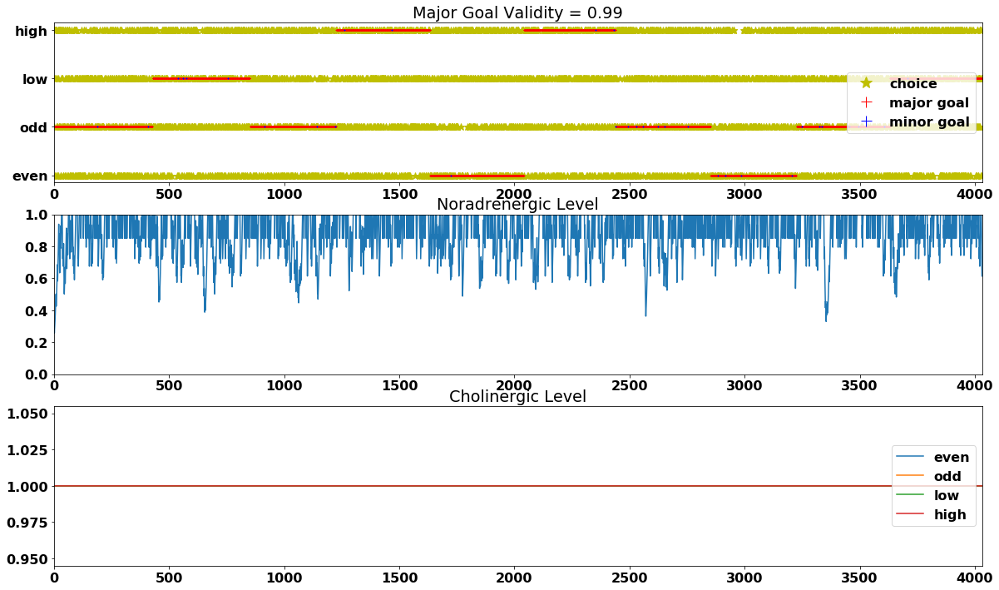

In [5]:
# trialRange+/-30 and single valid cue (1) 
model_copy = copy.deepcopy(model)
correct, choice, ach_level, ach_avg_level, ne_level, correct_lbl, acts_prob, all_prob_99_1 = MNIST_uncertainty_task(model_copy,dataloader,validity_choices=0.99,ACH_CORRECT=ACH_CORRECT,ACH_INCORRECT=ACH_INCORRECT,NE_INCORRECT=NE_INCORRECT,NE_CORRECT=NE_CORRECT,trialRange=trialRange,trialInterval=trialInterval,alterValid=alterValid,num_considered=num_considered,num_threshold=num_threshold,previous_cues=np.array([1,2,1,3,0,3,1,0,1,2]),hasAChLesion=hasAChLesion,hasNELesion=hasNELesion)
plot_MNIST_uncertainty(correct, choice, ach_level, ach_avg_level, ne_level, correct_lbl, acts_prob, validity_choices=0.99)


A cue was randomly picked among integers 0~3 (i.e. even, odd, low, high respectively) every 400+/-30 trials for 10 times.
The cue validity was randomly selected among 0.99 in each trial.
9/4032 = 0.2% trials occurred when the predicted digit matched the cued digit but the cue was invalid
3073/4032 = 76.2% trials occurred when the predicted digit did not match the cued digit.
    383/4032 trials occurred when the predicted digit did not match the guess-target digit.
    2976/4032 trials occurred when the guess-target digit did not match the cued digit, i.e. when the guessed action was wrong.
950/4032 = 23.6% trials occurred when the predicted digit matches the major cued digit and is valid
0/4032 = 0.0% trials occurred when the predicted digit matches the minor cued digit and is valid
Lag length for stable prediction of each major cue is: [428 422 374 254 407 397 412 372 404 400], and mean of lag length (excluding consistently same cue) is 387.0


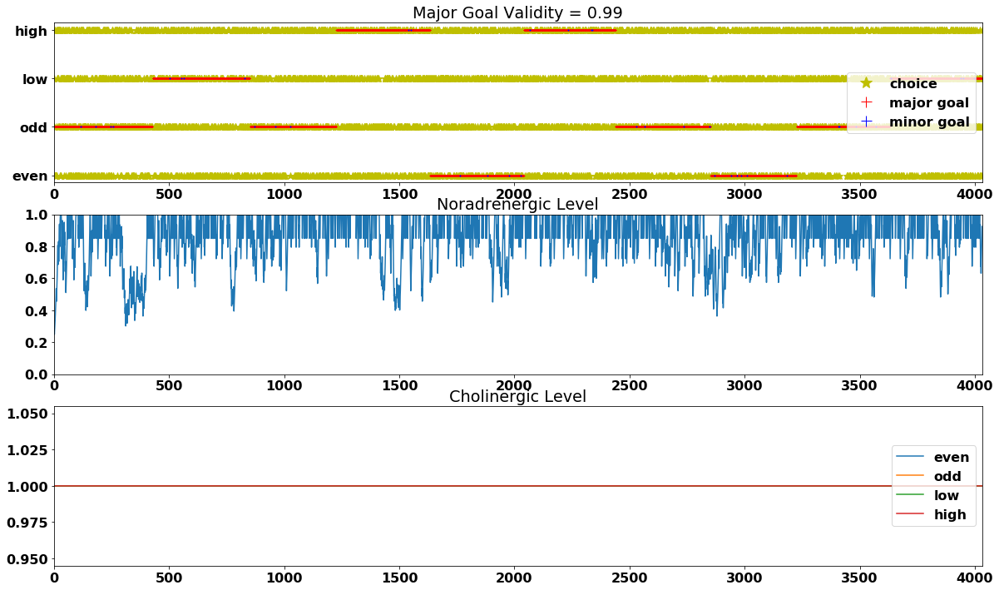

In [6]:
# trialRange+/-30 and single valid cue (2) 
model_copy = copy.deepcopy(model)
correct, choice, ach_level, ach_avg_level, ne_level, correct_lbl, acts_prob, all_prob_99_2 = MNIST_uncertainty_task(model_copy,dataloader,validity_choices=0.99,ACH_CORRECT=ACH_CORRECT,ACH_INCORRECT=ACH_INCORRECT,NE_INCORRECT=NE_INCORRECT,NE_CORRECT=NE_CORRECT,trialRange=trialRange,trialInterval=trialInterval,alterValid=alterValid,num_considered=num_considered,num_threshold=num_threshold, previous_intervals=all_prob_99_1[1],previous_cues=all_prob_99_1[2],hasAChLesion=hasAChLesion,hasNELesion=hasNELesion)
plot_MNIST_uncertainty(correct, choice, ach_level, ach_avg_level, ne_level, correct_lbl, acts_prob, validity_choices=0.99)


A cue was randomly picked among integers 0~3 (i.e. even, odd, low, high respectively) every 400+/-30 trials for 10 times.
The cue validity was randomly selected among 0.99 in each trial.
10/4032 = 0.2% trials occurred when the predicted digit matched the cued digit but the cue was invalid
3159/4032 = 78.3% trials occurred when the predicted digit did not match the cued digit.
    408/4032 trials occurred when the predicted digit did not match the guess-target digit.
    3071/4032 trials occurred when the guess-target digit did not match the cued digit, i.e. when the guessed action was wrong.
863/4032 = 21.4% trials occurred when the predicted digit matches the major cued digit and is valid
0/4032 = 0.0% trials occurred when the predicted digit matches the minor cued digit and is valid
Lag length for stable prediction of each major cue is: [428 422 374 406 407 397 412 372 404 400], and mean of lag length (excluding consistently same cue) is 402.2


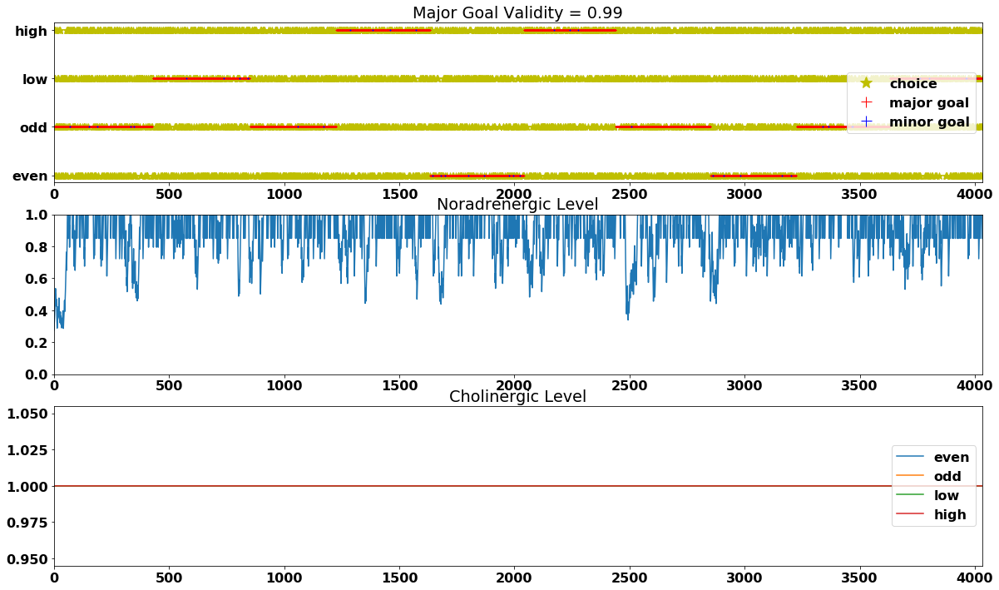

In [7]:
# trialRange+/-30 and single valid cue (3) 
model_copy = copy.deepcopy(model)
correct, choice, ach_level, ach_avg_level, ne_level, correct_lbl, acts_prob, all_prob_99_3 = MNIST_uncertainty_task(model_copy,dataloader,validity_choices=0.99,ACH_CORRECT=ACH_CORRECT,ACH_INCORRECT=ACH_INCORRECT,NE_INCORRECT=NE_INCORRECT,NE_CORRECT=NE_CORRECT,trialRange=trialRange,trialInterval=trialInterval,alterValid=alterValid,num_considered=num_considered,num_threshold=num_threshold, previous_intervals=all_prob_99_1[1],previous_cues=all_prob_99_1[2],hasAChLesion=hasAChLesion,hasNELesion=hasNELesion)
plot_MNIST_uncertainty(correct, choice, ach_level, ach_avg_level, ne_level, correct_lbl, acts_prob, validity_choices=0.99)


A cue was randomly picked among integers 0~3 (i.e. even, odd, low, high respectively) every 400+/-30 trials for 10 times.
The cue validity was randomly selected among 0.99 in each trial.
9/4032 = 0.2% trials occurred when the predicted digit matched the cued digit but the cue was invalid
3083/4032 = 76.5% trials occurred when the predicted digit did not match the cued digit.
    342/4032 trials occurred when the predicted digit did not match the guess-target digit.
    3000/4032 trials occurred when the guess-target digit did not match the cued digit, i.e. when the guessed action was wrong.
940/4032 = 23.3% trials occurred when the predicted digit matches the major cued digit and is valid
0/4032 = 0.0% trials occurred when the predicted digit matches the minor cued digit and is valid
Lag length for stable prediction of each major cue is: [428 422 374 406 407 397 412 372 404 400], and mean of lag length (excluding consistently same cue) is 402.2


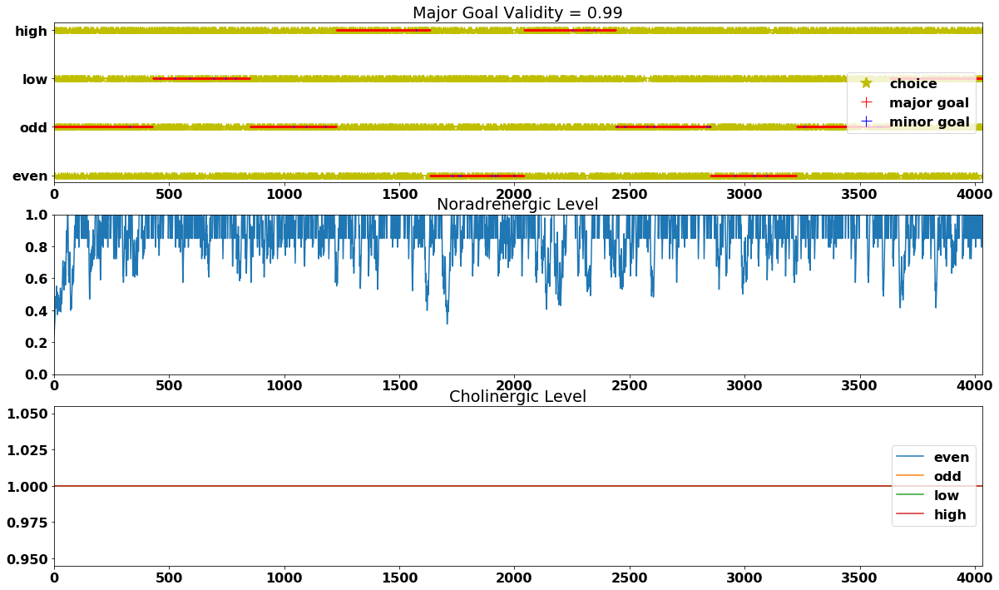

In [8]:
# trialRange+/-30 and single valid cue (4) 
model_copy = copy.deepcopy(model)
correct, choice, ach_level, ach_avg_level, ne_level, correct_lbl, acts_prob, all_prob_99_4 = MNIST_uncertainty_task(model_copy,dataloader,validity_choices=0.99,ACH_CORRECT=ACH_CORRECT,ACH_INCORRECT=ACH_INCORRECT,NE_INCORRECT=NE_INCORRECT,NE_CORRECT=NE_CORRECT,trialRange=trialRange,trialInterval=trialInterval,alterValid=alterValid,num_considered=num_considered,num_threshold=num_threshold, previous_intervals=all_prob_99_1[1],previous_cues=all_prob_99_1[2],hasAChLesion=hasAChLesion,hasNELesion=hasNELesion)
plot_MNIST_uncertainty(correct, choice, ach_level, ach_avg_level, ne_level, correct_lbl, acts_prob, validity_choices=0.99)


A cue was randomly picked among integers 0~3 (i.e. even, odd, low, high respectively) every 400+/-30 trials for 10 times.
The cue validity was randomly selected among 0.99 in each trial.
17/4032 = 0.4% trials occurred when the predicted digit matched the cued digit but the cue was invalid
3113/4032 = 77.2% trials occurred when the predicted digit did not match the cued digit.
    337/4032 trials occurred when the predicted digit did not match the guess-target digit.
    3026/4032 trials occurred when the guess-target digit did not match the cued digit, i.e. when the guessed action was wrong.
902/4032 = 22.4% trials occurred when the predicted digit matches the major cued digit and is valid
0/4032 = 0.0% trials occurred when the predicted digit matches the minor cued digit and is valid
Lag length for stable prediction of each major cue is: [428 422 374 406 407 397 412 372 404 400], and mean of lag length (excluding consistently same cue) is 402.2


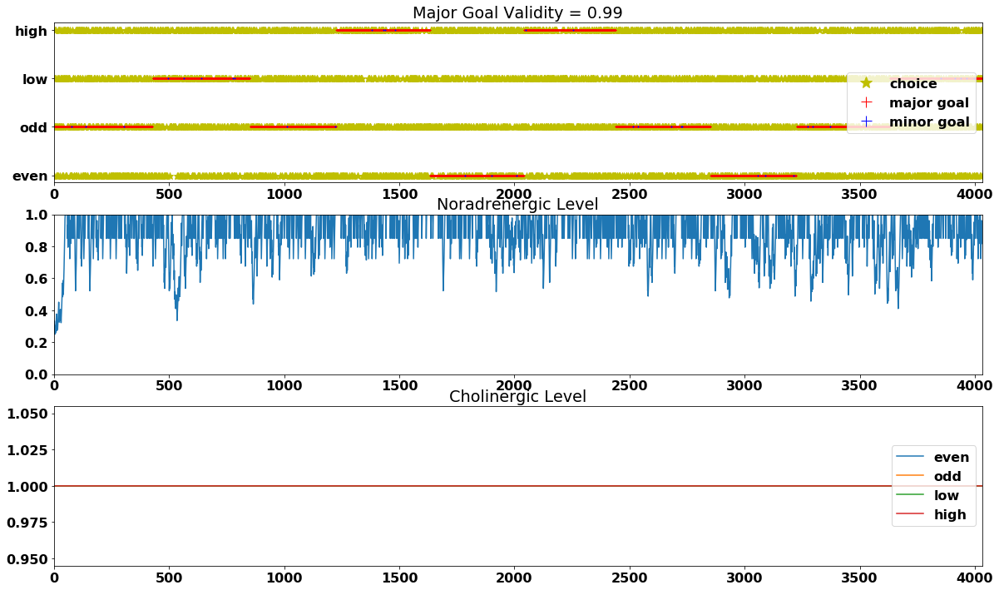

In [9]:
# trialRange+/-30 and single valid cue (5) 
model_copy = copy.deepcopy(model)
correct, choice, ach_level, ach_avg_level, ne_level, correct_lbl, acts_prob, all_prob_99_5 = MNIST_uncertainty_task(model_copy,dataloader,validity_choices=0.99,ACH_CORRECT=ACH_CORRECT,ACH_INCORRECT=ACH_INCORRECT,NE_INCORRECT=NE_INCORRECT,NE_CORRECT=NE_CORRECT,trialRange=trialRange,trialInterval=trialInterval,alterValid=alterValid,num_considered=num_considered,num_threshold=num_threshold, previous_intervals=all_prob_99_1[1],previous_cues=all_prob_99_1[2],hasAChLesion=hasAChLesion,hasNELesion=hasNELesion)
plot_MNIST_uncertainty(correct, choice, ach_level, ach_avg_level, ne_level, correct_lbl, acts_prob, validity_choices=0.99)


A cue was randomly picked among integers 0~3 (i.e. even, odd, low, high respectively) every 400+/-30 trials for 10 times.
The cue validity was randomly selected among 0.99 in each trial.
10/4032 = 0.2% trials occurred when the predicted digit matched the cued digit but the cue was invalid
3128/4032 = 77.6% trials occurred when the predicted digit did not match the cued digit.
    342/4032 trials occurred when the predicted digit did not match the guess-target digit.
    3047/4032 trials occurred when the guess-target digit did not match the cued digit, i.e. when the guessed action was wrong.
894/4032 = 22.2% trials occurred when the predicted digit matches the major cued digit and is valid
0/4032 = 0.0% trials occurred when the predicted digit matches the minor cued digit and is valid
Lag length for stable prediction of each major cue is: [428 422 374 406 407 397 412 372 404 400], and mean of lag length (excluding consistently same cue) is 402.2


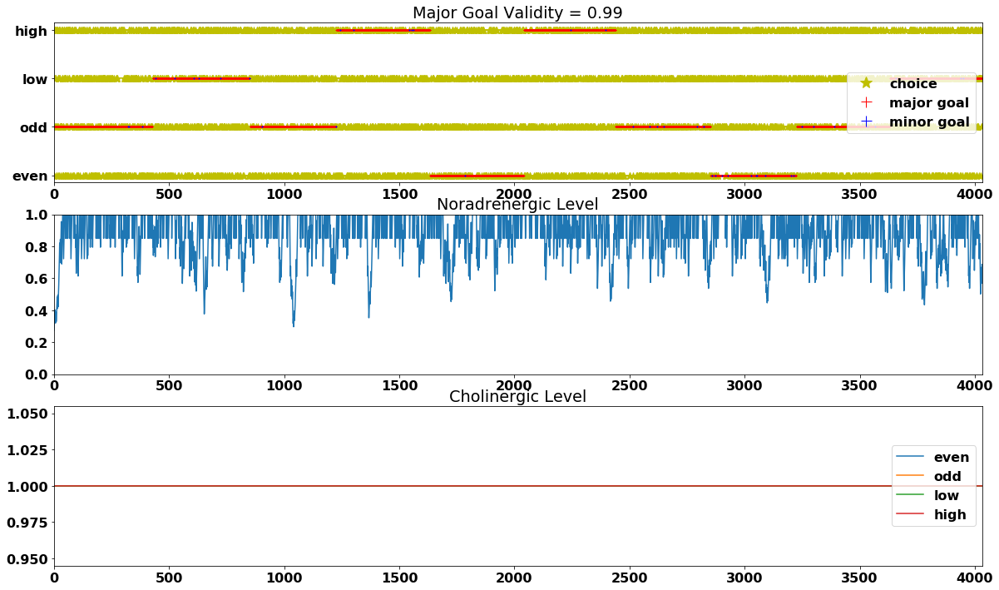

In [10]:
# trialRange+/-30 and single valid cue (6) 
model_copy = copy.deepcopy(model)
correct, choice, ach_level, ach_avg_level, ne_level, correct_lbl, acts_prob, all_prob_99_6 = MNIST_uncertainty_task(model_copy,dataloader,validity_choices=0.99,ACH_CORRECT=ACH_CORRECT,ACH_INCORRECT=ACH_INCORRECT,NE_INCORRECT=NE_INCORRECT,NE_CORRECT=NE_CORRECT,trialRange=trialRange,trialInterval=trialInterval,alterValid=alterValid,num_considered=num_considered,num_threshold=num_threshold, previous_intervals=all_prob_99_1[1],previous_cues=all_prob_99_1[2],hasAChLesion=hasAChLesion,hasNELesion=hasNELesion)
plot_MNIST_uncertainty(correct, choice, ach_level, ach_avg_level, ne_level, correct_lbl, acts_prob, validity_choices=0.99)


A cue was randomly picked among integers 0~3 (i.e. even, odd, low, high respectively) every 400+/-30 trials for 10 times.
The cue validity was randomly selected among 0.99 in each trial.
10/4032 = 0.2% trials occurred when the predicted digit matched the cued digit but the cue was invalid
3118/4032 = 77.3% trials occurred when the predicted digit did not match the cued digit.
    384/4032 trials occurred when the predicted digit did not match the guess-target digit.
    3009/4032 trials occurred when the guess-target digit did not match the cued digit, i.e. when the guessed action was wrong.
904/4032 = 22.4% trials occurred when the predicted digit matches the major cued digit and is valid
0/4032 = 0.0% trials occurred when the predicted digit matches the minor cued digit and is valid
Lag length for stable prediction of each major cue is: [428 422 374 406 407 397 412 372 404 400], and mean of lag length (excluding consistently same cue) is 402.2


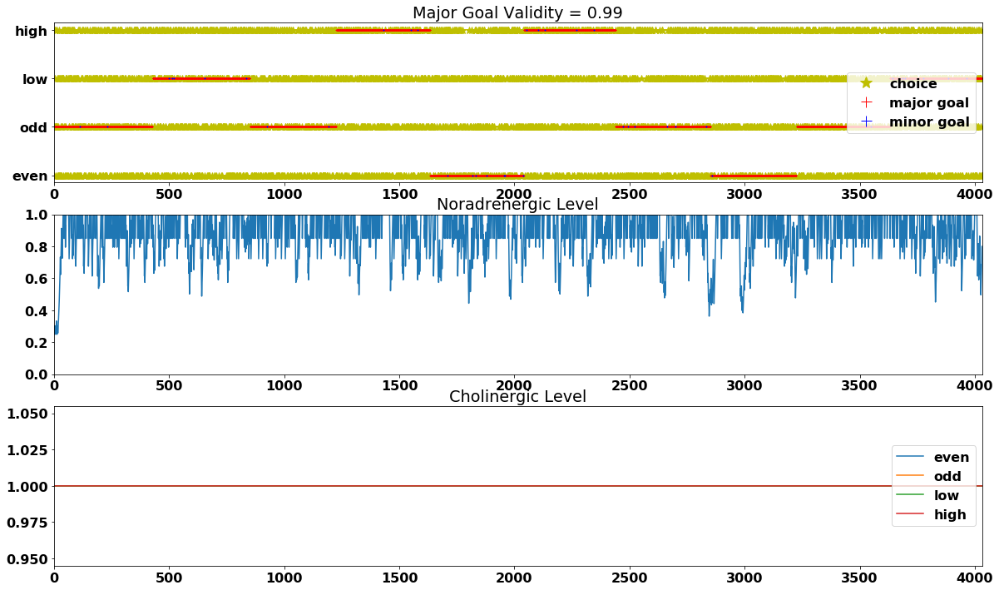

In [11]:
# trialRange+/-30 and single valid cue (7) 
model_copy = copy.deepcopy(model)
correct, choice, ach_level, ach_avg_level, ne_level, correct_lbl, acts_prob, all_prob_99_7 = MNIST_uncertainty_task(model_copy,dataloader,validity_choices=0.99,ACH_CORRECT=ACH_CORRECT,ACH_INCORRECT=ACH_INCORRECT,NE_INCORRECT=NE_INCORRECT,NE_CORRECT=NE_CORRECT,trialRange=trialRange,trialInterval=trialInterval,alterValid=alterValid,num_considered=num_considered,num_threshold=num_threshold, previous_intervals=all_prob_99_1[1],previous_cues=all_prob_99_1[2],hasAChLesion=hasAChLesion,hasNELesion=hasNELesion)
plot_MNIST_uncertainty(correct, choice, ach_level, ach_avg_level, ne_level, correct_lbl, acts_prob, validity_choices=0.99)


A cue was randomly picked among integers 0~3 (i.e. even, odd, low, high respectively) every 400+/-30 trials for 10 times.
The cue validity was randomly selected among 0.99 in each trial.
3/4032 = 0.1% trials occurred when the predicted digit matched the cued digit but the cue was invalid
3109/4032 = 77.1% trials occurred when the predicted digit did not match the cued digit.
    352/4032 trials occurred when the predicted digit did not match the guess-target digit.
    3009/4032 trials occurred when the guess-target digit did not match the cued digit, i.e. when the guessed action was wrong.
920/4032 = 22.8% trials occurred when the predicted digit matches the major cued digit and is valid
0/4032 = 0.0% trials occurred when the predicted digit matches the minor cued digit and is valid
Lag length for stable prediction of each major cue is: [428 422 374 406 407 367 412 372 404 400], and mean of lag length (excluding consistently same cue) is 399.2


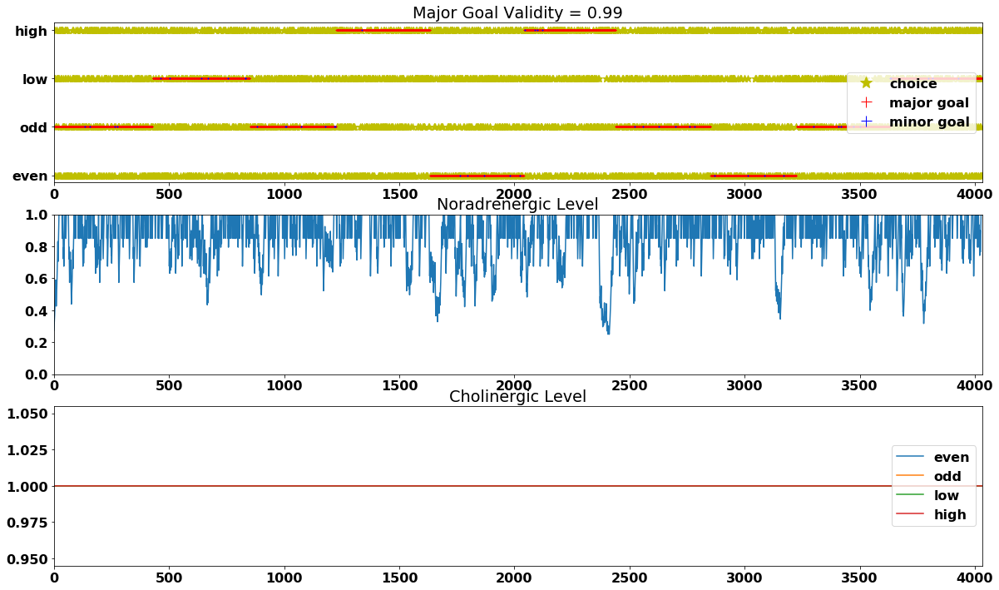

In [12]:
# trialRange+/-30 and single valid cue (8) 
model_copy = copy.deepcopy(model)
correct, choice, ach_level, ach_avg_level, ne_level, correct_lbl, acts_prob, all_prob_99_8 = MNIST_uncertainty_task(model_copy,dataloader,validity_choices=0.99,ACH_CORRECT=ACH_CORRECT,ACH_INCORRECT=ACH_INCORRECT,NE_INCORRECT=NE_INCORRECT,NE_CORRECT=NE_CORRECT,trialRange=trialRange,trialInterval=trialInterval,alterValid=alterValid,num_considered=num_considered,num_threshold=num_threshold, previous_intervals=all_prob_99_1[1],previous_cues=all_prob_99_1[2],hasAChLesion=hasAChLesion,hasNELesion=hasNELesion)
plot_MNIST_uncertainty(correct, choice, ach_level, ach_avg_level, ne_level, correct_lbl, acts_prob, validity_choices=0.99)


A cue was randomly picked among integers 0~3 (i.e. even, odd, low, high respectively) every 400+/-30 trials for 10 times.
The cue validity was randomly selected among 0.99 in each trial.
2/4032 = 0.0% trials occurred when the predicted digit matched the cued digit but the cue was invalid
3172/4032 = 78.7% trials occurred when the predicted digit did not match the cued digit.
    358/4032 trials occurred when the predicted digit did not match the guess-target digit.
    3084/4032 trials occurred when the guess-target digit did not match the cued digit, i.e. when the guessed action was wrong.
858/4032 = 21.3% trials occurred when the predicted digit matches the major cued digit and is valid
0/4032 = 0.0% trials occurred when the predicted digit matches the minor cued digit and is valid
Lag length for stable prediction of each major cue is: [428 422 374 406 407 397 412 372 404 400], and mean of lag length (excluding consistently same cue) is 402.2


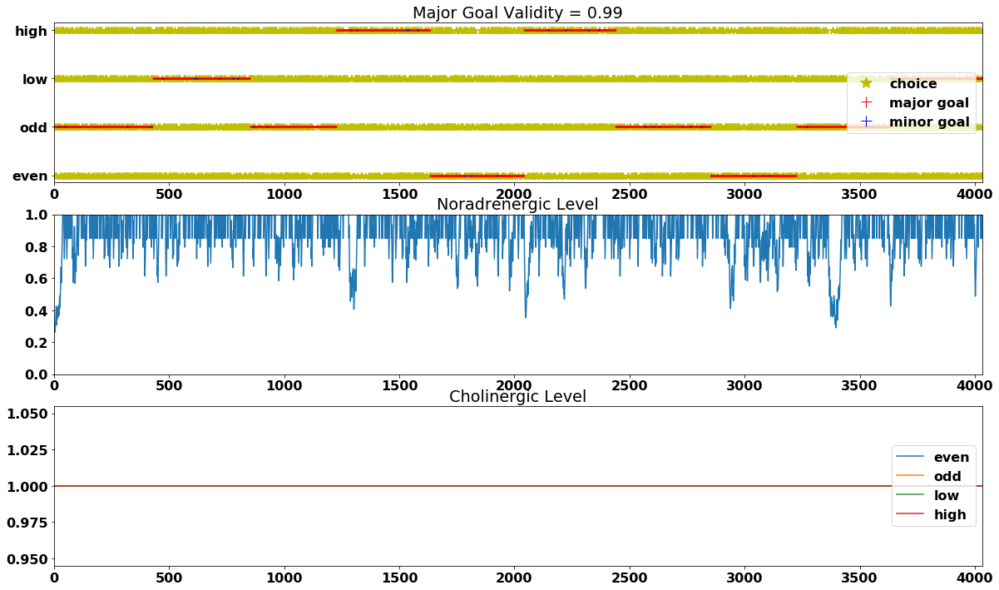

In [13]:
# trialRange+/-30 and single valid cue (9) 
model_copy = copy.deepcopy(model)
correct, choice, ach_level, ach_avg_level, ne_level, correct_lbl, acts_prob, all_prob_99_9 = MNIST_uncertainty_task(model_copy,dataloader,validity_choices=0.99,ACH_CORRECT=ACH_CORRECT,ACH_INCORRECT=ACH_INCORRECT,NE_INCORRECT=NE_INCORRECT,NE_CORRECT=NE_CORRECT,trialRange=trialRange,trialInterval=trialInterval,alterValid=alterValid,num_considered=num_considered,num_threshold=num_threshold, previous_intervals=all_prob_99_1[1],previous_cues=all_prob_99_1[2],hasAChLesion=hasAChLesion,hasNELesion=hasNELesion)
plot_MNIST_uncertainty(correct, choice, ach_level, ach_avg_level, ne_level, correct_lbl, acts_prob, validity_choices=0.99)


A cue was randomly picked among integers 0~3 (i.e. even, odd, low, high respectively) every 400+/-30 trials for 10 times.
The cue validity was randomly selected among 0.99 in each trial.
11/4032 = 0.3% trials occurred when the predicted digit matched the cued digit but the cue was invalid
3136/4032 = 77.8% trials occurred when the predicted digit did not match the cued digit.
    357/4032 trials occurred when the predicted digit did not match the guess-target digit.
    3039/4032 trials occurred when the guess-target digit did not match the cued digit, i.e. when the guessed action was wrong.
885/4032 = 21.9% trials occurred when the predicted digit matches the major cued digit and is valid
0/4032 = 0.0% trials occurred when the predicted digit matches the minor cued digit and is valid
Lag length for stable prediction of each major cue is: [428 422 374 406 407 397 412 372 404 400], and mean of lag length (excluding consistently same cue) is 402.2


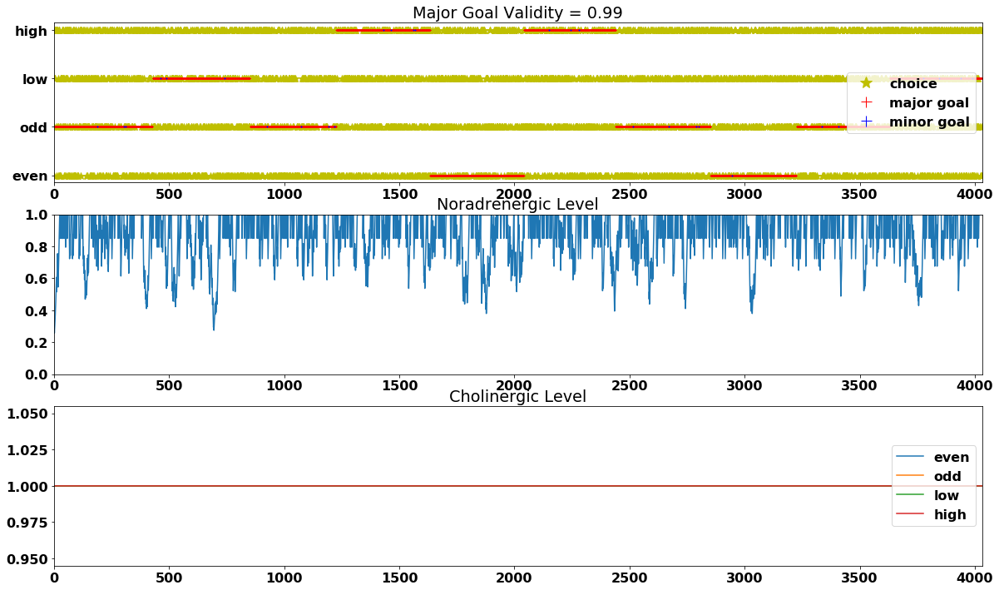

In [14]:
# trialRange+/-30 and single valid cue (10) 
model_copy = copy.deepcopy(model)
correct, choice, ach_level, ach_avg_level, ne_level, correct_lbl, acts_prob, all_prob_99_10 = MNIST_uncertainty_task(model_copy,dataloader,validity_choices=0.99,ACH_CORRECT=ACH_CORRECT,ACH_INCORRECT=ACH_INCORRECT,NE_INCORRECT=NE_INCORRECT,NE_CORRECT=NE_CORRECT,trialRange=trialRange,trialInterval=trialInterval,alterValid=alterValid,num_considered=num_considered,num_threshold=num_threshold, previous_intervals=all_prob_99_1[1],previous_cues=all_prob_99_1[2],hasAChLesion=hasAChLesion,hasNELesion=hasNELesion)
plot_MNIST_uncertainty(correct, choice, ach_level, ach_avg_level, ne_level, correct_lbl, acts_prob, validity_choices=0.99)


In [15]:
all_99_case_probs = [all_prob_99_1,all_prob_99_2,all_prob_99_3,all_prob_99_4,all_prob_99_5,\
                     all_prob_99_6,all_prob_99_7,all_prob_99_8,all_prob_99_9,all_prob_99_10]
averages_99 = average_probs(all_99_case_probs)


Average lag length is: 394
Average prob pred wrong, prob pred cue A valid, prob pred cue B valid, prob pred cue A invalid,
    prob guess not match cue, prob pred not match guess, prob match cue A invalid alter: 
[0.7733878968253969, 0.22430555555555554, 0.0, 0.0023065476190476187, 0.7502728174603175, 0.0908234126984127, 0.0]


### 4.1.2: validity_choices=0.85

A cue was randomly picked among integers 0~3 (i.e. even, odd, low, high respectively) every 400+/-30 trials for 10 times.
The cue validity was randomly selected among 0.85 in each trial.
116/4032 = 2.9% trials occurred when the predicted digit matched the cued digit but the cue was invalid
3118/4032 = 77.3% trials occurred when the predicted digit did not match the cued digit.
    386/4032 trials occurred when the predicted digit did not match the guess-target digit.
    3023/4032 trials occurred when the guess-target digit did not match the cued digit, i.e. when the guessed action was wrong.
798/4032 = 19.8% trials occurred when the predicted digit matches the major cued digit and is valid
0/4032 = 0.0% trials occurred when the predicted digit matches the minor cued digit and is valid
Lag length for stable prediction of each major cue is: [428 422 374 406 407 397 412 372 172 400], and mean of lag length (excluding consistently same cue) is 379.0


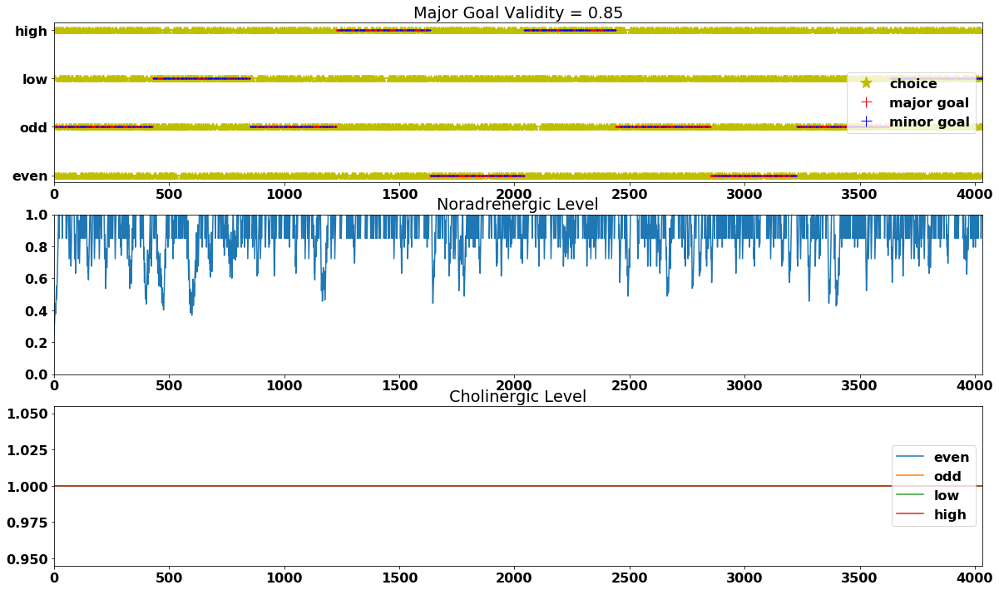

In [16]:
# trialRange+/-30 and single valid cue (1) 
model_copy = copy.deepcopy(model)
correct, choice, ach_level, ach_avg_level, ne_level, correct_lbl, acts_prob, all_prob_85_1 = MNIST_uncertainty_task(model_copy,dataloader,validity_choices=0.85,ACH_CORRECT=ACH_CORRECT,ACH_INCORRECT=ACH_INCORRECT,NE_INCORRECT=NE_INCORRECT,NE_CORRECT=NE_CORRECT,trialRange=trialRange,trialInterval=trialInterval,alterValid=alterValid,num_considered=num_considered,num_threshold=num_threshold, previous_intervals=all_prob_99_1[1],previous_cues=all_prob_99_1[2],hasAChLesion=hasAChLesion,hasNELesion=hasNELesion)
plot_MNIST_uncertainty(correct, choice, ach_level, ach_avg_level, ne_level, correct_lbl, acts_prob, validity_choices=0.85)


A cue was randomly picked among integers 0~3 (i.e. even, odd, low, high respectively) every 400+/-30 trials for 10 times.
The cue validity was randomly selected among 0.85 in each trial.
128/4032 = 3.2% trials occurred when the predicted digit matched the cued digit but the cue was invalid
3079/4032 = 76.4% trials occurred when the predicted digit did not match the cued digit.
    370/4032 trials occurred when the predicted digit did not match the guess-target digit.
    2993/4032 trials occurred when the guess-target digit did not match the cued digit, i.e. when the guessed action was wrong.
825/4032 = 20.5% trials occurred when the predicted digit matches the major cued digit and is valid
0/4032 = 0.0% trials occurred when the predicted digit matches the minor cued digit and is valid
Lag length for stable prediction of each major cue is: [428 422 374 406  82 230 331 372 404 400], and mean of lag length (excluding consistently same cue) is 344.9


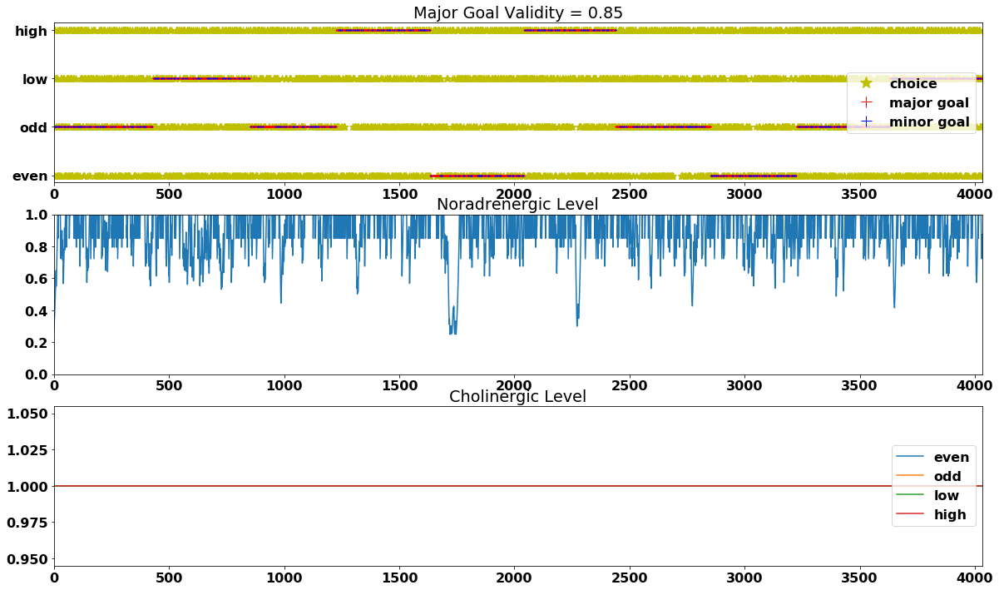

In [17]:
# trialRange+/-30 and single valid cue (2) 
model_copy = copy.deepcopy(model)
correct, choice, ach_level, ach_avg_level, ne_level, correct_lbl, acts_prob, all_prob_85_2 = MNIST_uncertainty_task(model_copy,dataloader,validity_choices=0.85,ACH_CORRECT=ACH_CORRECT,ACH_INCORRECT=ACH_INCORRECT,NE_INCORRECT=NE_INCORRECT,NE_CORRECT=NE_CORRECT,trialRange=trialRange,trialInterval=trialInterval,alterValid=alterValid,num_considered=num_considered,num_threshold=num_threshold, previous_intervals=all_prob_99_1[1],previous_cues=all_prob_99_1[2],hasAChLesion=hasAChLesion,hasNELesion=hasNELesion)
plot_MNIST_uncertainty(correct, choice, ach_level, ach_avg_level, ne_level, correct_lbl, acts_prob, validity_choices=0.85)


A cue was randomly picked among integers 0~3 (i.e. even, odd, low, high respectively) every 400+/-30 trials for 10 times.
The cue validity was randomly selected among 0.85 in each trial.
156/4032 = 3.9% trials occurred when the predicted digit matched the cued digit but the cue was invalid
3092/4032 = 76.7% trials occurred when the predicted digit did not match the cued digit.
    348/4032 trials occurred when the predicted digit did not match the guess-target digit.
    2999/4032 trials occurred when the guess-target digit did not match the cued digit, i.e. when the guessed action was wrong.
784/4032 = 19.4% trials occurred when the predicted digit matches the major cued digit and is valid
0/4032 = 0.0% trials occurred when the predicted digit matches the minor cued digit and is valid
Lag length for stable prediction of each major cue is: [428 422 374 406 221 397 412 372 404 400], and mean of lag length (excluding consistently same cue) is 383.6


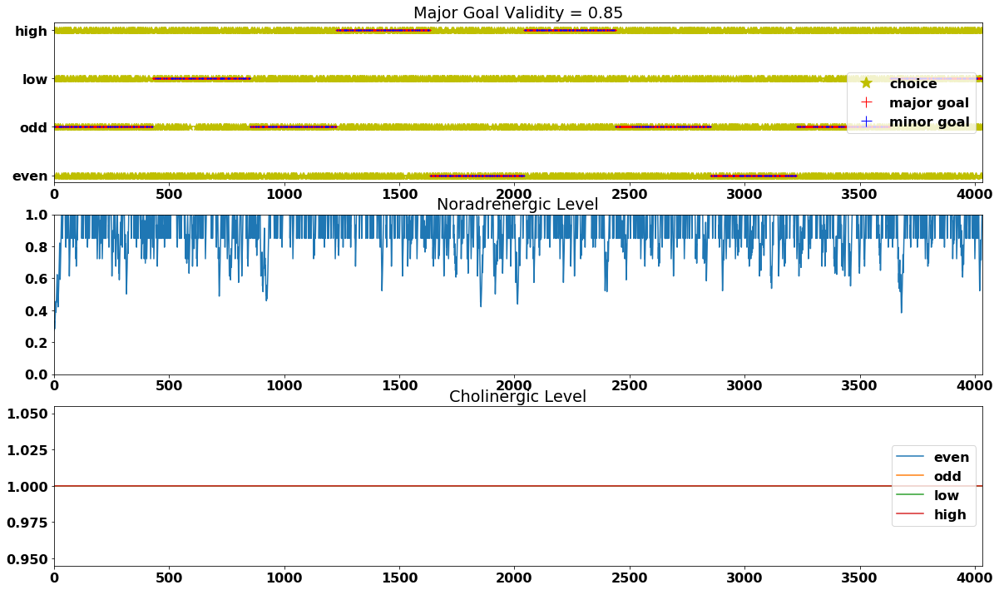

In [18]:
# trialRange+/-30 and single valid cue (3) 
model_copy = copy.deepcopy(model)
correct, choice, ach_level, ach_avg_level, ne_level, correct_lbl, acts_prob, all_prob_85_3 = MNIST_uncertainty_task(model_copy,dataloader,validity_choices=0.85,ACH_CORRECT=ACH_CORRECT,ACH_INCORRECT=ACH_INCORRECT,NE_INCORRECT=NE_INCORRECT,NE_CORRECT=NE_CORRECT,trialRange=trialRange,trialInterval=trialInterval,alterValid=alterValid,num_considered=num_considered,num_threshold=num_threshold, previous_intervals=all_prob_99_1[1],previous_cues=all_prob_99_1[2],hasAChLesion=hasAChLesion,hasNELesion=hasNELesion)
plot_MNIST_uncertainty(correct, choice, ach_level, ach_avg_level, ne_level, correct_lbl, acts_prob, validity_choices=0.85)


A cue was randomly picked among integers 0~3 (i.e. even, odd, low, high respectively) every 400+/-30 trials for 10 times.
The cue validity was randomly selected among 0.85 in each trial.
136/4032 = 3.4% trials occurred when the predicted digit matched the cued digit but the cue was invalid
3120/4032 = 77.4% trials occurred when the predicted digit did not match the cued digit.
    370/4032 trials occurred when the predicted digit did not match the guess-target digit.
    3036/4032 trials occurred when the guess-target digit did not match the cued digit, i.e. when the guessed action was wrong.
776/4032 = 19.2% trials occurred when the predicted digit matches the major cued digit and is valid
0/4032 = 0.0% trials occurred when the predicted digit matches the minor cued digit and is valid
Lag length for stable prediction of each major cue is: [428 422 374 406 407 397 412 372 404 400], and mean of lag length (excluding consistently same cue) is 402.2


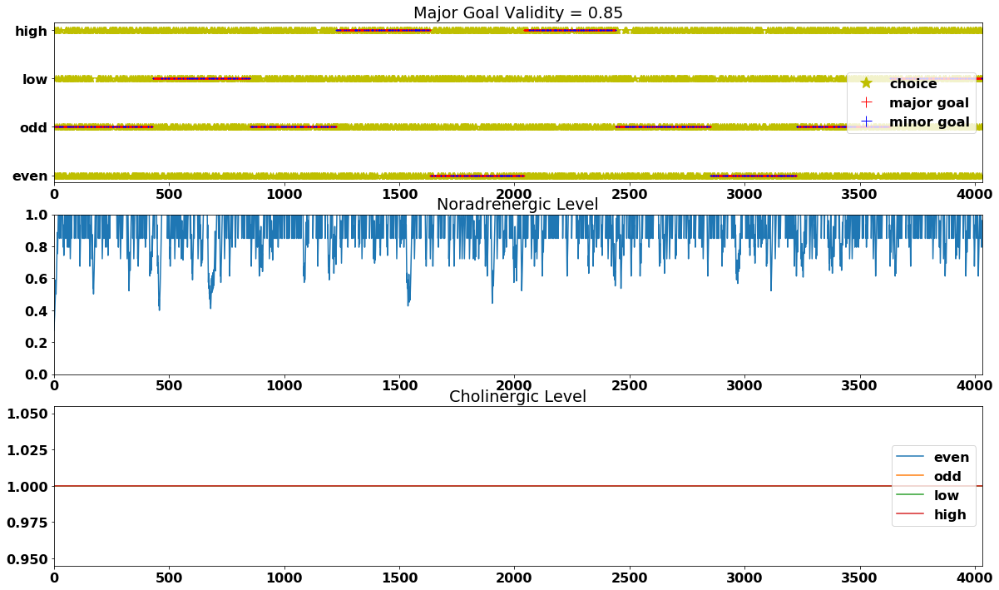

In [19]:
# trialRange+/-30 and single valid cue (4) 
model_copy = copy.deepcopy(model)
correct, choice, ach_level, ach_avg_level, ne_level, correct_lbl, acts_prob, all_prob_85_4 = MNIST_uncertainty_task(model_copy,dataloader,validity_choices=0.85,ACH_CORRECT=ACH_CORRECT,ACH_INCORRECT=ACH_INCORRECT,NE_INCORRECT=NE_INCORRECT,NE_CORRECT=NE_CORRECT,trialRange=trialRange,trialInterval=trialInterval,alterValid=alterValid,num_considered=num_considered,num_threshold=num_threshold, previous_intervals=all_prob_99_1[1],previous_cues=all_prob_99_1[2],hasAChLesion=hasAChLesion,hasNELesion=hasNELesion)
plot_MNIST_uncertainty(correct, choice, ach_level, ach_avg_level, ne_level, correct_lbl, acts_prob, validity_choices=0.85)


A cue was randomly picked among integers 0~3 (i.e. even, odd, low, high respectively) every 400+/-30 trials for 10 times.
The cue validity was randomly selected among 0.85 in each trial.
136/4032 = 3.4% trials occurred when the predicted digit matched the cued digit but the cue was invalid
3083/4032 = 76.5% trials occurred when the predicted digit did not match the cued digit.
    357/4032 trials occurred when the predicted digit did not match the guess-target digit.
    3002/4032 trials occurred when the guess-target digit did not match the cued digit, i.e. when the guessed action was wrong.
813/4032 = 20.2% trials occurred when the predicted digit matches the major cued digit and is valid
0/4032 = 0.0% trials occurred when the predicted digit matches the minor cued digit and is valid
Lag length for stable prediction of each major cue is: [428 422 207 406 310 397 412 372 404 400], and mean of lag length (excluding consistently same cue) is 375.8


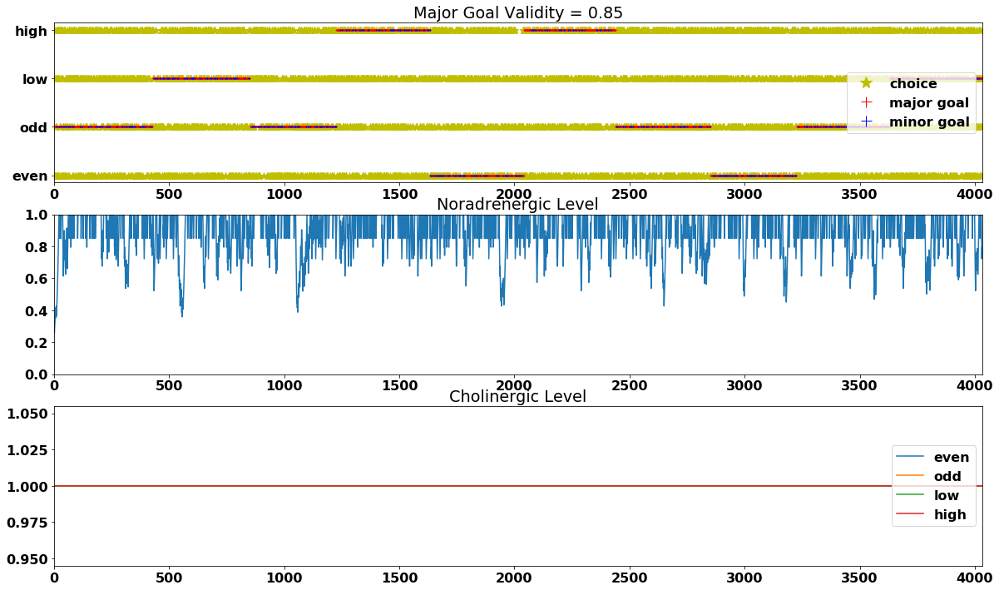

In [20]:
# trialRange+/-30 and single valid cue (5) 
model_copy = copy.deepcopy(model)
correct, choice, ach_level, ach_avg_level, ne_level, correct_lbl, acts_prob, all_prob_85_5 = MNIST_uncertainty_task(model_copy,dataloader,validity_choices=0.85,ACH_CORRECT=ACH_CORRECT,ACH_INCORRECT=ACH_INCORRECT,NE_INCORRECT=NE_INCORRECT,NE_CORRECT=NE_CORRECT,trialRange=trialRange,trialInterval=trialInterval,alterValid=alterValid,num_considered=num_considered,num_threshold=num_threshold, previous_intervals=all_prob_99_1[1],previous_cues=all_prob_99_1[2],hasAChLesion=hasAChLesion,hasNELesion=hasNELesion)
plot_MNIST_uncertainty(correct, choice, ach_level, ach_avg_level, ne_level, correct_lbl, acts_prob, validity_choices=0.85)


A cue was randomly picked among integers 0~3 (i.e. even, odd, low, high respectively) every 400+/-30 trials for 10 times.
The cue validity was randomly selected among 0.85 in each trial.
129/4032 = 3.2% trials occurred when the predicted digit matched the cued digit but the cue was invalid
3113/4032 = 77.2% trials occurred when the predicted digit did not match the cued digit.
    366/4032 trials occurred when the predicted digit did not match the guess-target digit.
    3018/4032 trials occurred when the guess-target digit did not match the cued digit, i.e. when the guessed action was wrong.
790/4032 = 19.6% trials occurred when the predicted digit matches the major cued digit and is valid
0/4032 = 0.0% trials occurred when the predicted digit matches the minor cued digit and is valid
Lag length for stable prediction of each major cue is: [428 422 374 406 407 397 412 372 404 400], and mean of lag length (excluding consistently same cue) is 402.2


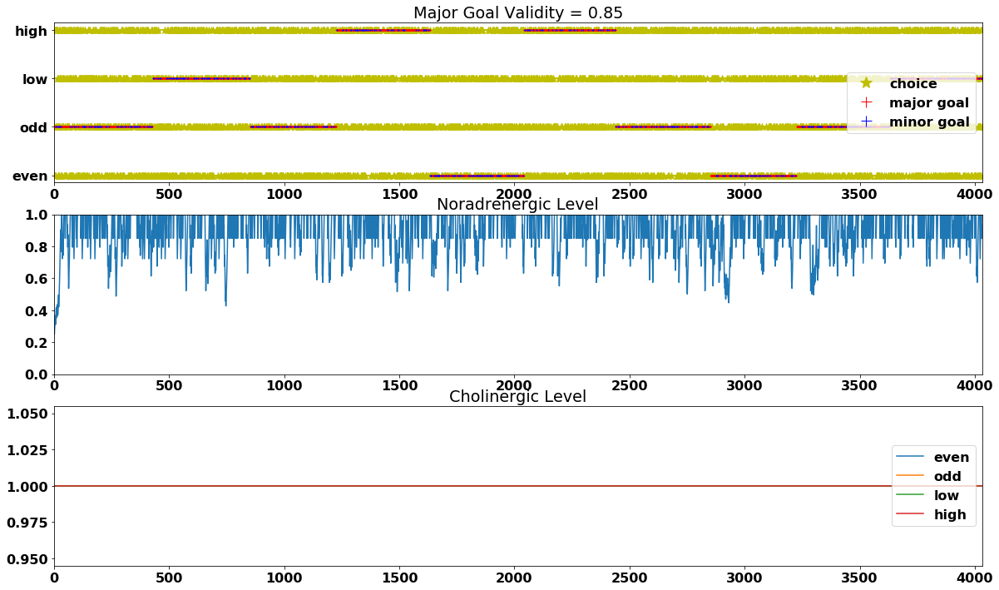

In [21]:
# trialRange+/-30 and single valid cue (6) 
model_copy = copy.deepcopy(model)
correct, choice, ach_level, ach_avg_level, ne_level, correct_lbl, acts_prob, all_prob_85_6 = MNIST_uncertainty_task(model_copy,dataloader,validity_choices=0.85,ACH_CORRECT=ACH_CORRECT,ACH_INCORRECT=ACH_INCORRECT,NE_INCORRECT=NE_INCORRECT,NE_CORRECT=NE_CORRECT,trialRange=trialRange,trialInterval=trialInterval,alterValid=alterValid,num_considered=num_considered,num_threshold=num_threshold, previous_intervals=all_prob_99_1[1],previous_cues=all_prob_99_1[2],hasAChLesion=hasAChLesion,hasNELesion=hasNELesion)
plot_MNIST_uncertainty(correct, choice, ach_level, ach_avg_level, ne_level, correct_lbl, acts_prob, validity_choices=0.85)


A cue was randomly picked among integers 0~3 (i.e. even, odd, low, high respectively) every 400+/-30 trials for 10 times.
The cue validity was randomly selected among 0.85 in each trial.
127/4032 = 3.1% trials occurred when the predicted digit matched the cued digit but the cue was invalid
3147/4032 = 78.1% trials occurred when the predicted digit did not match the cued digit.
    347/4032 trials occurred when the predicted digit did not match the guess-target digit.
    3055/4032 trials occurred when the guess-target digit did not match the cued digit, i.e. when the guessed action was wrong.
758/4032 = 18.8% trials occurred when the predicted digit matches the major cued digit and is valid
0/4032 = 0.0% trials occurred when the predicted digit matches the minor cued digit and is valid
Lag length for stable prediction of each major cue is: [428 422 374  36 407 287 412 372 404 252], and mean of lag length (excluding consistently same cue) is 339.4


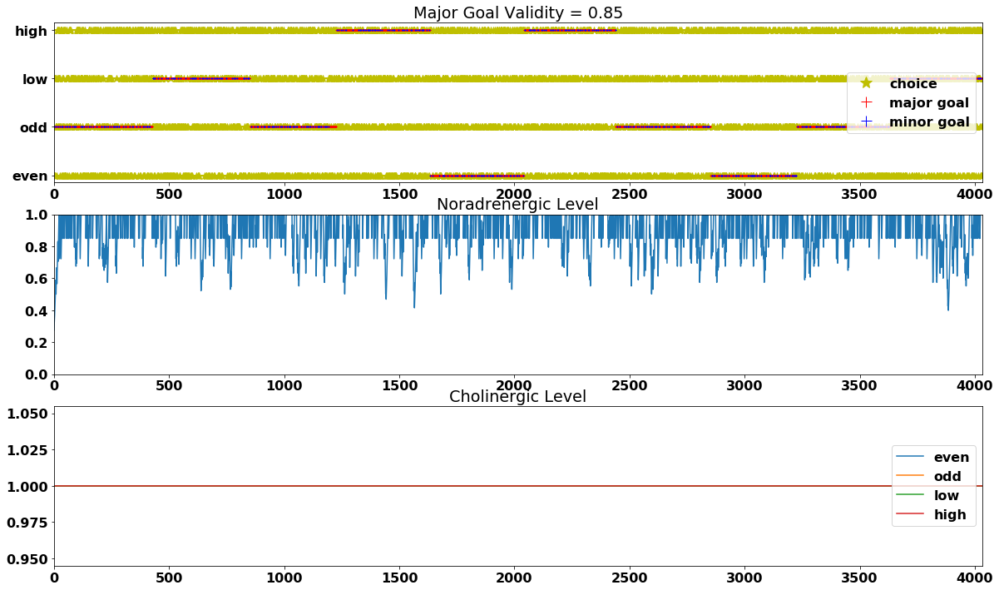

In [22]:
# trialRange+/-30 and single valid cue (7) 
model_copy = copy.deepcopy(model)
correct, choice, ach_level, ach_avg_level, ne_level, correct_lbl, acts_prob, all_prob_85_7 = MNIST_uncertainty_task(model_copy,dataloader,validity_choices=0.85,ACH_CORRECT=ACH_CORRECT,ACH_INCORRECT=ACH_INCORRECT,NE_INCORRECT=NE_INCORRECT,NE_CORRECT=NE_CORRECT,trialRange=trialRange,trialInterval=trialInterval,alterValid=alterValid,num_considered=num_considered,num_threshold=num_threshold, previous_intervals=all_prob_99_1[1],previous_cues=all_prob_99_1[2],hasAChLesion=hasAChLesion,hasNELesion=hasNELesion)
plot_MNIST_uncertainty(correct, choice, ach_level, ach_avg_level, ne_level, correct_lbl, acts_prob, validity_choices=0.85)


A cue was randomly picked among integers 0~3 (i.e. even, odd, low, high respectively) every 400+/-30 trials for 10 times.
The cue validity was randomly selected among 0.85 in each trial.
129/4032 = 3.2% trials occurred when the predicted digit matched the cued digit but the cue was invalid
3134/4032 = 77.7% trials occurred when the predicted digit did not match the cued digit.
    373/4032 trials occurred when the predicted digit did not match the guess-target digit.
    3026/4032 trials occurred when the guess-target digit did not match the cued digit, i.e. when the guessed action was wrong.
769/4032 = 19.1% trials occurred when the predicted digit matches the major cued digit and is valid
0/4032 = 0.0% trials occurred when the predicted digit matches the minor cued digit and is valid
Lag length for stable prediction of each major cue is: [428 422 374 406 407 176 412 372 404 400], and mean of lag length (excluding consistently same cue) is 380.1


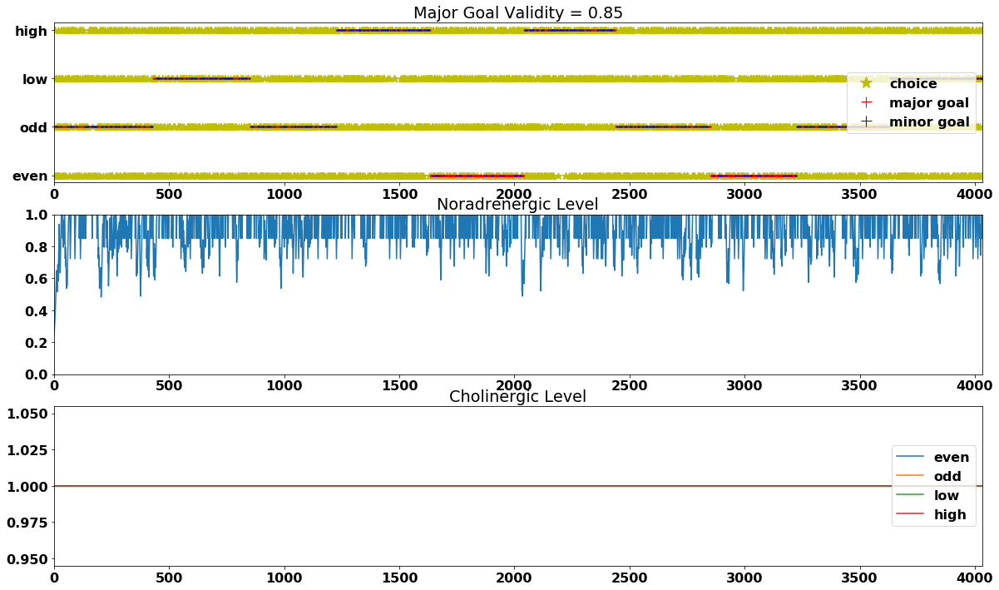

In [23]:
# trialRange+/-30 and single valid cue (8) 
model_copy = copy.deepcopy(model)
correct, choice, ach_level, ach_avg_level, ne_level, correct_lbl, acts_prob, all_prob_85_8 = MNIST_uncertainty_task(model_copy,dataloader,validity_choices=0.85,ACH_CORRECT=ACH_CORRECT,ACH_INCORRECT=ACH_INCORRECT,NE_INCORRECT=NE_INCORRECT,NE_CORRECT=NE_CORRECT,trialRange=trialRange,trialInterval=trialInterval,alterValid=alterValid,num_considered=num_considered,num_threshold=num_threshold, previous_intervals=all_prob_99_1[1],previous_cues=all_prob_99_1[2],hasAChLesion=hasAChLesion,hasNELesion=hasNELesion)
plot_MNIST_uncertainty(correct, choice, ach_level, ach_avg_level, ne_level, correct_lbl, acts_prob, validity_choices=0.85)


A cue was randomly picked among integers 0~3 (i.e. even, odd, low, high respectively) every 400+/-30 trials for 10 times.
The cue validity was randomly selected among 0.85 in each trial.
151/4032 = 3.7% trials occurred when the predicted digit matched the cued digit but the cue was invalid
3079/4032 = 76.4% trials occurred when the predicted digit did not match the cued digit.
    367/4032 trials occurred when the predicted digit did not match the guess-target digit.
    2983/4032 trials occurred when the guess-target digit did not match the cued digit, i.e. when the guessed action was wrong.
802/4032 = 19.9% trials occurred when the predicted digit matches the major cued digit and is valid
0/4032 = 0.0% trials occurred when the predicted digit matches the minor cued digit and is valid
Lag length for stable prediction of each major cue is: [311 422 374 406 407  46 412 372 404 400], and mean of lag length (excluding consistently same cue) is 360.3333333333333


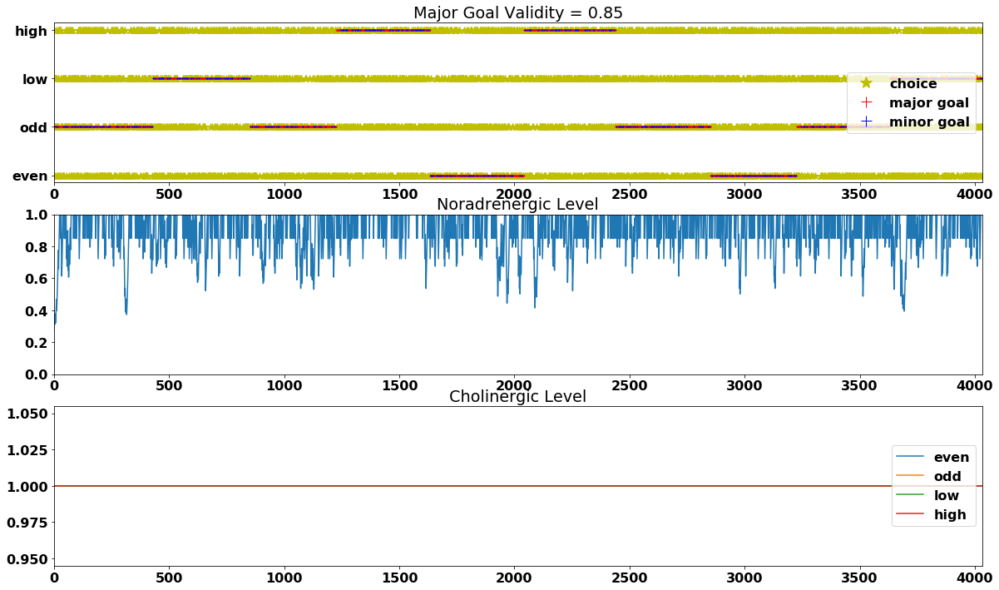

In [24]:
# trialRange+/-30 and single valid cue (9) 
model_copy = copy.deepcopy(model)
correct, choice, ach_level, ach_avg_level, ne_level, correct_lbl, acts_prob, all_prob_85_9 = MNIST_uncertainty_task(model_copy,dataloader,validity_choices=0.85,ACH_CORRECT=ACH_CORRECT,ACH_INCORRECT=ACH_INCORRECT,NE_INCORRECT=NE_INCORRECT,NE_CORRECT=NE_CORRECT,trialRange=trialRange,trialInterval=trialInterval,alterValid=alterValid,num_considered=num_considered,num_threshold=num_threshold, previous_intervals=all_prob_99_1[1],previous_cues=all_prob_99_1[2],hasAChLesion=hasAChLesion,hasNELesion=hasNELesion)
plot_MNIST_uncertainty(correct, choice, ach_level, ach_avg_level, ne_level, correct_lbl, acts_prob, validity_choices=0.85)


A cue was randomly picked among integers 0~3 (i.e. even, odd, low, high respectively) every 400+/-30 trials for 10 times.
The cue validity was randomly selected among 0.85 in each trial.
162/4032 = 4.0% trials occurred when the predicted digit matched the cued digit but the cue was invalid
3103/4032 = 77.0% trials occurred when the predicted digit did not match the cued digit.
    369/4032 trials occurred when the predicted digit did not match the guess-target digit.
    3013/4032 trials occurred when the guess-target digit did not match the cued digit, i.e. when the guessed action was wrong.
767/4032 = 19.0% trials occurred when the predicted digit matches the major cued digit and is valid
0/4032 = 0.0% trials occurred when the predicted digit matches the minor cued digit and is valid
Lag length for stable prediction of each major cue is: [428 422 374 406 407 397 363 372 404 400], and mean of lag length (excluding consistently same cue) is 397.3


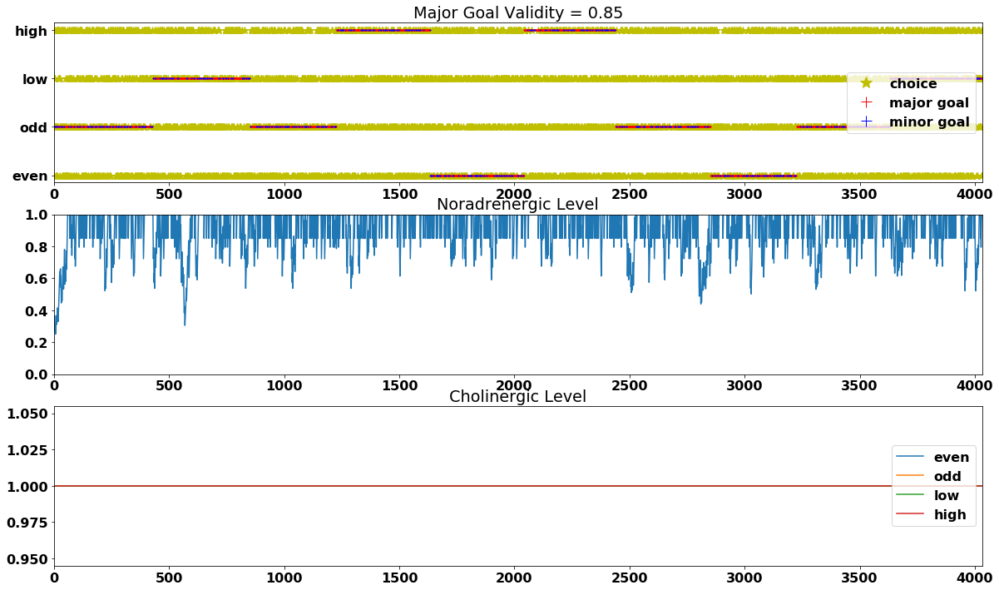

In [25]:
# trialRange+/-30 and single valid cue (10) 
model_copy = copy.deepcopy(model)
correct, choice, ach_level, ach_avg_level, ne_level, correct_lbl, acts_prob, all_prob_85_10 = MNIST_uncertainty_task(model_copy,dataloader,validity_choices=0.85,ACH_CORRECT=ACH_CORRECT,ACH_INCORRECT=ACH_INCORRECT,NE_INCORRECT=NE_INCORRECT,NE_CORRECT=NE_CORRECT,trialRange=trialRange,trialInterval=trialInterval,alterValid=alterValid,num_considered=num_considered,num_threshold=num_threshold, previous_intervals=all_prob_99_1[1],previous_cues=all_prob_99_1[2],hasAChLesion=hasAChLesion,hasNELesion=hasNELesion)
plot_MNIST_uncertainty(correct, choice, ach_level, ach_avg_level, ne_level, correct_lbl, acts_prob, validity_choices=0.85)


In [26]:
all_85_case_probs = [all_prob_85_1,all_prob_85_2,all_prob_85_3,all_prob_85_4,all_prob_85_5,\
                     all_prob_85_6,all_prob_85_7,all_prob_85_8,all_prob_85_9,all_prob_85_10]
averages_85 = average_probs(all_85_case_probs)


Average lag length is: 376
Average prob pred wrong, prob pred cue A valid, prob pred cue B valid, prob pred cue A invalid,
    prob guess not match cue, prob pred not match guess, prob match cue A invalid alter: 
[0.7705357142857143, 0.1954861111111111, 0.0, 0.0339781746031746, 0.7477182539682539, 0.09060019841269841, 0.0]


### 4.1.3: validity_choices=0.7

A cue was randomly picked among integers 0~3 (i.e. even, odd, low, high respectively) every 400+/-30 trials for 10 times.
The cue validity was randomly selected among 0.7 in each trial.
263/4032 = 6.5% trials occurred when the predicted digit matched the cued digit but the cue was invalid
3111/4032 = 77.2% trials occurred when the predicted digit did not match the cued digit.
    350/4032 trials occurred when the predicted digit did not match the guess-target digit.
    3034/4032 trials occurred when the guess-target digit did not match the cued digit, i.e. when the guessed action was wrong.
658/4032 = 16.3% trials occurred when the predicted digit matches the major cued digit and is valid
0/4032 = 0.0% trials occurred when the predicted digit matches the minor cued digit and is valid
Lag length for stable prediction of each major cue is: [428 422 374 406 407 397 412   8 404 400], and mean of lag length (excluding consistently same cue) is 365.8


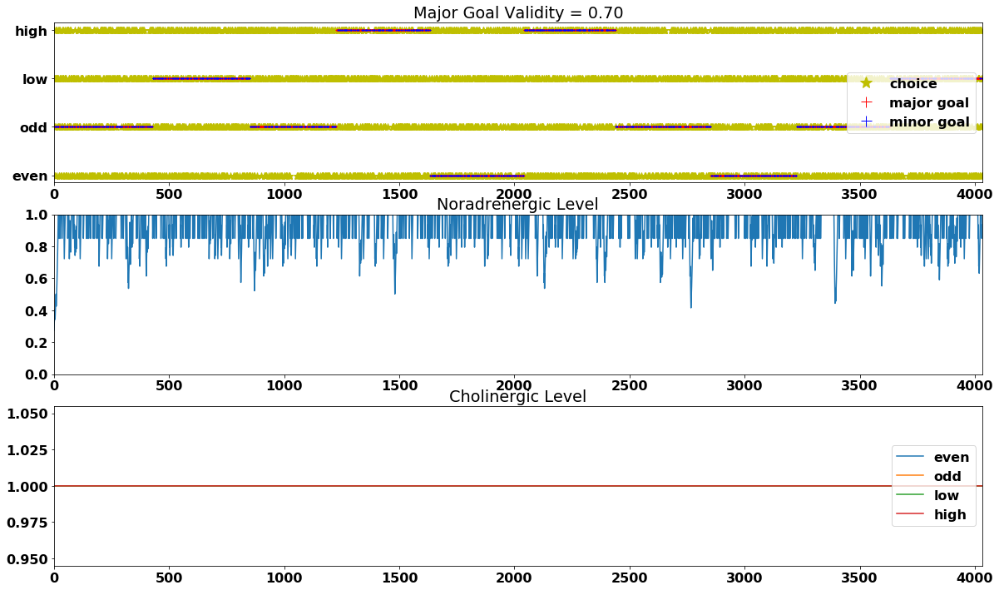

In [27]:
# trialRange+/-30 and single valid cue (1) 
model_copy = copy.deepcopy(model)
correct, choice, ach_level, ach_avg_level, ne_level, correct_lbl, acts_prob, all_prob_70_1 = MNIST_uncertainty_task(model_copy,dataloader,validity_choices=0.70,ACH_CORRECT=ACH_CORRECT,ACH_INCORRECT=ACH_INCORRECT,NE_INCORRECT=NE_INCORRECT,NE_CORRECT=NE_CORRECT,trialRange=trialRange,trialInterval=trialInterval,alterValid=alterValid,num_considered=num_considered,num_threshold=num_threshold, previous_intervals=all_prob_99_1[1],previous_cues=all_prob_99_1[2],hasAChLesion=hasAChLesion,hasNELesion=hasNELesion)
plot_MNIST_uncertainty(correct, choice, ach_level, ach_avg_level, ne_level, correct_lbl, acts_prob, validity_choices=0.70)


A cue was randomly picked among integers 0~3 (i.e. even, odd, low, high respectively) every 400+/-30 trials for 10 times.
The cue validity was randomly selected among 0.7 in each trial.
276/4032 = 6.8% trials occurred when the predicted digit matched the cued digit but the cue was invalid
3155/4032 = 78.2% trials occurred when the predicted digit did not match the cued digit.
    374/4032 trials occurred when the predicted digit did not match the guess-target digit.
    3064/4032 trials occurred when the guess-target digit did not match the cued digit, i.e. when the guessed action was wrong.
601/4032 = 14.9% trials occurred when the predicted digit matches the major cued digit and is valid
0/4032 = 0.0% trials occurred when the predicted digit matches the minor cued digit and is valid
Lag length for stable prediction of each major cue is: [428 422 374 406 407 397 412 372 404 400], and mean of lag length (excluding consistently same cue) is 402.2


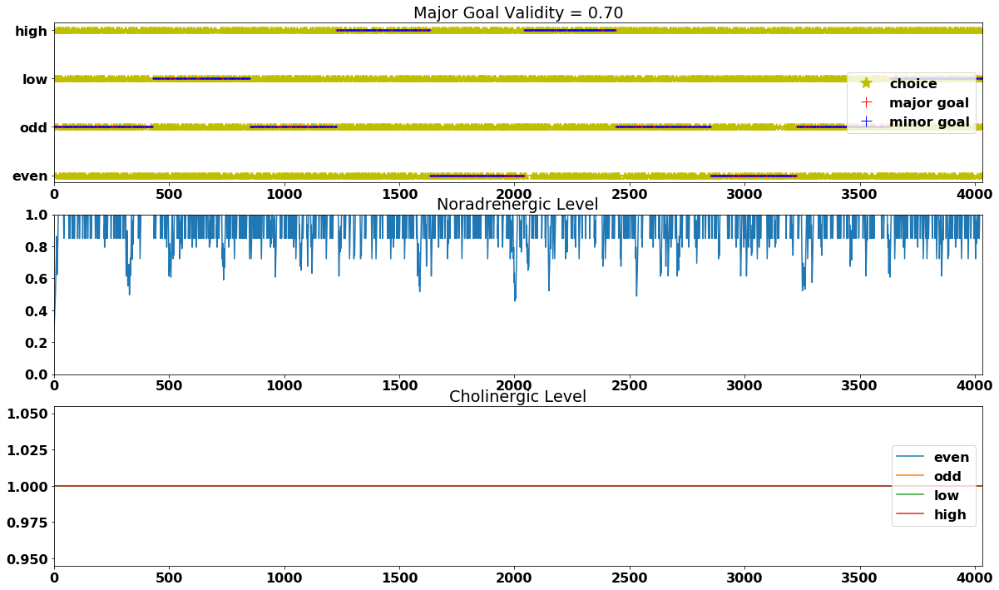

In [28]:
# trialRange+/-30 and single valid cue (2) 
model_copy = copy.deepcopy(model)
correct, choice, ach_level, ach_avg_level, ne_level, correct_lbl, acts_prob, all_prob_70_2 = MNIST_uncertainty_task(model_copy,dataloader,validity_choices=0.70,ACH_CORRECT=ACH_CORRECT,ACH_INCORRECT=ACH_INCORRECT,NE_INCORRECT=NE_INCORRECT,NE_CORRECT=NE_CORRECT,trialRange=trialRange,trialInterval=trialInterval,alterValid=alterValid,num_considered=num_considered,num_threshold=num_threshold, previous_intervals=all_prob_99_1[1],previous_cues=all_prob_99_1[2],hasAChLesion=hasAChLesion,hasNELesion=hasNELesion)
plot_MNIST_uncertainty(correct, choice, ach_level, ach_avg_level, ne_level, correct_lbl, acts_prob, validity_choices=0.70)


A cue was randomly picked among integers 0~3 (i.e. even, odd, low, high respectively) every 400+/-30 trials for 10 times.
The cue validity was randomly selected among 0.7 in each trial.
260/4032 = 6.4% trials occurred when the predicted digit matched the cued digit but the cue was invalid
3132/4032 = 77.7% trials occurred when the predicted digit did not match the cued digit.
    399/4032 trials occurred when the predicted digit did not match the guess-target digit.
    3030/4032 trials occurred when the guess-target digit did not match the cued digit, i.e. when the guessed action was wrong.
640/4032 = 15.9% trials occurred when the predicted digit matches the major cued digit and is valid
0/4032 = 0.0% trials occurred when the predicted digit matches the minor cued digit and is valid
Lag length for stable prediction of each major cue is: [428 422 374 406  44 397 153 372 404 400], and mean of lag length (excluding consistently same cue) is 340.0


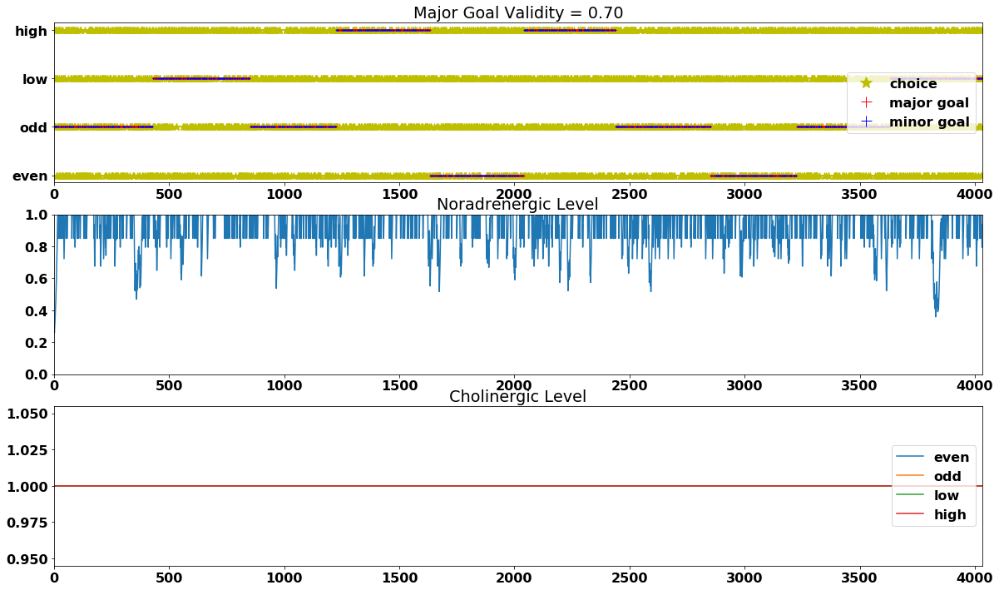

In [29]:
# trialRange+/-30 and single valid cue (3) 
model_copy = copy.deepcopy(model)
correct, choice, ach_level, ach_avg_level, ne_level, correct_lbl, acts_prob, all_prob_70_3 = MNIST_uncertainty_task(model_copy,dataloader,validity_choices=0.70,ACH_CORRECT=ACH_CORRECT,ACH_INCORRECT=ACH_INCORRECT,NE_INCORRECT=NE_INCORRECT,NE_CORRECT=NE_CORRECT,trialRange=trialRange,trialInterval=trialInterval,alterValid=alterValid,num_considered=num_considered,num_threshold=num_threshold, previous_intervals=all_prob_99_1[1],previous_cues=all_prob_99_1[2],hasAChLesion=hasAChLesion,hasNELesion=hasNELesion)
plot_MNIST_uncertainty(correct, choice, ach_level, ach_avg_level, ne_level, correct_lbl, acts_prob, validity_choices=0.70)


A cue was randomly picked among integers 0~3 (i.e. even, odd, low, high respectively) every 400+/-30 trials for 10 times.
The cue validity was randomly selected among 0.7 in each trial.
264/4032 = 6.5% trials occurred when the predicted digit matched the cued digit but the cue was invalid
3100/4032 = 76.9% trials occurred when the predicted digit did not match the cued digit.
    363/4032 trials occurred when the predicted digit did not match the guess-target digit.
    3011/4032 trials occurred when the guess-target digit did not match the cued digit, i.e. when the guessed action was wrong.
668/4032 = 16.6% trials occurred when the predicted digit matches the major cued digit and is valid
0/4032 = 0.0% trials occurred when the predicted digit matches the minor cued digit and is valid
Lag length for stable prediction of each major cue is: [428 422 309 406 407  21  46 372 404 400], and mean of lag length (excluding consistently same cue) is 321.5


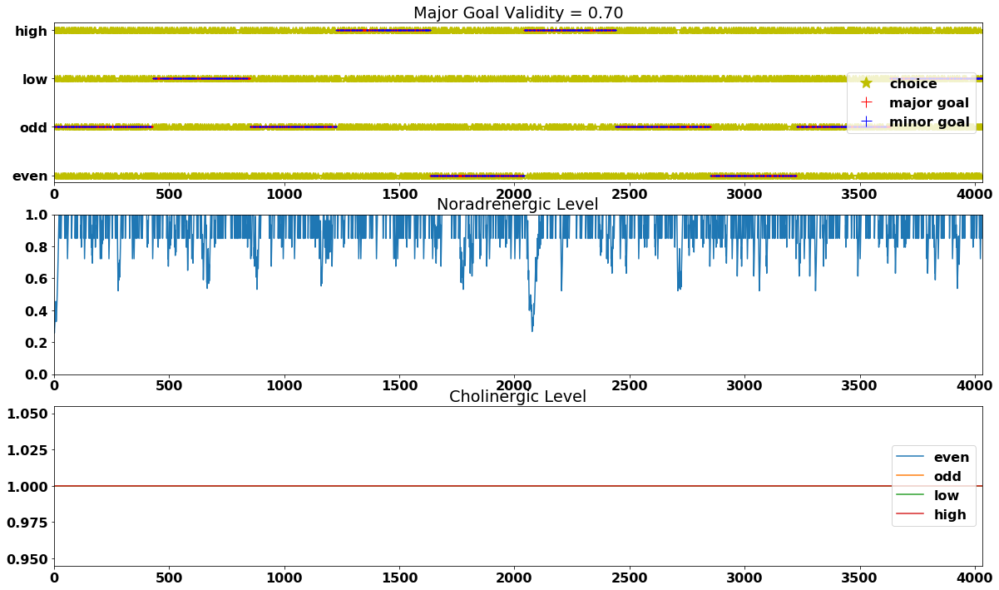

In [30]:
# trialRange+/-30 and single valid cue (4) 
model_copy = copy.deepcopy(model)
correct, choice, ach_level, ach_avg_level, ne_level, correct_lbl, acts_prob, all_prob_70_4 = MNIST_uncertainty_task(model_copy,dataloader,validity_choices=0.70,ACH_CORRECT=ACH_CORRECT,ACH_INCORRECT=ACH_INCORRECT,NE_INCORRECT=NE_INCORRECT,NE_CORRECT=NE_CORRECT,trialRange=trialRange,trialInterval=trialInterval,alterValid=alterValid,num_considered=num_considered,num_threshold=num_threshold, previous_intervals=all_prob_99_1[1],previous_cues=all_prob_99_1[2],hasAChLesion=hasAChLesion,hasNELesion=hasNELesion)
plot_MNIST_uncertainty(correct, choice, ach_level, ach_avg_level, ne_level, correct_lbl, acts_prob, validity_choices=0.70)


A cue was randomly picked among integers 0~3 (i.e. even, odd, low, high respectively) every 400+/-30 trials for 10 times.
The cue validity was randomly selected among 0.7 in each trial.
289/4032 = 7.2% trials occurred when the predicted digit matched the cued digit but the cue was invalid
3127/4032 = 77.6% trials occurred when the predicted digit did not match the cued digit.
    368/4032 trials occurred when the predicted digit did not match the guess-target digit.
    3037/4032 trials occurred when the guess-target digit did not match the cued digit, i.e. when the guessed action was wrong.
616/4032 = 15.3% trials occurred when the predicted digit matches the major cued digit and is valid
0/4032 = 0.0% trials occurred when the predicted digit matches the minor cued digit and is valid
Lag length for stable prediction of each major cue is: [428 422 374 406 407 397 412 372 404 400], and mean of lag length (excluding consistently same cue) is 402.2


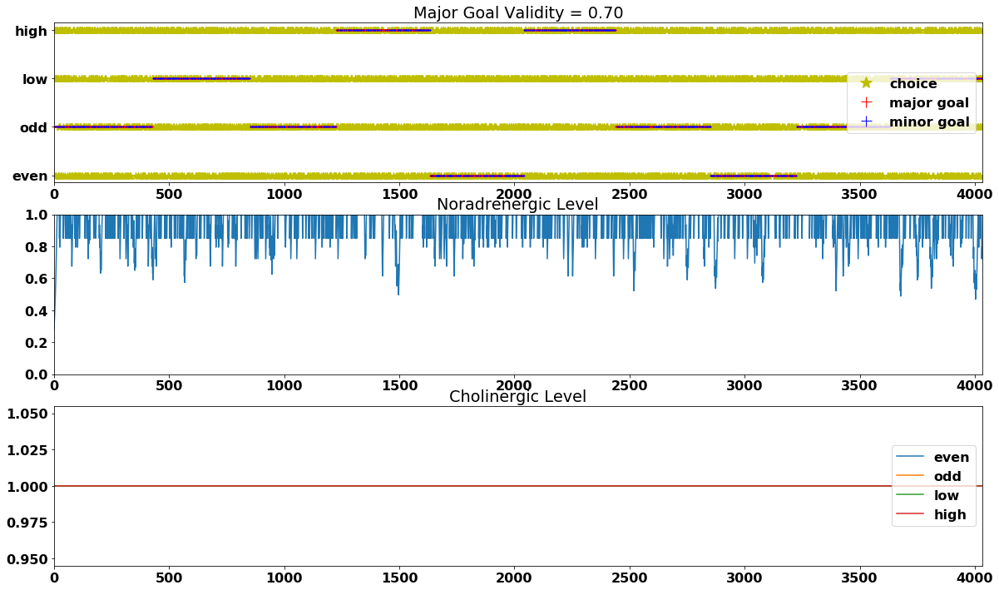

In [31]:
# trialRange+/-30 and single valid cue (5) 
model_copy = copy.deepcopy(model)
correct, choice, ach_level, ach_avg_level, ne_level, correct_lbl, acts_prob, all_prob_70_5 = MNIST_uncertainty_task(model_copy,dataloader,validity_choices=0.70,ACH_CORRECT=ACH_CORRECT,ACH_INCORRECT=ACH_INCORRECT,NE_INCORRECT=NE_INCORRECT,NE_CORRECT=NE_CORRECT,trialRange=trialRange,trialInterval=trialInterval,alterValid=alterValid,num_considered=num_considered,num_threshold=num_threshold, previous_intervals=all_prob_99_1[1],previous_cues=all_prob_99_1[2],hasAChLesion=hasAChLesion,hasNELesion=hasNELesion)
plot_MNIST_uncertainty(correct, choice, ach_level, ach_avg_level, ne_level, correct_lbl, acts_prob, validity_choices=0.70)


A cue was randomly picked among integers 0~3 (i.e. even, odd, low, high respectively) every 400+/-30 trials for 10 times.
The cue validity was randomly selected among 0.7 in each trial.
287/4032 = 7.1% trials occurred when the predicted digit matched the cued digit but the cue was invalid
3125/4032 = 77.5% trials occurred when the predicted digit did not match the cued digit.
    369/4032 trials occurred when the predicted digit did not match the guess-target digit.
    3040/4032 trials occurred when the guess-target digit did not match the cued digit, i.e. when the guessed action was wrong.
620/4032 = 15.4% trials occurred when the predicted digit matches the major cued digit and is valid
0/4032 = 0.0% trials occurred when the predicted digit matches the minor cued digit and is valid
Lag length for stable prediction of each major cue is: [428 422 374 406 407 397 412 372 404 400], and mean of lag length (excluding consistently same cue) is 402.2


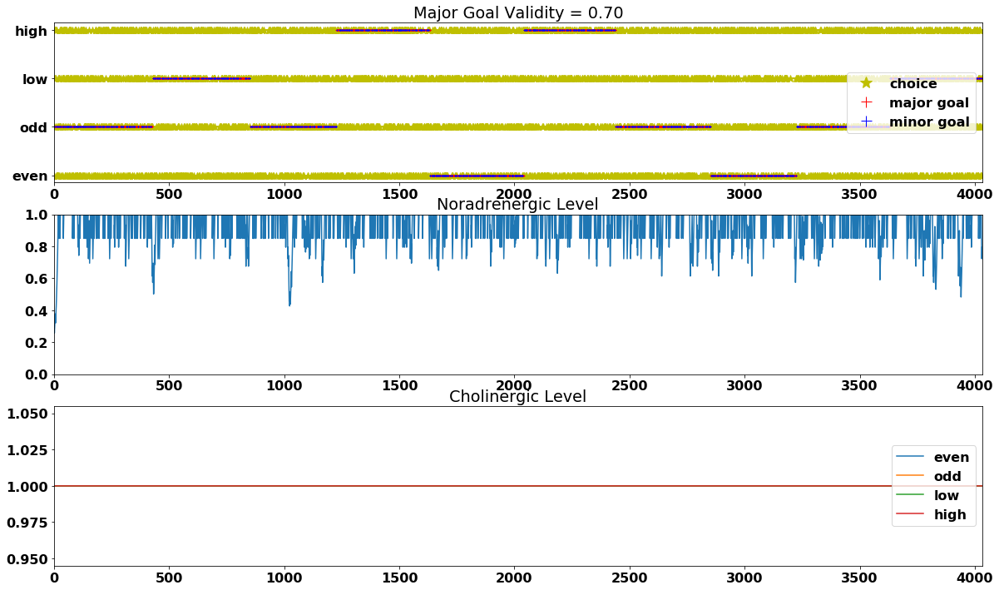

In [32]:
# trialRange+/-30 and single valid cue (6) 
model_copy = copy.deepcopy(model)
correct, choice, ach_level, ach_avg_level, ne_level, correct_lbl, acts_prob, all_prob_70_6 = MNIST_uncertainty_task(model_copy,dataloader,validity_choices=0.70,ACH_CORRECT=ACH_CORRECT,ACH_INCORRECT=ACH_INCORRECT,NE_INCORRECT=NE_INCORRECT,NE_CORRECT=NE_CORRECT,trialRange=trialRange,trialInterval=trialInterval,alterValid=alterValid,num_considered=num_considered,num_threshold=num_threshold, previous_intervals=all_prob_99_1[1],previous_cues=all_prob_99_1[2],hasAChLesion=hasAChLesion,hasNELesion=hasNELesion)
plot_MNIST_uncertainty(correct, choice, ach_level, ach_avg_level, ne_level, correct_lbl, acts_prob, validity_choices=0.70)


A cue was randomly picked among integers 0~3 (i.e. even, odd, low, high respectively) every 400+/-30 trials for 10 times.
The cue validity was randomly selected among 0.7 in each trial.
267/4032 = 6.6% trials occurred when the predicted digit matched the cued digit but the cue was invalid
3111/4032 = 77.2% trials occurred when the predicted digit did not match the cued digit.
    354/4032 trials occurred when the predicted digit did not match the guess-target digit.
    3024/4032 trials occurred when the guess-target digit did not match the cued digit, i.e. when the guessed action was wrong.
654/4032 = 16.2% trials occurred when the predicted digit matches the major cued digit and is valid
0/4032 = 0.0% trials occurred when the predicted digit matches the minor cued digit and is valid
Lag length for stable prediction of each major cue is: [428 422 374 406 407 397 412 372 404 400], and mean of lag length (excluding consistently same cue) is 402.2


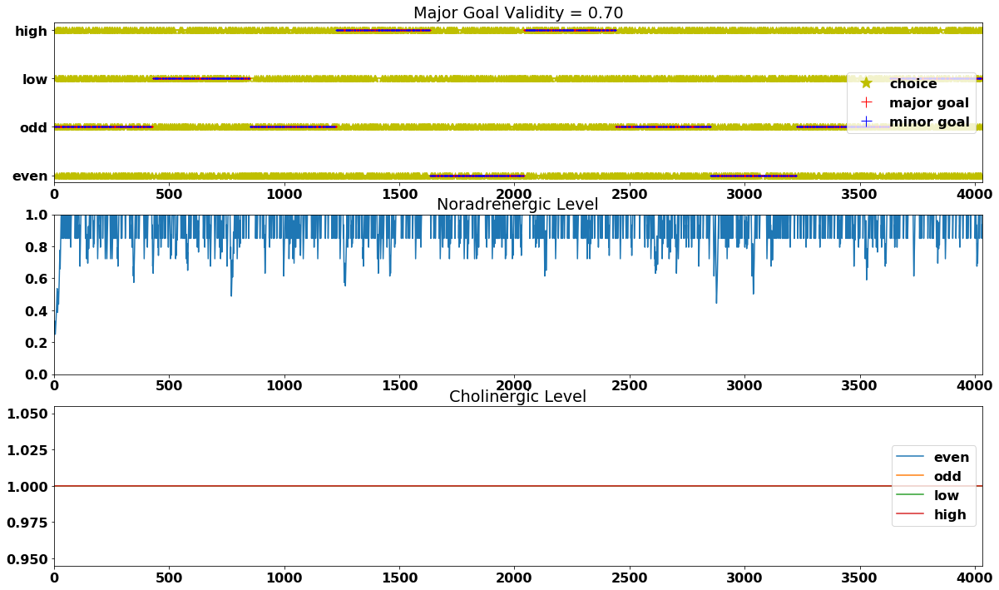

In [33]:
# trialRange+/-30 and single valid cue (7) 
model_copy = copy.deepcopy(model)
correct, choice, ach_level, ach_avg_level, ne_level, correct_lbl, acts_prob, all_prob_70_7 = MNIST_uncertainty_task(model_copy,dataloader,validity_choices=0.70,ACH_CORRECT=ACH_CORRECT,ACH_INCORRECT=ACH_INCORRECT,NE_INCORRECT=NE_INCORRECT,NE_CORRECT=NE_CORRECT,trialRange=trialRange,trialInterval=trialInterval,alterValid=alterValid,num_considered=num_considered,num_threshold=num_threshold, previous_intervals=all_prob_99_1[1],previous_cues=all_prob_99_1[2],hasAChLesion=hasAChLesion,hasNELesion=hasNELesion)
plot_MNIST_uncertainty(correct, choice, ach_level, ach_avg_level, ne_level, correct_lbl, acts_prob, validity_choices=0.70)


A cue was randomly picked among integers 0~3 (i.e. even, odd, low, high respectively) every 400+/-30 trials for 10 times.
The cue validity was randomly selected among 0.7 in each trial.
268/4032 = 6.6% trials occurred when the predicted digit matched the cued digit but the cue was invalid
3151/4032 = 78.1% trials occurred when the predicted digit did not match the cued digit.
    355/4032 trials occurred when the predicted digit did not match the guess-target digit.
    3068/4032 trials occurred when the guess-target digit did not match the cued digit, i.e. when the guessed action was wrong.
613/4032 = 15.2% trials occurred when the predicted digit matches the major cued digit and is valid
0/4032 = 0.0% trials occurred when the predicted digit matches the minor cued digit and is valid
Lag length for stable prediction of each major cue is: [428 422 374 406 407 397 412 372 404 400], and mean of lag length (excluding consistently same cue) is 402.2


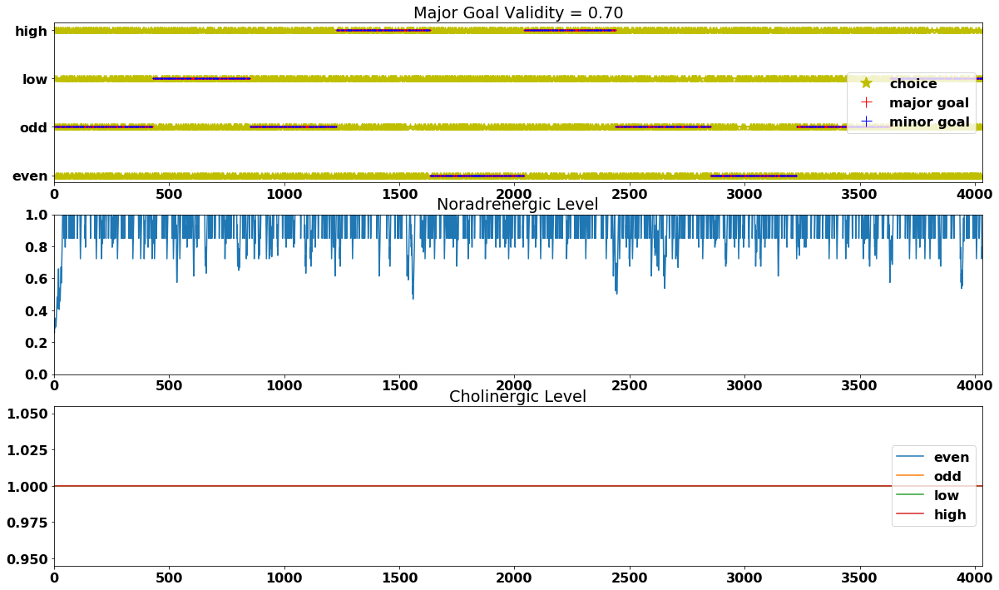

In [34]:
# trialRange+/-30 and single valid cue (8) 
model_copy = copy.deepcopy(model)
correct, choice, ach_level, ach_avg_level, ne_level, correct_lbl, acts_prob, all_prob_70_8 = MNIST_uncertainty_task(model_copy,dataloader,validity_choices=0.70,ACH_CORRECT=ACH_CORRECT,ACH_INCORRECT=ACH_INCORRECT,NE_INCORRECT=NE_INCORRECT,NE_CORRECT=NE_CORRECT,trialRange=trialRange,trialInterval=trialInterval,alterValid=alterValid,num_considered=num_considered,num_threshold=num_threshold, previous_intervals=all_prob_99_1[1],previous_cues=all_prob_99_1[2],hasAChLesion=hasAChLesion,hasNELesion=hasNELesion)
plot_MNIST_uncertainty(correct, choice, ach_level, ach_avg_level, ne_level, correct_lbl, acts_prob, validity_choices=0.70)


A cue was randomly picked among integers 0~3 (i.e. even, odd, low, high respectively) every 400+/-30 trials for 10 times.
The cue validity was randomly selected among 0.7 in each trial.
284/4032 = 7.0% trials occurred when the predicted digit matched the cued digit but the cue was invalid
3111/4032 = 77.2% trials occurred when the predicted digit did not match the cued digit.
    354/4032 trials occurred when the predicted digit did not match the guess-target digit.
    3032/4032 trials occurred when the guess-target digit did not match the cued digit, i.e. when the guessed action was wrong.
637/4032 = 15.8% trials occurred when the predicted digit matches the major cued digit and is valid
0/4032 = 0.0% trials occurred when the predicted digit matches the minor cued digit and is valid
Lag length for stable prediction of each major cue is: [428 422 374 406  69 397 412 372 404 400], and mean of lag length (excluding consistently same cue) is 368.4


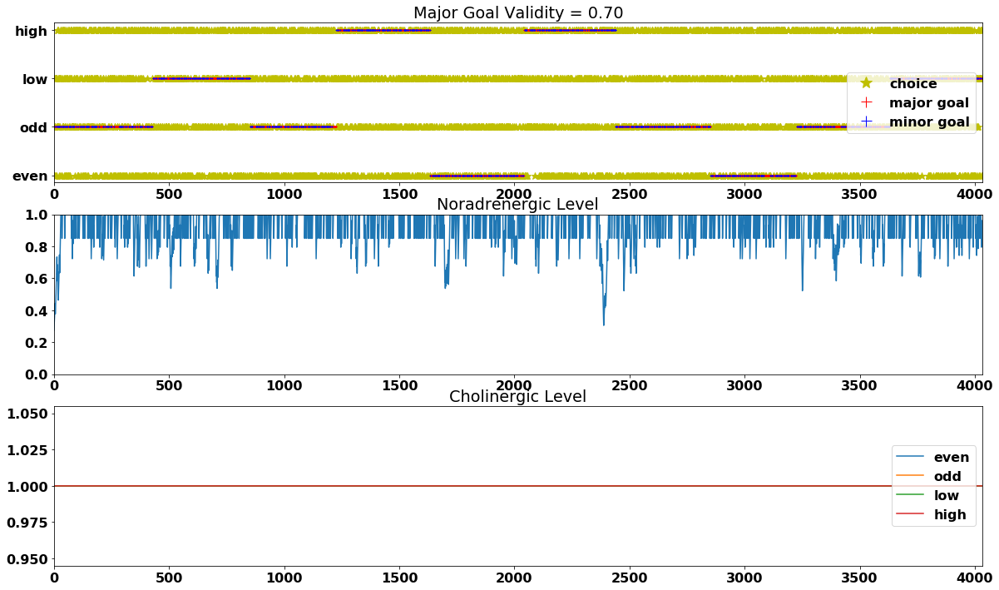

In [35]:
# trialRange+/-30 and single valid cue (9) 
model_copy = copy.deepcopy(model)
correct, choice, ach_level, ach_avg_level, ne_level, correct_lbl, acts_prob, all_prob_70_9 = MNIST_uncertainty_task(model_copy,dataloader,validity_choices=0.70,ACH_CORRECT=ACH_CORRECT,ACH_INCORRECT=ACH_INCORRECT,NE_INCORRECT=NE_INCORRECT,NE_CORRECT=NE_CORRECT,trialRange=trialRange,trialInterval=trialInterval,alterValid=alterValid,num_considered=num_considered,num_threshold=num_threshold, previous_intervals=all_prob_99_1[1],previous_cues=all_prob_99_1[2],hasAChLesion=hasAChLesion,hasNELesion=hasNELesion)
plot_MNIST_uncertainty(correct, choice, ach_level, ach_avg_level, ne_level, correct_lbl, acts_prob, validity_choices=0.70)


A cue was randomly picked among integers 0~3 (i.e. even, odd, low, high respectively) every 400+/-30 trials for 10 times.
The cue validity was randomly selected among 0.7 in each trial.
303/4032 = 7.5% trials occurred when the predicted digit matched the cued digit but the cue was invalid
3084/4032 = 76.5% trials occurred when the predicted digit did not match the cued digit.
    367/4032 trials occurred when the predicted digit did not match the guess-target digit.
    2997/4032 trials occurred when the guess-target digit did not match the cued digit, i.e. when the guessed action was wrong.
645/4032 = 16.0% trials occurred when the predicted digit matches the major cued digit and is valid
0/4032 = 0.0% trials occurred when the predicted digit matches the minor cued digit and is valid
Lag length for stable prediction of each major cue is: [428 422 374 362 407 397 412 372 404 400], and mean of lag length (excluding consistently same cue) is 397.8


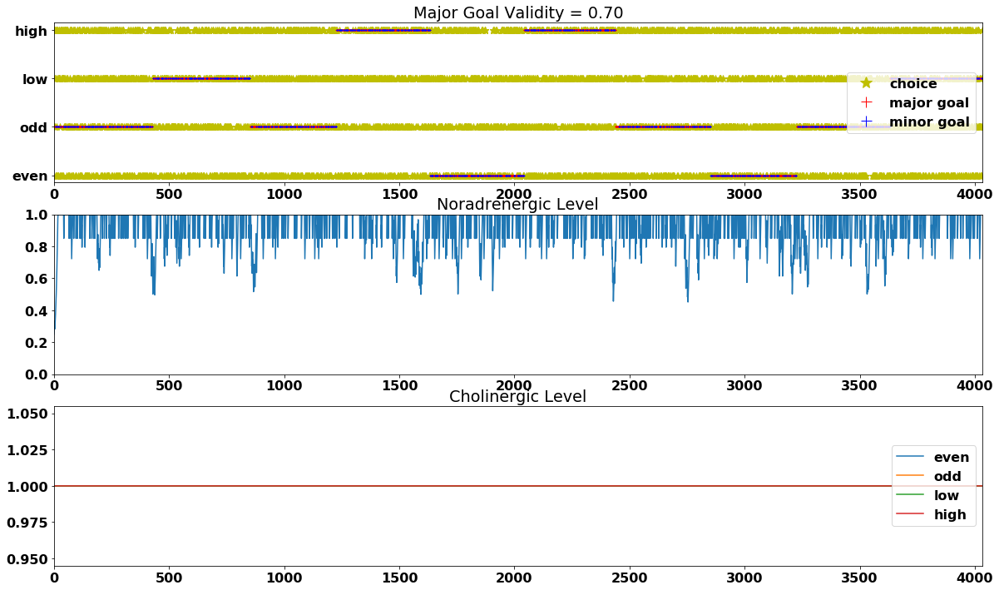

In [36]:
# trialRange+/-30 and single valid cue (10) 
model_copy = copy.deepcopy(model)
correct, choice, ach_level, ach_avg_level, ne_level, correct_lbl, acts_prob, all_prob_70_10 = MNIST_uncertainty_task(model_copy,dataloader,validity_choices=0.70,ACH_CORRECT=ACH_CORRECT,ACH_INCORRECT=ACH_INCORRECT,NE_INCORRECT=NE_INCORRECT,NE_CORRECT=NE_CORRECT,trialRange=trialRange,trialInterval=trialInterval,alterValid=alterValid,num_considered=num_considered,num_threshold=num_threshold, previous_intervals=all_prob_99_1[1],previous_cues=all_prob_99_1[2],hasAChLesion=hasAChLesion,hasNELesion=hasNELesion)
plot_MNIST_uncertainty(correct, choice, ach_level, ach_avg_level, ne_level, correct_lbl, acts_prob, validity_choices=0.70)


In [37]:
all_70_case_probs = [all_prob_70_1,all_prob_70_2,all_prob_70_3,all_prob_70_4,all_prob_70_5,\
                     all_prob_70_6,all_prob_70_7,all_prob_70_8,all_prob_70_9,all_prob_70_10]
averages_70 = average_probs(all_70_case_probs)


Average lag length is: 380
Average prob pred wrong, prob pred cue A valid, prob pred cue B valid, prob pred cue A invalid,
    prob guess not match cue, prob pred not match guess, prob match cue A invalid alter: 
[0.773983134920635, 0.15753968253968256, 0.0, 0.06847718253968253, 0.7524057539682539, 0.09060019841269841, 0.0]


### 4.1.4: validity_choices=[0.99, 0.85, 0.70]

A cue was randomly picked among integers 0~3 (i.e. even, odd, low, high respectively) every 400+/-30 trials for 10 times.
The cue validity was randomly selected among [0.99, 0.85, 0.7] in each trial.
163/4032 = 4.0% trials occurred when the predicted digit matched the cued digit but the cue was invalid
3122/4032 = 77.4% trials occurred when the predicted digit did not match the cued digit.
    356/4032 trials occurred when the predicted digit did not match the guess-target digit.
    3011/4032 trials occurred when the guess-target digit did not match the cued digit, i.e. when the guessed action was wrong.
747/4032 = 18.5% trials occurred when the predicted digit matches the major cued digit and is valid
0/4032 = 0.0% trials occurred when the predicted digit matches the minor cued digit and is valid
Lag length for stable prediction of each major cue is: [428 235 374 406 407 397 132 238 404 400], and mean of lag length (excluding consistently same cue) is 342.1


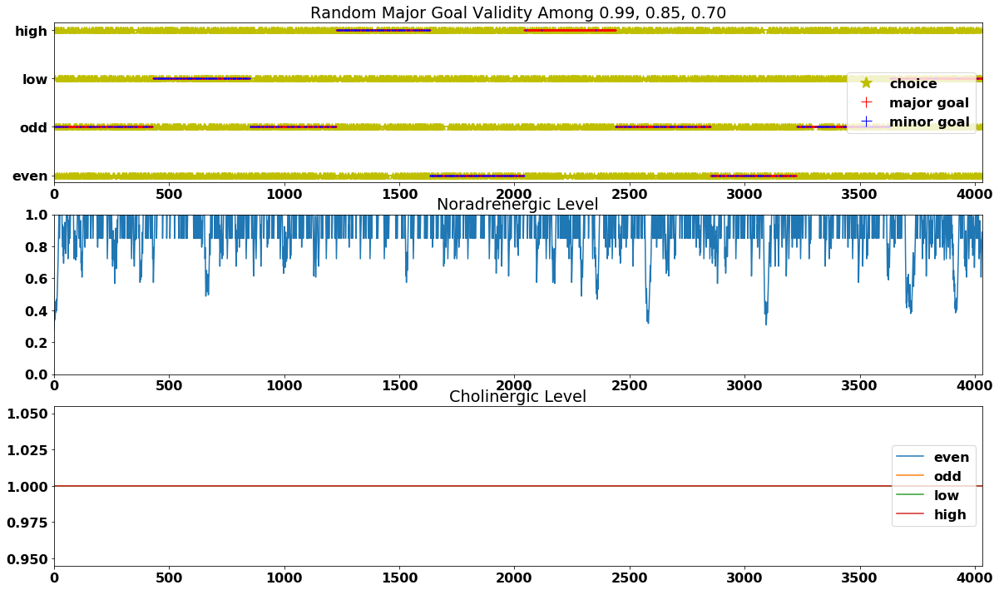

In [38]:
# trialRange+/-30 and single valid cue (1) 
model_copy = copy.deepcopy(model)
correct, choice, ach_level, ach_avg_level, ne_level, correct_lbl, acts_prob, all_prob_multi_1 = MNIST_uncertainty_task(model_copy,dataloader,validity_choices=[0.99,0.85,0.70],ACH_CORRECT=ACH_CORRECT,ACH_INCORRECT=ACH_INCORRECT,NE_INCORRECT=NE_INCORRECT,NE_CORRECT=NE_CORRECT,trialRange=trialRange,trialInterval=trialInterval,alterValid=alterValid,num_considered=num_considered,num_threshold=num_threshold,previous_intervals=all_prob_99_1[1],previous_cues=all_prob_99_1[2],hasAChLesion=hasAChLesion,hasNELesion=hasNELesion)
plot_MNIST_uncertainty(correct, choice, ach_level, ach_avg_level, ne_level, correct_lbl, acts_prob, validity_choices=[0.99,0.85,0.70])


A cue was randomly picked among integers 0~3 (i.e. even, odd, low, high respectively) every 400+/-30 trials for 10 times.
The cue validity was randomly selected among [0.99, 0.85, 0.7] in each trial.
66/4032 = 1.6% trials occurred when the predicted digit matched the cued digit but the cue was invalid
3132/4032 = 77.7% trials occurred when the predicted digit did not match the cued digit.
    347/4032 trials occurred when the predicted digit did not match the guess-target digit.
    3048/4032 trials occurred when the guess-target digit did not match the cued digit, i.e. when the guessed action was wrong.
834/4032 = 20.7% trials occurred when the predicted digit matches the major cued digit and is valid
0/4032 = 0.0% trials occurred when the predicted digit matches the minor cued digit and is valid
Lag length for stable prediction of each major cue is: [428 422 374 406 212 397 412 372 404 400], and mean of lag length (excluding consistently same cue) is 382.7


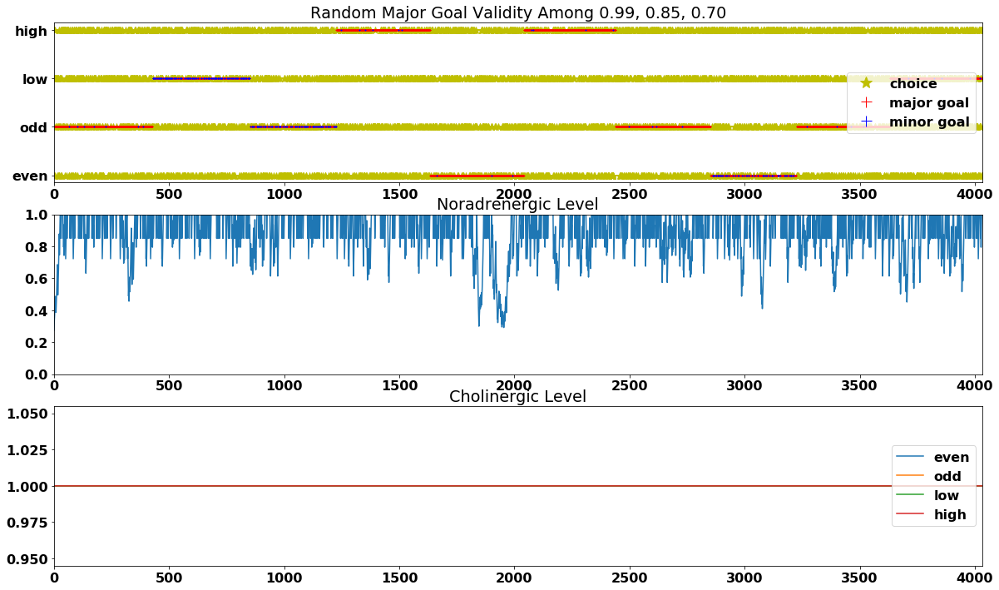

In [39]:
# trialRange+/-30 and single valid cue (2) 
model_copy = copy.deepcopy(model)
correct, choice, ach_level, ach_avg_level, ne_level, correct_lbl, acts_prob, all_prob_multi_2 = MNIST_uncertainty_task(model_copy,dataloader,validity_choices=[0.99,0.85,0.70],ACH_CORRECT=ACH_CORRECT,ACH_INCORRECT=ACH_INCORRECT,NE_INCORRECT=NE_INCORRECT,NE_CORRECT=NE_CORRECT,trialRange=trialRange,trialInterval=trialInterval,alterValid=alterValid,num_considered=num_considered,num_threshold=num_threshold,previous_intervals=all_prob_99_1[1],previous_cues=all_prob_99_1[2],hasAChLesion=hasAChLesion,hasNELesion=hasNELesion)
plot_MNIST_uncertainty(correct, choice, ach_level, ach_avg_level, ne_level, correct_lbl, acts_prob, validity_choices=[0.99,0.85,0.70])


A cue was randomly picked among integers 0~3 (i.e. even, odd, low, high respectively) every 400+/-30 trials for 10 times.
The cue validity was randomly selected among [0.99, 0.85, 0.7] in each trial.
58/4032 = 1.4% trials occurred when the predicted digit matched the cued digit but the cue was invalid
3127/4032 = 77.6% trials occurred when the predicted digit did not match the cued digit.
    360/4032 trials occurred when the predicted digit did not match the guess-target digit.
    3045/4032 trials occurred when the guess-target digit did not match the cued digit, i.e. when the guessed action was wrong.
847/4032 = 21.0% trials occurred when the predicted digit matches the major cued digit and is valid
0/4032 = 0.0% trials occurred when the predicted digit matches the minor cued digit and is valid
Lag length for stable prediction of each major cue is: [428 422 374 406 407 397 412 372 404 400], and mean of lag length (excluding consistently same cue) is 402.2


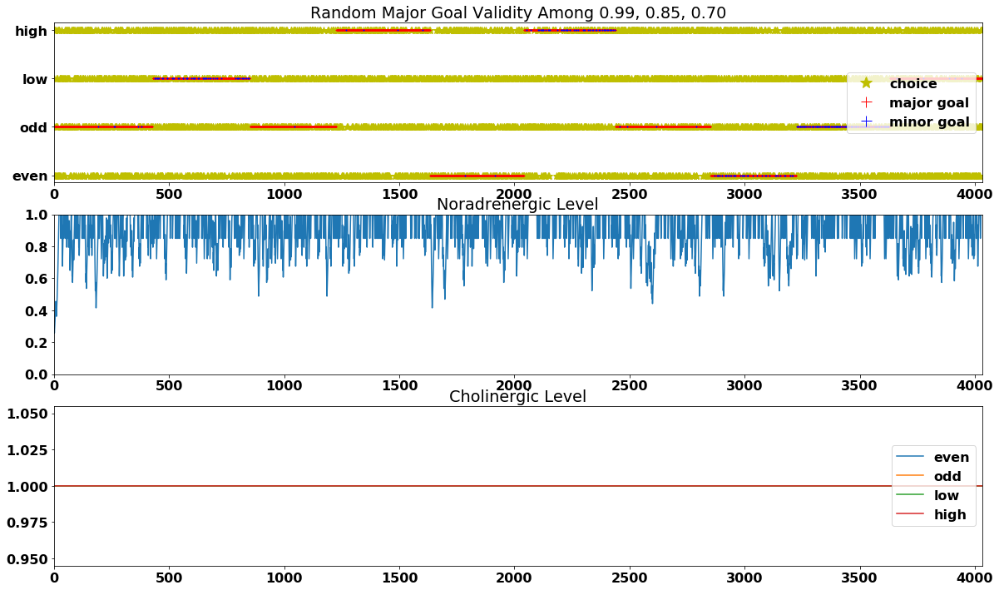

In [40]:
# trialRange+/-30 and single valid cue (3) 
model_copy = copy.deepcopy(model)
correct, choice, ach_level, ach_avg_level, ne_level, correct_lbl, acts_prob, all_prob_multi_3 = MNIST_uncertainty_task(model_copy,dataloader,validity_choices=[0.99,0.85,0.70],ACH_CORRECT=ACH_CORRECT,ACH_INCORRECT=ACH_INCORRECT,NE_INCORRECT=NE_INCORRECT,NE_CORRECT=NE_CORRECT,trialRange=trialRange,trialInterval=trialInterval,alterValid=alterValid,num_considered=num_considered,num_threshold=num_threshold,previous_intervals=all_prob_99_1[1],previous_cues=all_prob_99_1[2],hasAChLesion=hasAChLesion,hasNELesion=hasNELesion)
plot_MNIST_uncertainty(correct, choice, ach_level, ach_avg_level, ne_level, correct_lbl, acts_prob, validity_choices=[0.99,0.85,0.70])


A cue was randomly picked among integers 0~3 (i.e. even, odd, low, high respectively) every 400+/-30 trials for 10 times.
The cue validity was randomly selected among [0.99, 0.85, 0.7] in each trial.
123/4032 = 3.1% trials occurred when the predicted digit matched the cued digit but the cue was invalid
3095/4032 = 76.8% trials occurred when the predicted digit did not match the cued digit.
    398/4032 trials occurred when the predicted digit did not match the guess-target digit.
    2989/4032 trials occurred when the guess-target digit did not match the cued digit, i.e. when the guessed action was wrong.
814/4032 = 20.2% trials occurred when the predicted digit matches the major cued digit and is valid
0/4032 = 0.0% trials occurred when the predicted digit matches the minor cued digit and is valid
Lag length for stable prediction of each major cue is: [285 422 374 406 407 397 412 372 396 400], and mean of lag length (excluding consistently same cue) is 398.44444444444446


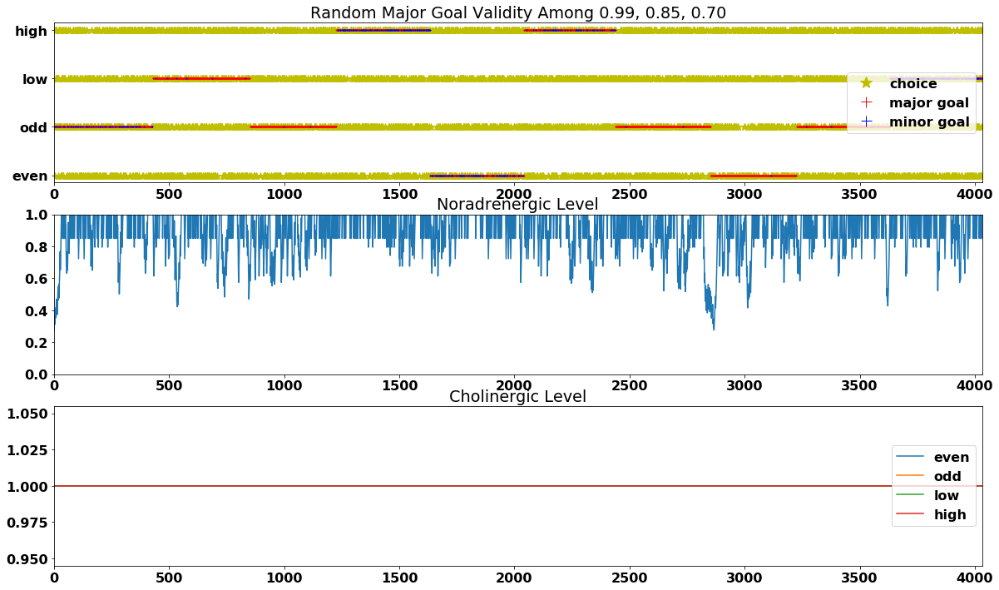

In [41]:
# trialRange+/-30 and single valid cue (4) 
model_copy = copy.deepcopy(model)
correct, choice, ach_level, ach_avg_level, ne_level, correct_lbl, acts_prob, all_prob_multi_4 = MNIST_uncertainty_task(model_copy,dataloader,validity_choices=[0.99,0.85,0.70],ACH_CORRECT=ACH_CORRECT,ACH_INCORRECT=ACH_INCORRECT,NE_INCORRECT=NE_INCORRECT,NE_CORRECT=NE_CORRECT,trialRange=trialRange,trialInterval=trialInterval,alterValid=alterValid,num_considered=num_considered,num_threshold=num_threshold,previous_intervals=all_prob_99_1[1],previous_cues=all_prob_99_1[2],hasAChLesion=hasAChLesion,hasNELesion=hasNELesion)
plot_MNIST_uncertainty(correct, choice, ach_level, ach_avg_level, ne_level, correct_lbl, acts_prob, validity_choices=[0.99,0.85,0.70])


A cue was randomly picked among integers 0~3 (i.e. even, odd, low, high respectively) every 400+/-30 trials for 10 times.
The cue validity was randomly selected among [0.99, 0.85, 0.7] in each trial.
151/4032 = 3.7% trials occurred when the predicted digit matched the cued digit but the cue was invalid
3090/4032 = 76.6% trials occurred when the predicted digit did not match the cued digit.
    348/4032 trials occurred when the predicted digit did not match the guess-target digit.
    2999/4032 trials occurred when the guess-target digit did not match the cued digit, i.e. when the guessed action was wrong.
791/4032 = 19.6% trials occurred when the predicted digit matches the major cued digit and is valid
0/4032 = 0.0% trials occurred when the predicted digit matches the minor cued digit and is valid
Lag length for stable prediction of each major cue is: [300  32 374 406 407 397 412 372 404 400], and mean of lag length (excluding consistently same cue) is 356.0


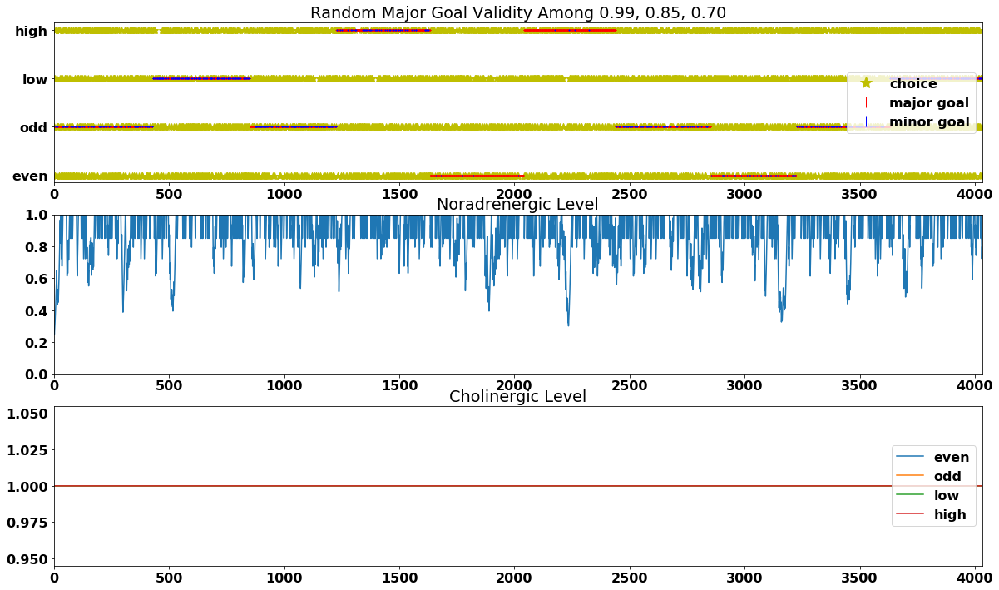

In [42]:
# trialRange+/-30 and single valid cue (5) 
model_copy = copy.deepcopy(model)
correct, choice, ach_level, ach_avg_level, ne_level, correct_lbl, acts_prob, all_prob_multi_5 = MNIST_uncertainty_task(model_copy,dataloader,validity_choices=[0.99,0.85,0.70],ACH_CORRECT=ACH_CORRECT,ACH_INCORRECT=ACH_INCORRECT,NE_INCORRECT=NE_INCORRECT,NE_CORRECT=NE_CORRECT,trialRange=trialRange,trialInterval=trialInterval,alterValid=alterValid,num_considered=num_considered,num_threshold=num_threshold,previous_intervals=all_prob_99_1[1],previous_cues=all_prob_99_1[2],hasAChLesion=hasAChLesion,hasNELesion=hasNELesion)
plot_MNIST_uncertainty(correct, choice, ach_level, ach_avg_level, ne_level, correct_lbl, acts_prob, validity_choices=[0.99,0.85,0.70])


A cue was randomly picked among integers 0~3 (i.e. even, odd, low, high respectively) every 400+/-30 trials for 10 times.
The cue validity was randomly selected among [0.99, 0.85, 0.7] in each trial.
152/4032 = 3.8% trials occurred when the predicted digit matched the cued digit but the cue was invalid
3127/4032 = 77.6% trials occurred when the predicted digit did not match the cued digit.
    332/4032 trials occurred when the predicted digit did not match the guess-target digit.
    3051/4032 trials occurred when the guess-target digit did not match the cued digit, i.e. when the guessed action was wrong.
753/4032 = 18.7% trials occurred when the predicted digit matches the major cued digit and is valid
0/4032 = 0.0% trials occurred when the predicted digit matches the minor cued digit and is valid
Lag length for stable prediction of each major cue is: [428 422 374 406 407  47 412 372 404 400], and mean of lag length (excluding consistently same cue) is 367.2


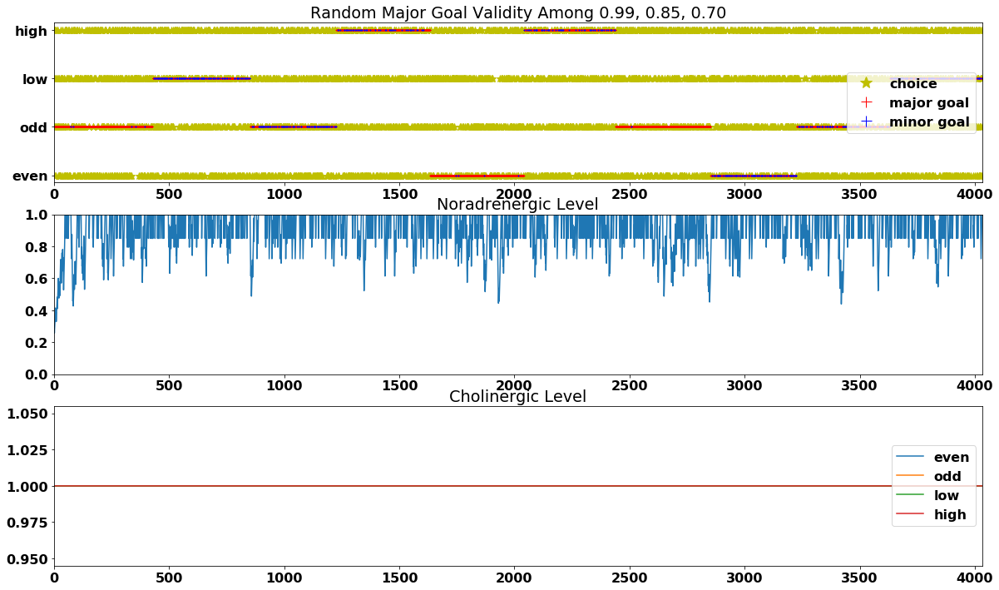

In [43]:
# trialRange+/-30 and single valid cue (6) 
model_copy = copy.deepcopy(model)
correct, choice, ach_level, ach_avg_level, ne_level, correct_lbl, acts_prob, all_prob_multi_6 = MNIST_uncertainty_task(model_copy,dataloader,validity_choices=[0.99,0.85,0.70],ACH_CORRECT=ACH_CORRECT,ACH_INCORRECT=ACH_INCORRECT,NE_INCORRECT=NE_INCORRECT,NE_CORRECT=NE_CORRECT,trialRange=trialRange,trialInterval=trialInterval,alterValid=alterValid,num_considered=num_considered,num_threshold=num_threshold,previous_intervals=all_prob_99_1[1],previous_cues=all_prob_99_1[2],hasAChLesion=hasAChLesion,hasNELesion=hasNELesion)
plot_MNIST_uncertainty(correct, choice, ach_level, ach_avg_level, ne_level, correct_lbl, acts_prob, validity_choices=[0.99,0.85,0.70])


A cue was randomly picked among integers 0~3 (i.e. even, odd, low, high respectively) every 400+/-30 trials for 10 times.
The cue validity was randomly selected among [0.99, 0.85, 0.7] in each trial.
146/4032 = 3.6% trials occurred when the predicted digit matched the cued digit but the cue was invalid
3074/4032 = 76.2% trials occurred when the predicted digit did not match the cued digit.
    348/4032 trials occurred when the predicted digit did not match the guess-target digit.
    2991/4032 trials occurred when the guess-target digit did not match the cued digit, i.e. when the guessed action was wrong.
812/4032 = 20.1% trials occurred when the predicted digit matches the major cued digit and is valid
0/4032 = 0.0% trials occurred when the predicted digit matches the minor cued digit and is valid
Lag length for stable prediction of each major cue is: [428 422 374 406 407 397 412 372 404 210], and mean of lag length (excluding consistently same cue) is 383.2


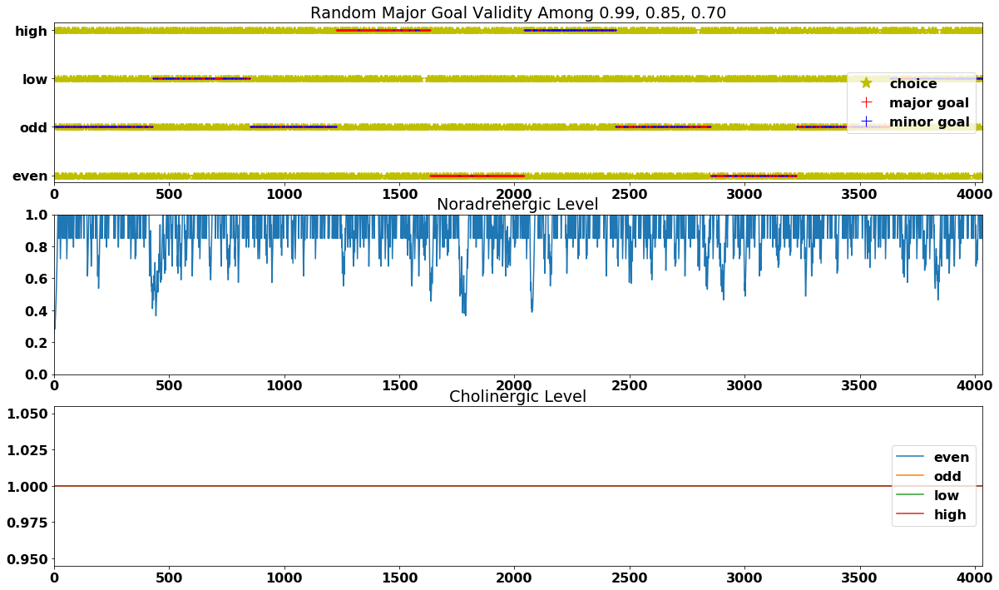

In [44]:
# trialRange+/-30 and single valid cue (7) 
model_copy = copy.deepcopy(model)
correct, choice, ach_level, ach_avg_level, ne_level, correct_lbl, acts_prob, all_prob_multi_7 = MNIST_uncertainty_task(model_copy,dataloader,validity_choices=[0.99,0.85,0.70],ACH_CORRECT=ACH_CORRECT,ACH_INCORRECT=ACH_INCORRECT,NE_INCORRECT=NE_INCORRECT,NE_CORRECT=NE_CORRECT,trialRange=trialRange,trialInterval=trialInterval,alterValid=alterValid,num_considered=num_considered,num_threshold=num_threshold,previous_intervals=all_prob_99_1[1],previous_cues=all_prob_99_1[2],hasAChLesion=hasAChLesion,hasNELesion=hasNELesion)
plot_MNIST_uncertainty(correct, choice, ach_level, ach_avg_level, ne_level, correct_lbl, acts_prob, validity_choices=[0.99,0.85,0.70])


A cue was randomly picked among integers 0~3 (i.e. even, odd, low, high respectively) every 400+/-30 trials for 10 times.
The cue validity was randomly selected among [0.99, 0.85, 0.7] in each trial.
79/4032 = 2.0% trials occurred when the predicted digit matched the cued digit but the cue was invalid
3154/4032 = 78.2% trials occurred when the predicted digit did not match the cued digit.
    382/4032 trials occurred when the predicted digit did not match the guess-target digit.
    3061/4032 trials occurred when the guess-target digit did not match the cued digit, i.e. when the guessed action was wrong.
799/4032 = 19.8% trials occurred when the predicted digit matches the major cued digit and is valid
0/4032 = 0.0% trials occurred when the predicted digit matches the minor cued digit and is valid
Lag length for stable prediction of each major cue is: [272 422 374 406 407 397 412 372 404 400], and mean of lag length (excluding consistently same cue) is 399.3333333333333


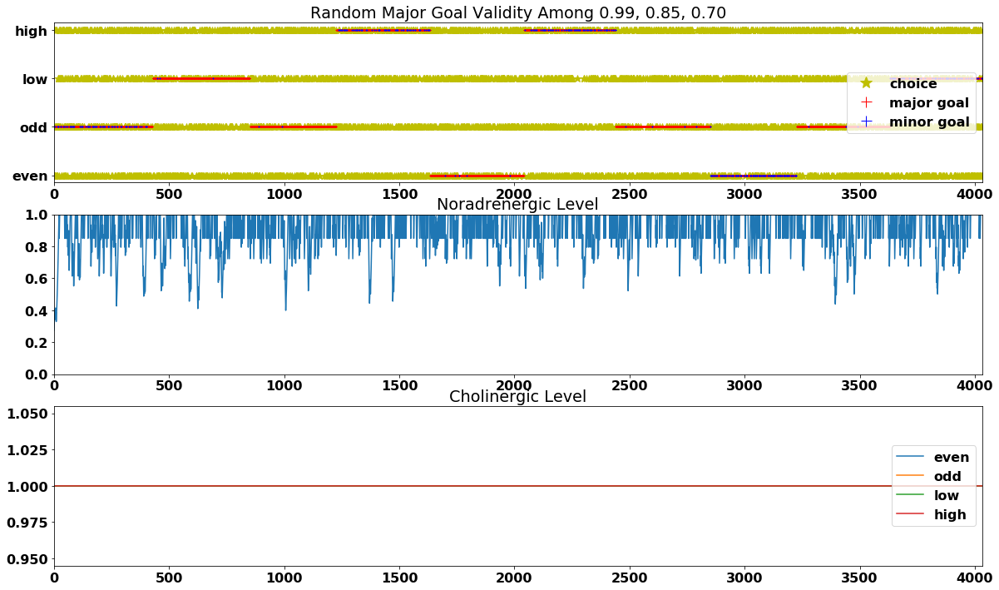

In [45]:
# trialRange+/-30 and single valid cue (8) 
model_copy = copy.deepcopy(model)
correct, choice, ach_level, ach_avg_level, ne_level, correct_lbl, acts_prob, all_prob_multi_8 = MNIST_uncertainty_task(model_copy,dataloader,validity_choices=[0.99,0.85,0.70],ACH_CORRECT=ACH_CORRECT,ACH_INCORRECT=ACH_INCORRECT,NE_INCORRECT=NE_INCORRECT,NE_CORRECT=NE_CORRECT,trialRange=trialRange,trialInterval=trialInterval,alterValid=alterValid,num_considered=num_considered,num_threshold=num_threshold,previous_intervals=all_prob_99_1[1],previous_cues=all_prob_99_1[2],hasAChLesion=hasAChLesion,hasNELesion=hasNELesion)
plot_MNIST_uncertainty(correct, choice, ach_level, ach_avg_level, ne_level, correct_lbl, acts_prob, validity_choices=[0.99,0.85,0.70])


A cue was randomly picked among integers 0~3 (i.e. even, odd, low, high respectively) every 400+/-30 trials for 10 times.
The cue validity was randomly selected among [0.99, 0.85, 0.7] in each trial.
137/4032 = 3.4% trials occurred when the predicted digit matched the cued digit but the cue was invalid
3099/4032 = 76.9% trials occurred when the predicted digit did not match the cued digit.
    363/4032 trials occurred when the predicted digit did not match the guess-target digit.
    3015/4032 trials occurred when the guess-target digit did not match the cued digit, i.e. when the guessed action was wrong.
796/4032 = 19.7% trials occurred when the predicted digit matches the major cued digit and is valid
0/4032 = 0.0% trials occurred when the predicted digit matches the minor cued digit and is valid
Lag length for stable prediction of each major cue is: [428 422 374 406 407 397 412 372 404 400], and mean of lag length (excluding consistently same cue) is 402.2


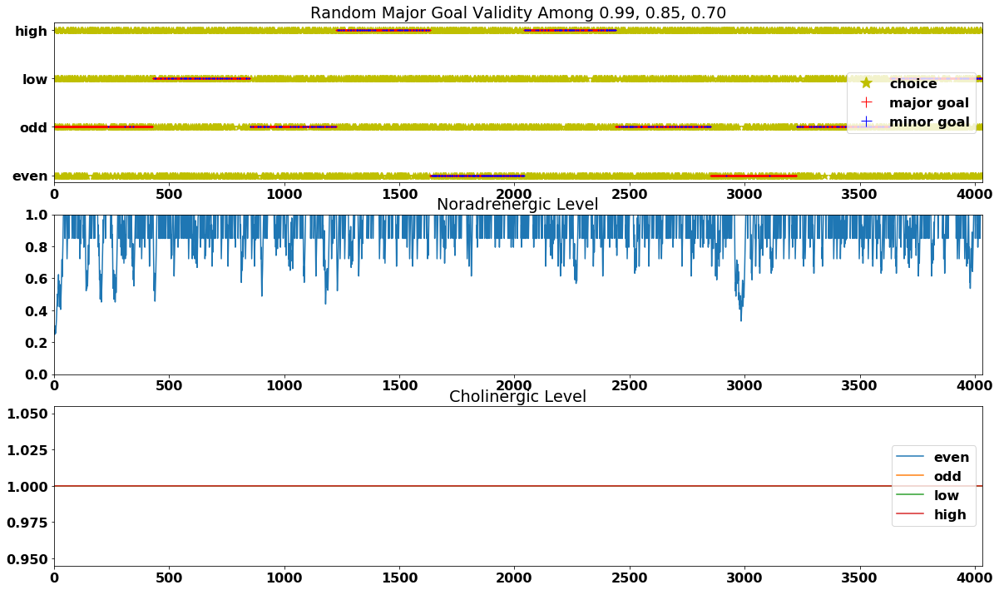

In [46]:
# trialRange+/-30 and single valid cue (9) 
model_copy = copy.deepcopy(model)
correct, choice, ach_level, ach_avg_level, ne_level, correct_lbl, acts_prob, all_prob_multi_9 = MNIST_uncertainty_task(model_copy,dataloader,validity_choices=[0.99,0.85,0.70],ACH_CORRECT=ACH_CORRECT,ACH_INCORRECT=ACH_INCORRECT,NE_INCORRECT=NE_INCORRECT,NE_CORRECT=NE_CORRECT,trialRange=trialRange,trialInterval=trialInterval,alterValid=alterValid,num_considered=num_considered,num_threshold=num_threshold,previous_intervals=all_prob_99_1[1],previous_cues=all_prob_99_1[2],hasAChLesion=hasAChLesion,hasNELesion=hasNELesion)
plot_MNIST_uncertainty(correct, choice, ach_level, ach_avg_level, ne_level, correct_lbl, acts_prob, validity_choices=[0.99,0.85,0.70])


A cue was randomly picked among integers 0~3 (i.e. even, odd, low, high respectively) every 400+/-30 trials for 10 times.
The cue validity was randomly selected among [0.99, 0.85, 0.7] in each trial.
150/4032 = 3.7% trials occurred when the predicted digit matched the cued digit but the cue was invalid
3058/4032 = 75.8% trials occurred when the predicted digit did not match the cued digit.
    356/4032 trials occurred when the predicted digit did not match the guess-target digit.
    2981/4032 trials occurred when the guess-target digit did not match the cued digit, i.e. when the guessed action was wrong.
824/4032 = 20.4% trials occurred when the predicted digit matches the major cued digit and is valid
0/4032 = 0.0% trials occurred when the predicted digit matches the minor cued digit and is valid
Lag length for stable prediction of each major cue is: [428 192 374 358 407   0 412 372 404 400], and mean of lag length (excluding consistently same cue) is 334.7


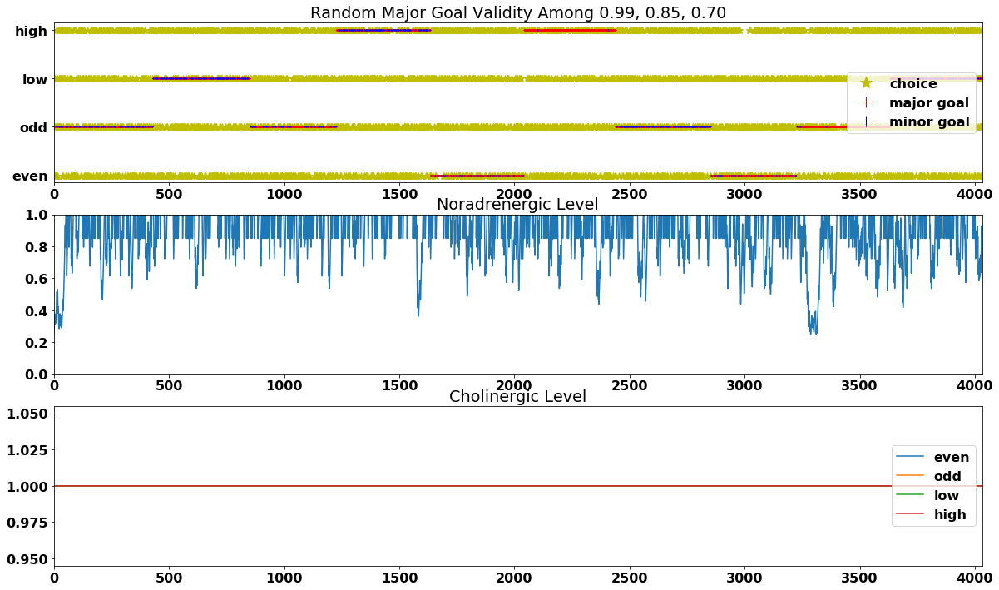

In [47]:
# trialRange+/-30 and single valid cue (10) 
model_copy = copy.deepcopy(model)
correct, choice, ach_level, ach_avg_level, ne_level, correct_lbl, acts_prob, all_prob_multi_10 = MNIST_uncertainty_task(model_copy,dataloader,validity_choices=[0.99,0.85,0.70],ACH_CORRECT=ACH_CORRECT,ACH_INCORRECT=ACH_INCORRECT,NE_INCORRECT=NE_INCORRECT,NE_CORRECT=NE_CORRECT,trialRange=trialRange,trialInterval=trialInterval,alterValid=alterValid,num_considered=num_considered,num_threshold=num_threshold,previous_intervals=all_prob_99_1[1],previous_cues=all_prob_99_1[2],hasAChLesion=hasAChLesion,hasNELesion=hasNELesion)
plot_MNIST_uncertainty(correct, choice, ach_level, ach_avg_level, ne_level, correct_lbl, acts_prob, validity_choices=[0.99,0.85,0.70])


In [48]:
all_multi_case_probs = [all_prob_multi_1,all_prob_multi_2,all_prob_multi_3,all_prob_multi_4,all_prob_multi_5,\
                        all_prob_multi_6,all_prob_multi_7,all_prob_multi_8,all_prob_multi_9,all_prob_multi_10]
averages_multi = average_probs(all_multi_case_probs)


Average lag length is: 376
Average prob pred wrong, prob pred cue A valid, prob pred cue B valid, prob pred cue A invalid,
    prob guess not match cue, prob pred not match guess, prob match cue A invalid alter: 
[0.7707837301587301, 0.19883432539682538, 0.0, 0.03038194444444444, 0.7487847222222221, 0.0890376984126984, 0.0]


## 4.2: Two Possibly Valid Cues
Randomly change trial interval within the range (200+/-20) and have two possibly valid cues for each cue switch, and use one of the validity options: 0.99, 0.85, 0.70

In [49]:
alterValid=True

### 4.2.1: validity_choices=0.99

A cue was randomly picked among integers 0~3 (i.e. even, odd, low, high respectively) every 400+/-30 trials for 10 times.
The cue validity was randomly selected among 0.99 in each trial.
A major cue or its alternative is possible for each trial depends on the cue validity.
0/4032 = 0.0% trials occurred when the predicted digit matched the cued digit but the cue was invalid
3128/4032 = 77.6% trials occurred when the predicted digit did not match the cued digit.
    363/4032 trials occurred when the predicted digit did not match the guess-target digit.
    3027/4032 trials occurred when the guess-target digit did not match the cued digit, i.e. when the guessed action was wrong.
889/4032 = 22.0% trials occurred when the predicted digit matches the major cued digit and is valid
15/4032 = 0.4% trials occurred when the predicted digit matches the minor cued digit and is valid
9/4032 = 0.2% trials occurred when the predicted digit matches the major cued digit but is invalidly altered
Lag leng

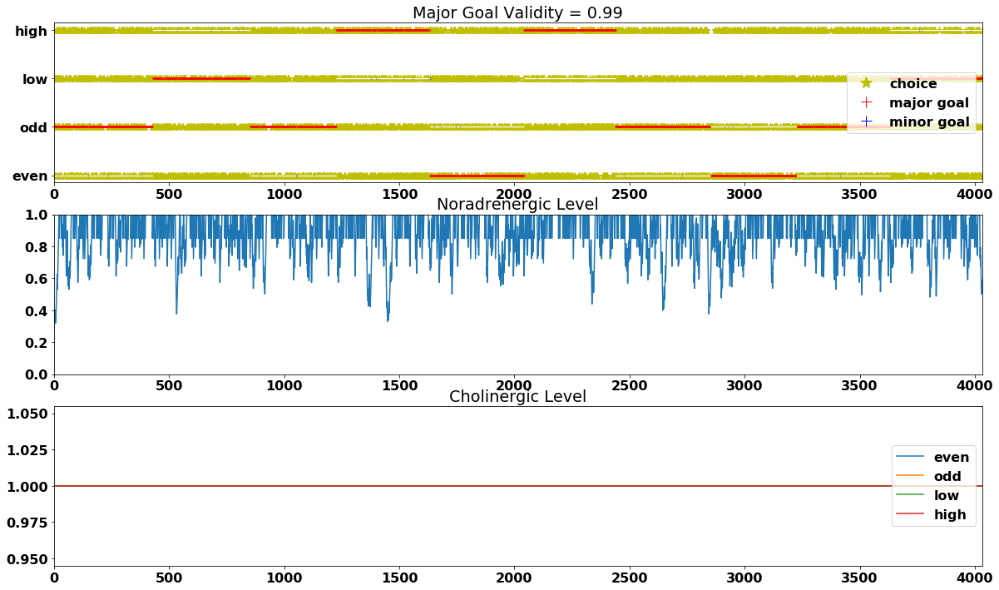

In [50]:
# trialRange+/-30 and two possibly valid cues (1) 
model_copy = copy.deepcopy(model)
correct, choice, ach_level, ach_avg_level, ne_level, correct_lbl, acts_prob, all_prob_99_1a = MNIST_uncertainty_task(model_copy,dataloader,validity_choices=0.99,ACH_CORRECT=ACH_CORRECT,ACH_INCORRECT=ACH_INCORRECT,NE_INCORRECT=NE_INCORRECT,NE_CORRECT=NE_CORRECT,trialRange=trialRange,trialInterval=trialInterval,alterValid=alterValid,num_considered=num_considered,num_threshold=num_threshold, previous_intervals=all_prob_99_1[1],previous_cues=all_prob_99_1[2],hasAChLesion=hasAChLesion,hasNELesion=hasNELesion)
plot_MNIST_uncertainty(correct, choice, ach_level, ach_avg_level, ne_level, correct_lbl, acts_prob, validity_choices=0.99,alterValid=alterValid)


A cue was randomly picked among integers 0~3 (i.e. even, odd, low, high respectively) every 400+/-30 trials for 10 times.
The cue validity was randomly selected among 0.99 in each trial.
A major cue or its alternative is possible for each trial depends on the cue validity.
0/4032 = 0.0% trials occurred when the predicted digit matched the cued digit but the cue was invalid
3094/4032 = 76.7% trials occurred when the predicted digit did not match the cued digit.
    363/4032 trials occurred when the predicted digit did not match the guess-target digit.
    3006/4032 trials occurred when the guess-target digit did not match the cued digit, i.e. when the guessed action was wrong.
930/4032 = 23.1% trials occurred when the predicted digit matches the major cued digit and is valid
8/4032 = 0.2% trials occurred when the predicted digit matches the minor cued digit and is valid
9/4032 = 0.2% trials occurred when the predicted digit matches the major cued digit but is invalidly altered
Lag lengt

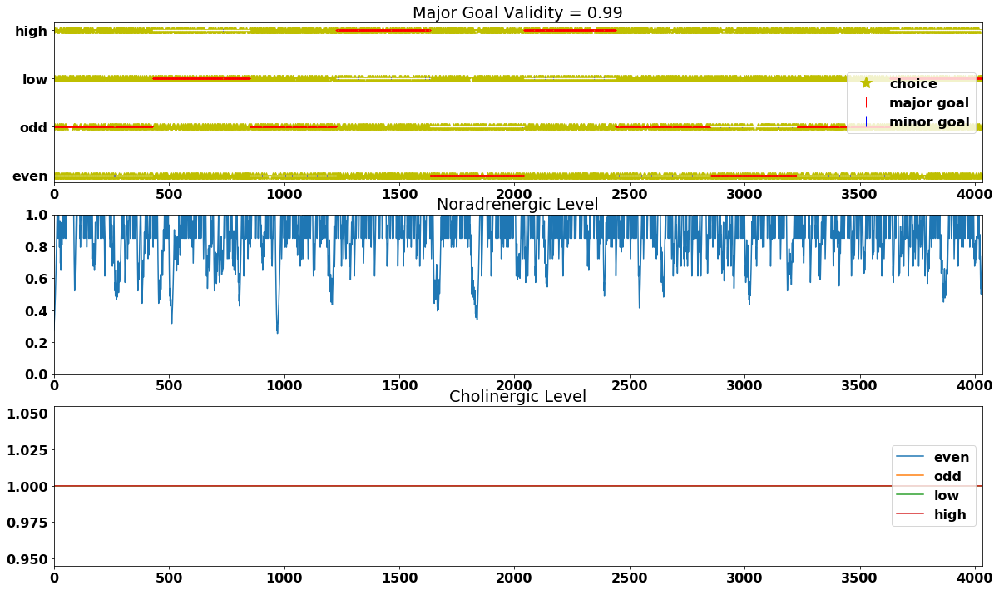

In [51]:
# trialRange+/-30 and two possibly valid cues (2) 
model_copy = copy.deepcopy(model)
correct, choice, ach_level, ach_avg_level, ne_level, correct_lbl, acts_prob, all_prob_99_2a = MNIST_uncertainty_task(model_copy,dataloader,validity_choices=0.99,ACH_CORRECT=ACH_CORRECT,ACH_INCORRECT=ACH_INCORRECT,NE_INCORRECT=NE_INCORRECT,NE_CORRECT=NE_CORRECT,trialRange=trialRange,trialInterval=trialInterval,alterValid=alterValid,num_considered=num_considered,num_threshold=num_threshold, previous_intervals=all_prob_99_1[1],previous_cues=all_prob_99_1[2],hasAChLesion=hasAChLesion,hasNELesion=hasNELesion)
plot_MNIST_uncertainty(correct, choice, ach_level, ach_avg_level, ne_level, correct_lbl, acts_prob, validity_choices=0.99,alterValid=alterValid)


A cue was randomly picked among integers 0~3 (i.e. even, odd, low, high respectively) every 400+/-30 trials for 10 times.
The cue validity was randomly selected among 0.99 in each trial.
A major cue or its alternative is possible for each trial depends on the cue validity.
0/4032 = 0.0% trials occurred when the predicted digit matched the cued digit but the cue was invalid
3110/4032 = 77.1% trials occurred when the predicted digit did not match the cued digit.
    347/4032 trials occurred when the predicted digit did not match the guess-target digit.
    3026/4032 trials occurred when the guess-target digit did not match the cued digit, i.e. when the guessed action was wrong.
915/4032 = 22.7% trials occurred when the predicted digit matches the major cued digit and is valid
7/4032 = 0.2% trials occurred when the predicted digit matches the minor cued digit and is valid
7/4032 = 0.2% trials occurred when the predicted digit matches the major cued digit but is invalidly altered
Lag lengt

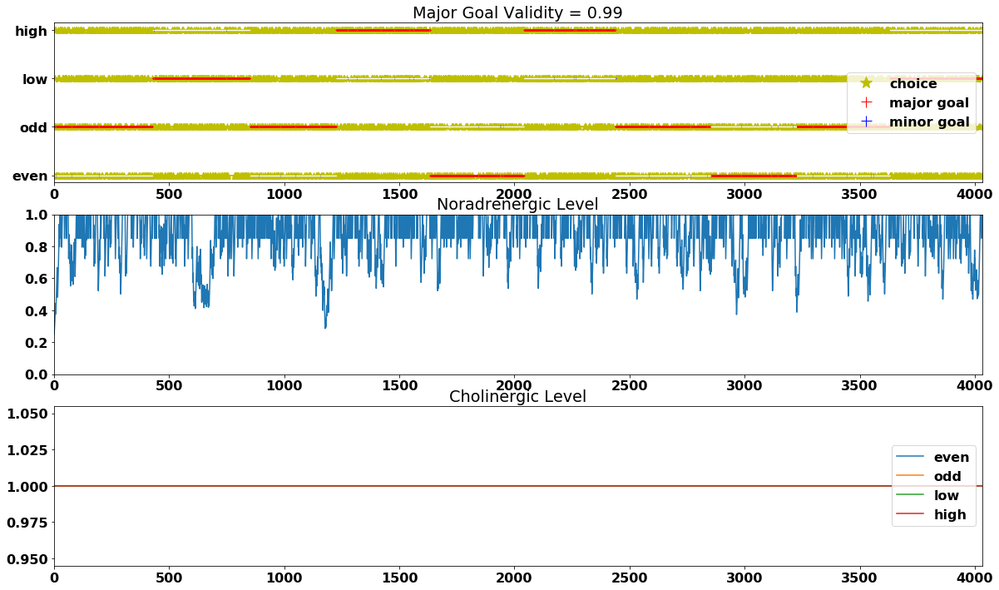

In [52]:
# trialRange+/-30 and two possibly valid cues (3) 
model_copy = copy.deepcopy(model)
correct, choice, ach_level, ach_avg_level, ne_level, correct_lbl, acts_prob, all_prob_99_3a = MNIST_uncertainty_task(model_copy,dataloader,validity_choices=0.99,ACH_CORRECT=ACH_CORRECT,ACH_INCORRECT=ACH_INCORRECT,NE_INCORRECT=NE_INCORRECT,NE_CORRECT=NE_CORRECT,trialRange=trialRange,trialInterval=trialInterval,alterValid=alterValid,num_considered=num_considered,num_threshold=num_threshold, previous_intervals=all_prob_99_1[1],previous_cues=all_prob_99_1[2],hasAChLesion=hasAChLesion,hasNELesion=hasNELesion)
plot_MNIST_uncertainty(correct, choice, ach_level, ach_avg_level, ne_level, correct_lbl, acts_prob, validity_choices=0.99,alterValid=alterValid)


A cue was randomly picked among integers 0~3 (i.e. even, odd, low, high respectively) every 400+/-30 trials for 10 times.
The cue validity was randomly selected among 0.99 in each trial.
A major cue or its alternative is possible for each trial depends on the cue validity.
0/4032 = 0.0% trials occurred when the predicted digit matched the cued digit but the cue was invalid
3065/4032 = 76.0% trials occurred when the predicted digit did not match the cued digit.
    362/4032 trials occurred when the predicted digit did not match the guess-target digit.
    2985/4032 trials occurred when the guess-target digit did not match the cued digit, i.e. when the guessed action was wrong.
955/4032 = 23.7% trials occurred when the predicted digit matches the major cued digit and is valid
12/4032 = 0.3% trials occurred when the predicted digit matches the minor cued digit and is valid
18/4032 = 0.4% trials occurred when the predicted digit matches the major cued digit but is invalidly altered
Lag len

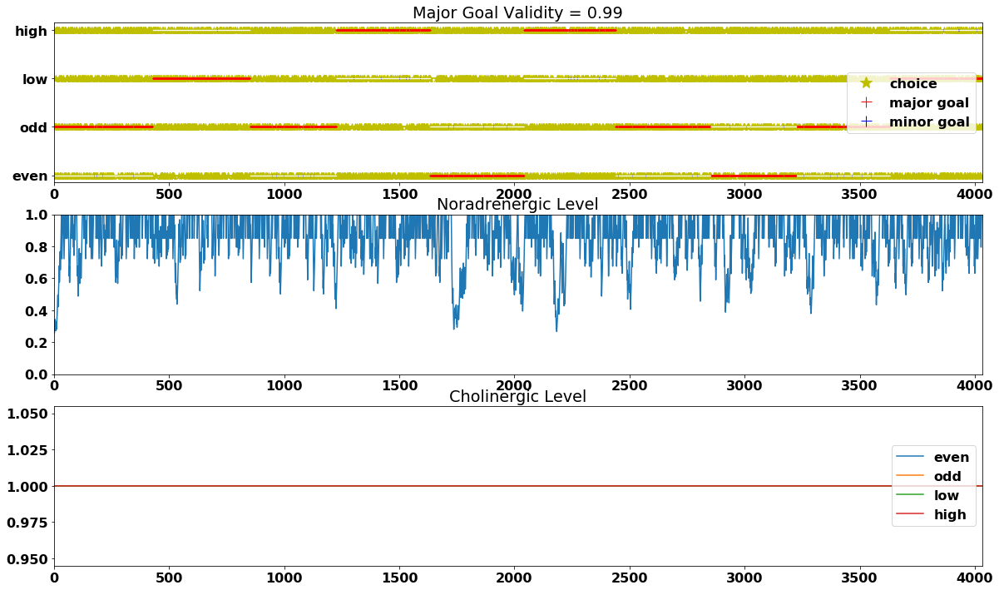

In [53]:
# trialRange+/-30 and two possibly valid cues (4) 
model_copy = copy.deepcopy(model)
correct, choice, ach_level, ach_avg_level, ne_level, correct_lbl, acts_prob, all_prob_99_4a = MNIST_uncertainty_task(model_copy,dataloader,validity_choices=0.99,ACH_CORRECT=ACH_CORRECT,ACH_INCORRECT=ACH_INCORRECT,NE_INCORRECT=NE_INCORRECT,NE_CORRECT=NE_CORRECT,trialRange=trialRange,trialInterval=trialInterval,alterValid=alterValid,num_considered=num_considered,num_threshold=num_threshold, previous_intervals=all_prob_99_1[1],previous_cues=all_prob_99_1[2],hasAChLesion=hasAChLesion,hasNELesion=hasNELesion)
plot_MNIST_uncertainty(correct, choice, ach_level, ach_avg_level, ne_level, correct_lbl, acts_prob, validity_choices=0.99,alterValid=alterValid)


A cue was randomly picked among integers 0~3 (i.e. even, odd, low, high respectively) every 400+/-30 trials for 10 times.
The cue validity was randomly selected among 0.99 in each trial.
A major cue or its alternative is possible for each trial depends on the cue validity.
0/4032 = 0.0% trials occurred when the predicted digit matched the cued digit but the cue was invalid
3131/4032 = 77.7% trials occurred when the predicted digit did not match the cued digit.
    366/4032 trials occurred when the predicted digit did not match the guess-target digit.
    3042/4032 trials occurred when the guess-target digit did not match the cued digit, i.e. when the guessed action was wrong.
892/4032 = 22.1% trials occurred when the predicted digit matches the major cued digit and is valid
9/4032 = 0.2% trials occurred when the predicted digit matches the minor cued digit and is valid
5/4032 = 0.1% trials occurred when the predicted digit matches the major cued digit but is invalidly altered
Lag lengt

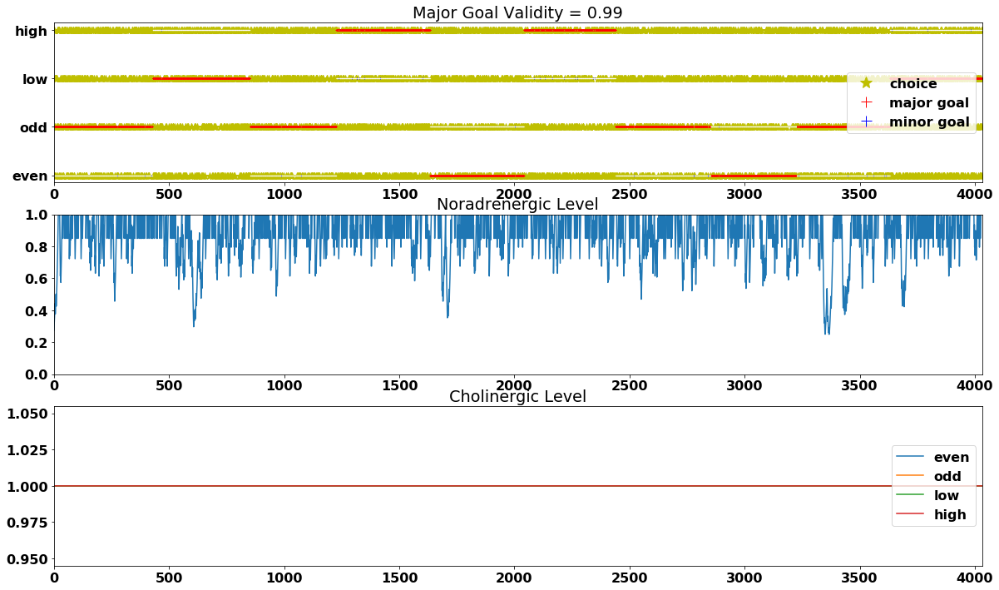

In [54]:
# trialRange+/-30 and two possibly valid cues (5) 
model_copy = copy.deepcopy(model)
correct, choice, ach_level, ach_avg_level, ne_level, correct_lbl, acts_prob, all_prob_99_5a = MNIST_uncertainty_task(model_copy,dataloader,validity_choices=0.99,ACH_CORRECT=ACH_CORRECT,ACH_INCORRECT=ACH_INCORRECT,NE_INCORRECT=NE_INCORRECT,NE_CORRECT=NE_CORRECT,trialRange=trialRange,trialInterval=trialInterval,alterValid=alterValid,num_considered=num_considered,num_threshold=num_threshold, previous_intervals=all_prob_99_1[1],previous_cues=all_prob_99_1[2],hasAChLesion=hasAChLesion,hasNELesion=hasNELesion)
plot_MNIST_uncertainty(correct, choice, ach_level, ach_avg_level, ne_level, correct_lbl, acts_prob, validity_choices=0.99,alterValid=alterValid)


A cue was randomly picked among integers 0~3 (i.e. even, odd, low, high respectively) every 400+/-30 trials for 10 times.
The cue validity was randomly selected among 0.99 in each trial.
A major cue or its alternative is possible for each trial depends on the cue validity.
0/4032 = 0.0% trials occurred when the predicted digit matched the cued digit but the cue was invalid
3138/4032 = 77.8% trials occurred when the predicted digit did not match the cued digit.
    374/4032 trials occurred when the predicted digit did not match the guess-target digit.
    3046/4032 trials occurred when the guess-target digit did not match the cued digit, i.e. when the guessed action was wrong.
883/4032 = 21.9% trials occurred when the predicted digit matches the major cued digit and is valid
11/4032 = 0.3% trials occurred when the predicted digit matches the minor cued digit and is valid
11/4032 = 0.3% trials occurred when the predicted digit matches the major cued digit but is invalidly altered
Lag len

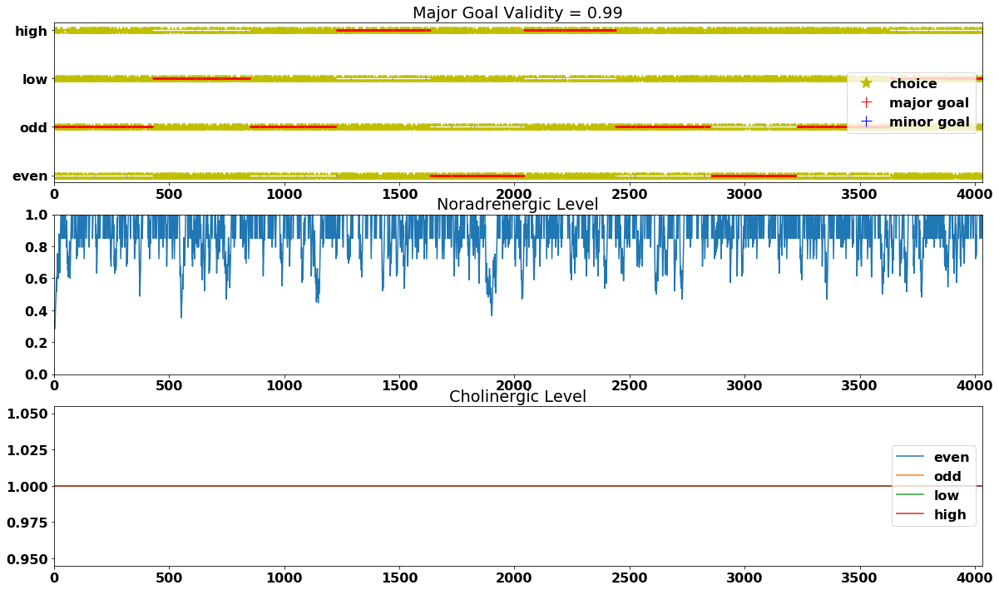

In [55]:
# trialRange+/-30 and two possibly valid cues (6) 
model_copy = copy.deepcopy(model)
correct, choice, ach_level, ach_avg_level, ne_level, correct_lbl, acts_prob, all_prob_99_6a = MNIST_uncertainty_task(model_copy,dataloader,validity_choices=0.99,ACH_CORRECT=ACH_CORRECT,ACH_INCORRECT=ACH_INCORRECT,NE_INCORRECT=NE_INCORRECT,NE_CORRECT=NE_CORRECT,trialRange=trialRange,trialInterval=trialInterval,alterValid=alterValid,num_considered=num_considered,num_threshold=num_threshold, previous_intervals=all_prob_99_1[1],previous_cues=all_prob_99_1[2],hasAChLesion=hasAChLesion,hasNELesion=hasNELesion)
plot_MNIST_uncertainty(correct, choice, ach_level, ach_avg_level, ne_level, correct_lbl, acts_prob, validity_choices=0.99,alterValid=alterValid)


A cue was randomly picked among integers 0~3 (i.e. even, odd, low, high respectively) every 400+/-30 trials for 10 times.
The cue validity was randomly selected among 0.99 in each trial.
A major cue or its alternative is possible for each trial depends on the cue validity.
0/4032 = 0.0% trials occurred when the predicted digit matched the cued digit but the cue was invalid
3087/4032 = 76.6% trials occurred when the predicted digit did not match the cued digit.
    358/4032 trials occurred when the predicted digit did not match the guess-target digit.
    3012/4032 trials occurred when the guess-target digit did not match the cued digit, i.e. when the guessed action was wrong.
939/4032 = 23.3% trials occurred when the predicted digit matches the major cued digit and is valid
6/4032 = 0.1% trials occurred when the predicted digit matches the minor cued digit and is valid
10/4032 = 0.2% trials occurred when the predicted digit matches the major cued digit but is invalidly altered
Lag leng

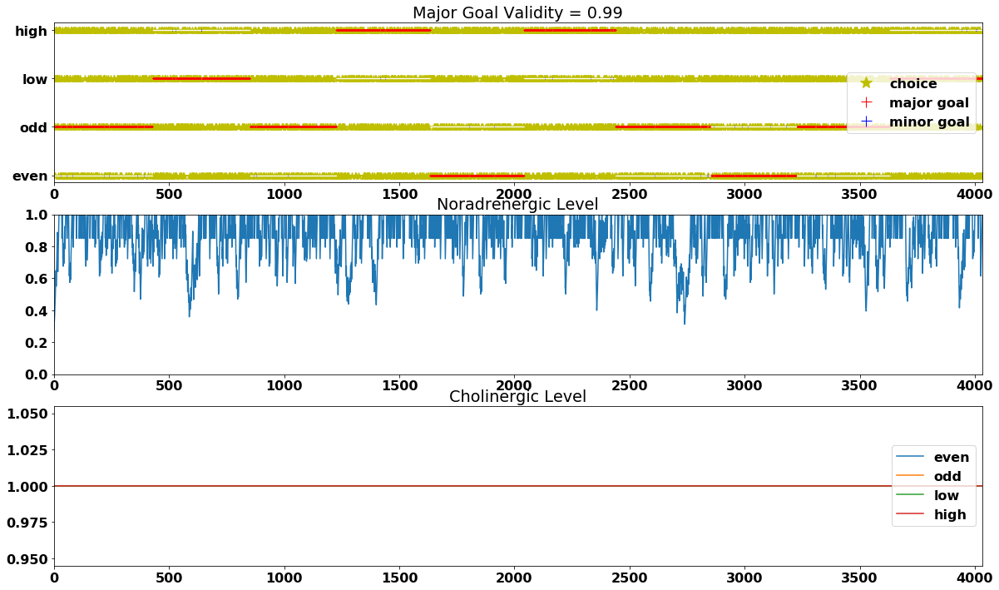

In [56]:
# trialRange+/-30 and two possibly valid cues (7) 
model_copy = copy.deepcopy(model)
correct, choice, ach_level, ach_avg_level, ne_level, correct_lbl, acts_prob, all_prob_99_7a = MNIST_uncertainty_task(model_copy,dataloader,validity_choices=0.99,ACH_CORRECT=ACH_CORRECT,ACH_INCORRECT=ACH_INCORRECT,NE_INCORRECT=NE_INCORRECT,NE_CORRECT=NE_CORRECT,trialRange=trialRange,trialInterval=trialInterval,alterValid=alterValid,num_considered=num_considered,num_threshold=num_threshold, previous_intervals=all_prob_99_1[1],previous_cues=all_prob_99_1[2],hasAChLesion=hasAChLesion,hasNELesion=hasNELesion)
plot_MNIST_uncertainty(correct, choice, ach_level, ach_avg_level, ne_level, correct_lbl, acts_prob, validity_choices=0.99,alterValid=alterValid)


A cue was randomly picked among integers 0~3 (i.e. even, odd, low, high respectively) every 400+/-30 trials for 10 times.
The cue validity was randomly selected among 0.99 in each trial.
A major cue or its alternative is possible for each trial depends on the cue validity.
0/4032 = 0.0% trials occurred when the predicted digit matched the cued digit but the cue was invalid
3133/4032 = 77.7% trials occurred when the predicted digit did not match the cued digit.
    344/4032 trials occurred when the predicted digit did not match the guess-target digit.
    3039/4032 trials occurred when the guess-target digit did not match the cued digit, i.e. when the guessed action was wrong.
890/4032 = 22.1% trials occurred when the predicted digit matches the major cued digit and is valid
9/4032 = 0.2% trials occurred when the predicted digit matches the minor cued digit and is valid
12/4032 = 0.3% trials occurred when the predicted digit matches the major cued digit but is invalidly altered
Lag leng

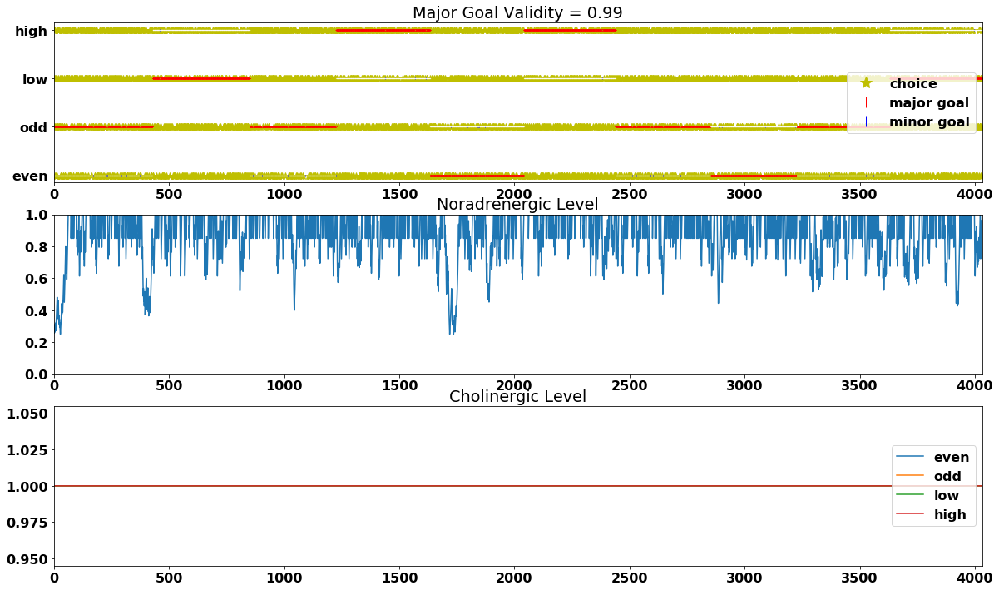

In [57]:
# trialRange+/-30 and two possibly valid cues (8) 
model_copy = copy.deepcopy(model)
correct, choice, ach_level, ach_avg_level, ne_level, correct_lbl, acts_prob, all_prob_99_8a = MNIST_uncertainty_task(model_copy,dataloader,validity_choices=0.99,ACH_CORRECT=ACH_CORRECT,ACH_INCORRECT=ACH_INCORRECT,NE_INCORRECT=NE_INCORRECT,NE_CORRECT=NE_CORRECT,trialRange=trialRange,trialInterval=trialInterval,alterValid=alterValid,num_considered=num_considered,num_threshold=num_threshold, previous_intervals=all_prob_99_1[1],previous_cues=all_prob_99_1[2],hasAChLesion=hasAChLesion,hasNELesion=hasNELesion)
plot_MNIST_uncertainty(correct, choice, ach_level, ach_avg_level, ne_level, correct_lbl, acts_prob, validity_choices=0.99,alterValid=alterValid)


A cue was randomly picked among integers 0~3 (i.e. even, odd, low, high respectively) every 400+/-30 trials for 10 times.
The cue validity was randomly selected among 0.99 in each trial.
A major cue or its alternative is possible for each trial depends on the cue validity.
0/4032 = 0.0% trials occurred when the predicted digit matched the cued digit but the cue was invalid
3134/4032 = 77.7% trials occurred when the predicted digit did not match the cued digit.
    357/4032 trials occurred when the predicted digit did not match the guess-target digit.
    3043/4032 trials occurred when the guess-target digit did not match the cued digit, i.e. when the guessed action was wrong.
887/4032 = 22.0% trials occurred when the predicted digit matches the major cued digit and is valid
11/4032 = 0.3% trials occurred when the predicted digit matches the minor cued digit and is valid
12/4032 = 0.3% trials occurred when the predicted digit matches the major cued digit but is invalidly altered
Lag len

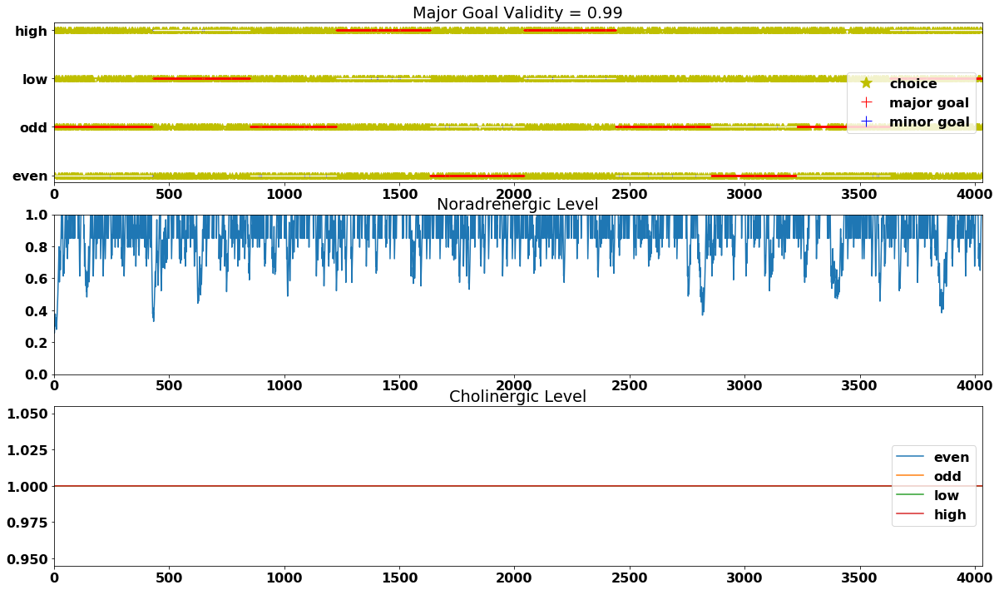

In [58]:
# trialRange+/-30 and two possibly valid cues (9) 
model_copy = copy.deepcopy(model)
correct, choice, ach_level, ach_avg_level, ne_level, correct_lbl, acts_prob, all_prob_99_9a = MNIST_uncertainty_task(model_copy,dataloader,validity_choices=0.99,ACH_CORRECT=ACH_CORRECT,ACH_INCORRECT=ACH_INCORRECT,NE_INCORRECT=NE_INCORRECT,NE_CORRECT=NE_CORRECT,trialRange=trialRange,trialInterval=trialInterval,alterValid=alterValid,num_considered=num_considered,num_threshold=num_threshold, previous_intervals=all_prob_99_1[1],previous_cues=all_prob_99_1[2],hasAChLesion=hasAChLesion,hasNELesion=hasNELesion)
plot_MNIST_uncertainty(correct, choice, ach_level, ach_avg_level, ne_level, correct_lbl, acts_prob, validity_choices=0.99,alterValid=alterValid)


A cue was randomly picked among integers 0~3 (i.e. even, odd, low, high respectively) every 400+/-30 trials for 10 times.
The cue validity was randomly selected among 0.99 in each trial.
A major cue or its alternative is possible for each trial depends on the cue validity.
0/4032 = 0.0% trials occurred when the predicted digit matched the cued digit but the cue was invalid
3124/4032 = 77.5% trials occurred when the predicted digit did not match the cued digit.
    368/4032 trials occurred when the predicted digit did not match the guess-target digit.
    3024/4032 trials occurred when the guess-target digit did not match the cued digit, i.e. when the guessed action was wrong.
897/4032 = 22.2% trials occurred when the predicted digit matches the major cued digit and is valid
11/4032 = 0.3% trials occurred when the predicted digit matches the minor cued digit and is valid
11/4032 = 0.3% trials occurred when the predicted digit matches the major cued digit but is invalidly altered
Lag len

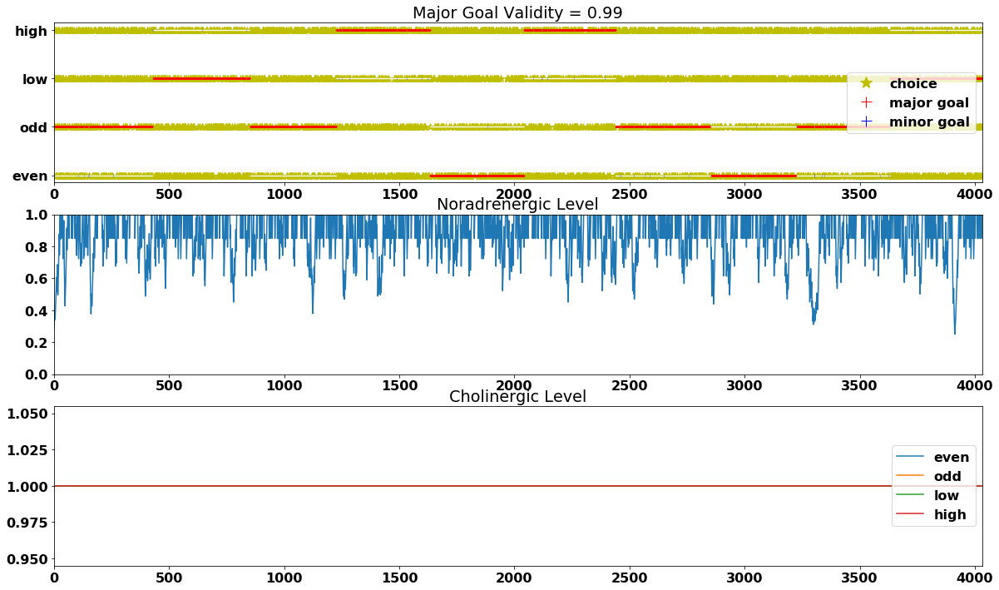

In [59]:
# trialRange+/-30 and two possibly valid cues (10) 
model_copy = copy.deepcopy(model)
correct, choice, ach_level, ach_avg_level, ne_level, correct_lbl, acts_prob, all_prob_99_10a = MNIST_uncertainty_task(model_copy,dataloader,validity_choices=0.99,ACH_CORRECT=ACH_CORRECT,ACH_INCORRECT=ACH_INCORRECT,NE_INCORRECT=NE_INCORRECT,NE_CORRECT=NE_CORRECT,trialRange=trialRange,trialInterval=trialInterval,alterValid=alterValid,num_considered=num_considered,num_threshold=num_threshold, previous_intervals=all_prob_99_1[1],previous_cues=all_prob_99_1[2],hasAChLesion=hasAChLesion,hasNELesion=hasNELesion)
plot_MNIST_uncertainty(correct, choice, ach_level, ach_avg_level, ne_level, correct_lbl, acts_prob, validity_choices=0.99,alterValid=alterValid)


In [60]:
all_99a_case_probs = [all_prob_99_1a,all_prob_99_2a,all_prob_99_3a,all_prob_99_4a,all_prob_99_5a,\
                      all_prob_99_6a,all_prob_99_7a,all_prob_99_8a,all_prob_99_9a,all_prob_99_10a]
averages_99a = average_probs(all_99a_case_probs)


Average lag length is: 384
Average prob pred wrong, prob pred cue A valid, prob pred cue B valid, prob pred cue A invalid,
    prob guess not match cue, prob pred not match guess, prob match cue A invalid alter: 
[0.7724206349206348, 0.22512400793650794, 0.0024553571428571432, 0.0, 0.7502480158730159, 0.08933531746031746, 0.0025793650793650793]


### 4.2.2: validity_choices=0.85

A cue was randomly picked among integers 0~3 (i.e. even, odd, low, high respectively) every 400+/-30 trials for 10 times.
The cue validity was randomly selected among 0.85 in each trial.
A major cue or its alternative is possible for each trial depends on the cue validity.
0/4032 = 0.0% trials occurred when the predicted digit matched the cued digit but the cue was invalid
3200/4032 = 79.4% trials occurred when the predicted digit did not match the cued digit.
    374/4032 trials occurred when the predicted digit did not match the guess-target digit.
    3097/4032 trials occurred when the guess-target digit did not match the cued digit, i.e. when the guessed action was wrong.
724/4032 = 18.0% trials occurred when the predicted digit matches the major cued digit and is valid
108/4032 = 2.7% trials occurred when the predicted digit matches the minor cued digit and is valid
135/4032 = 3.3% trials occurred when the predicted digit matches the major cued digit but is invalidly altered
Lag l

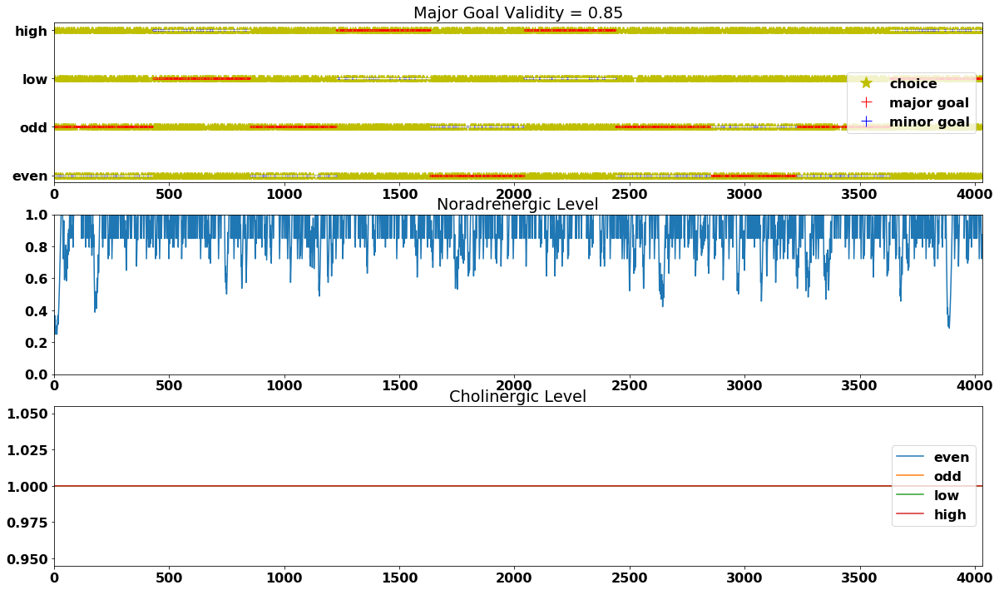

In [61]:
# trialRange+/-30 and two possibly valid cues (1) 
model_copy = copy.deepcopy(model)
correct, choice, ach_level, ach_avg_level, ne_level, correct_lbl, acts_prob, all_prob_85_1a = MNIST_uncertainty_task(model_copy,dataloader,validity_choices=0.85,ACH_CORRECT=ACH_CORRECT,ACH_INCORRECT=ACH_INCORRECT,NE_INCORRECT=NE_INCORRECT,NE_CORRECT=NE_CORRECT,trialRange=trialRange,trialInterval=trialInterval,alterValid=alterValid,num_considered=num_considered,num_threshold=num_threshold, previous_intervals=all_prob_99_1[1],previous_cues=all_prob_99_1[2],hasAChLesion=hasAChLesion,hasNELesion=hasNELesion)
plot_MNIST_uncertainty(correct, choice, ach_level, ach_avg_level, ne_level, correct_lbl, acts_prob, validity_choices=0.85,alterValid=alterValid)


A cue was randomly picked among integers 0~3 (i.e. even, odd, low, high respectively) every 400+/-30 trials for 10 times.
The cue validity was randomly selected among 0.85 in each trial.
A major cue or its alternative is possible for each trial depends on the cue validity.
0/4032 = 0.0% trials occurred when the predicted digit matched the cued digit but the cue was invalid
3112/4032 = 77.2% trials occurred when the predicted digit did not match the cued digit.
    343/4032 trials occurred when the predicted digit did not match the guess-target digit.
    3030/4032 trials occurred when the guess-target digit did not match the cued digit, i.e. when the guessed action was wrong.
778/4032 = 19.3% trials occurred when the predicted digit matches the major cued digit and is valid
142/4032 = 3.5% trials occurred when the predicted digit matches the minor cued digit and is valid
131/4032 = 3.2% trials occurred when the predicted digit matches the major cued digit but is invalidly altered
Lag l

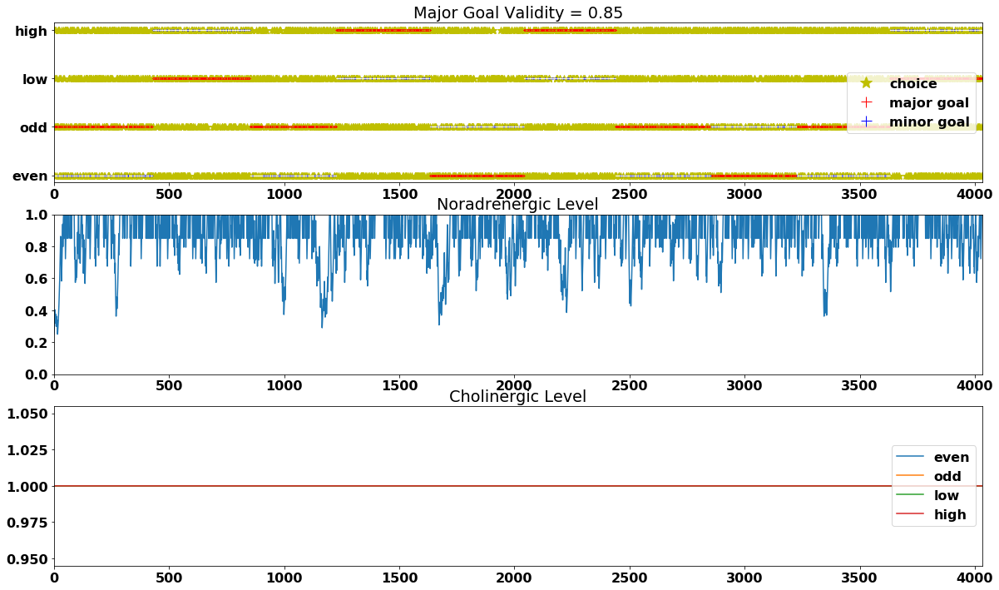

In [62]:
# trialRange+/-30 and two possibly valid cues (2) 
model_copy = copy.deepcopy(model)
correct, choice, ach_level, ach_avg_level, ne_level, correct_lbl, acts_prob, all_prob_85_2a = MNIST_uncertainty_task(model_copy,dataloader,validity_choices=0.85,ACH_CORRECT=ACH_CORRECT,ACH_INCORRECT=ACH_INCORRECT,NE_INCORRECT=NE_INCORRECT,NE_CORRECT=NE_CORRECT,trialRange=trialRange,trialInterval=trialInterval,alterValid=alterValid,num_considered=num_considered,num_threshold=num_threshold, previous_intervals=all_prob_99_1[1],previous_cues=all_prob_99_1[2],hasAChLesion=hasAChLesion,hasNELesion=hasNELesion)
plot_MNIST_uncertainty(correct, choice, ach_level, ach_avg_level, ne_level, correct_lbl, acts_prob, validity_choices=0.85,alterValid=alterValid)


A cue was randomly picked among integers 0~3 (i.e. even, odd, low, high respectively) every 400+/-30 trials for 10 times.
The cue validity was randomly selected among 0.85 in each trial.
A major cue or its alternative is possible for each trial depends on the cue validity.
0/4032 = 0.0% trials occurred when the predicted digit matched the cued digit but the cue was invalid
3143/4032 = 78.0% trials occurred when the predicted digit did not match the cued digit.
    382/4032 trials occurred when the predicted digit did not match the guess-target digit.
    3053/4032 trials occurred when the guess-target digit did not match the cued digit, i.e. when the guessed action was wrong.
762/4032 = 18.9% trials occurred when the predicted digit matches the major cued digit and is valid
127/4032 = 3.1% trials occurred when the predicted digit matches the minor cued digit and is valid
118/4032 = 2.9% trials occurred when the predicted digit matches the major cued digit but is invalidly altered
Lag l

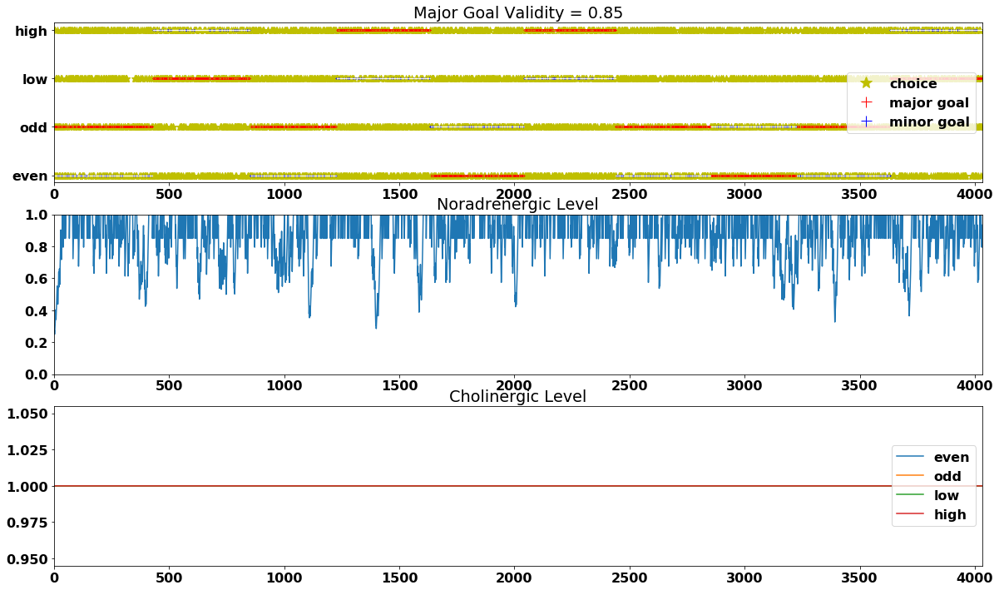

In [63]:
# trialRange+/-30 and two possibly valid cues (3) 
model_copy = copy.deepcopy(model)
correct, choice, ach_level, ach_avg_level, ne_level, correct_lbl, acts_prob, all_prob_85_3a = MNIST_uncertainty_task(model_copy,dataloader,validity_choices=0.85,ACH_CORRECT=ACH_CORRECT,ACH_INCORRECT=ACH_INCORRECT,NE_INCORRECT=NE_INCORRECT,NE_CORRECT=NE_CORRECT,trialRange=trialRange,trialInterval=trialInterval,alterValid=alterValid,num_considered=num_considered,num_threshold=num_threshold, previous_intervals=all_prob_99_1[1],previous_cues=all_prob_99_1[2],hasAChLesion=hasAChLesion,hasNELesion=hasNELesion)
plot_MNIST_uncertainty(correct, choice, ach_level, ach_avg_level, ne_level, correct_lbl, acts_prob, validity_choices=0.85,alterValid=alterValid)


A cue was randomly picked among integers 0~3 (i.e. even, odd, low, high respectively) every 400+/-30 trials for 10 times.
The cue validity was randomly selected among 0.85 in each trial.
A major cue or its alternative is possible for each trial depends on the cue validity.
0/4032 = 0.0% trials occurred when the predicted digit matched the cued digit but the cue was invalid
3121/4032 = 77.4% trials occurred when the predicted digit did not match the cued digit.
    362/4032 trials occurred when the predicted digit did not match the guess-target digit.
    3028/4032 trials occurred when the guess-target digit did not match the cued digit, i.e. when the guessed action was wrong.
759/4032 = 18.8% trials occurred when the predicted digit matches the major cued digit and is valid
152/4032 = 3.8% trials occurred when the predicted digit matches the minor cued digit and is valid
138/4032 = 3.4% trials occurred when the predicted digit matches the major cued digit but is invalidly altered
Lag l

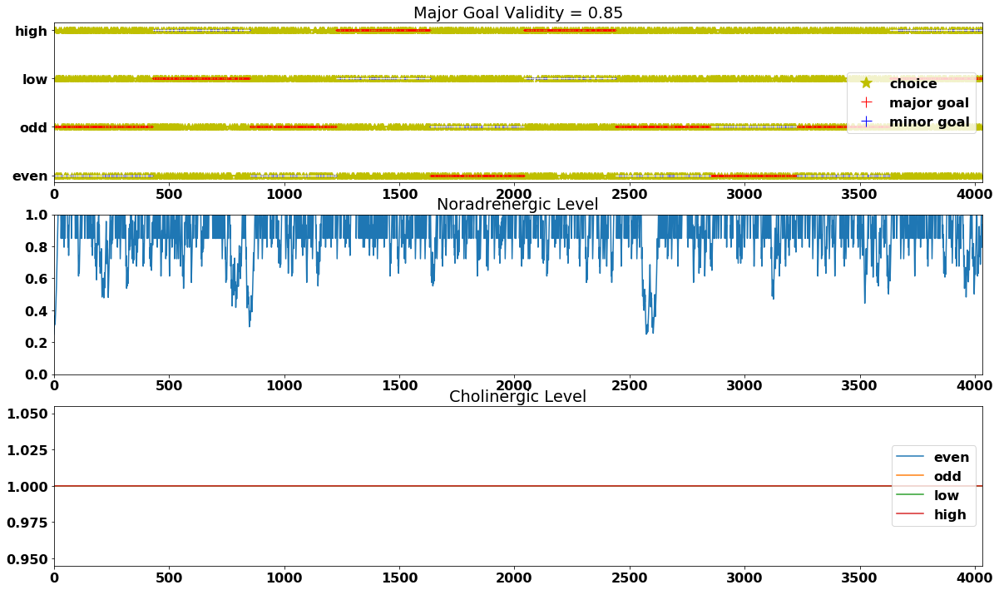

In [64]:
# trialRange+/-30 and two possibly valid cues (4) 
model_copy = copy.deepcopy(model)
correct, choice, ach_level, ach_avg_level, ne_level, correct_lbl, acts_prob, all_prob_85_4a = MNIST_uncertainty_task(model_copy,dataloader,validity_choices=0.85,ACH_CORRECT=ACH_CORRECT,ACH_INCORRECT=ACH_INCORRECT,NE_INCORRECT=NE_INCORRECT,NE_CORRECT=NE_CORRECT,trialRange=trialRange,trialInterval=trialInterval,alterValid=alterValid,num_considered=num_considered,num_threshold=num_threshold, previous_intervals=all_prob_99_1[1],previous_cues=all_prob_99_1[2],hasAChLesion=hasAChLesion,hasNELesion=hasNELesion)
plot_MNIST_uncertainty(correct, choice, ach_level, ach_avg_level, ne_level, correct_lbl, acts_prob, validity_choices=0.85,alterValid=alterValid)


A cue was randomly picked among integers 0~3 (i.e. even, odd, low, high respectively) every 400+/-30 trials for 10 times.
The cue validity was randomly selected among 0.85 in each trial.
A major cue or its alternative is possible for each trial depends on the cue validity.
0/4032 = 0.0% trials occurred when the predicted digit matched the cued digit but the cue was invalid
3112/4032 = 77.2% trials occurred when the predicted digit did not match the cued digit.
    386/4032 trials occurred when the predicted digit did not match the guess-target digit.
    3013/4032 trials occurred when the guess-target digit did not match the cued digit, i.e. when the guessed action was wrong.
773/4032 = 19.2% trials occurred when the predicted digit matches the major cued digit and is valid
147/4032 = 3.6% trials occurred when the predicted digit matches the minor cued digit and is valid
140/4032 = 3.5% trials occurred when the predicted digit matches the major cued digit but is invalidly altered
Lag l

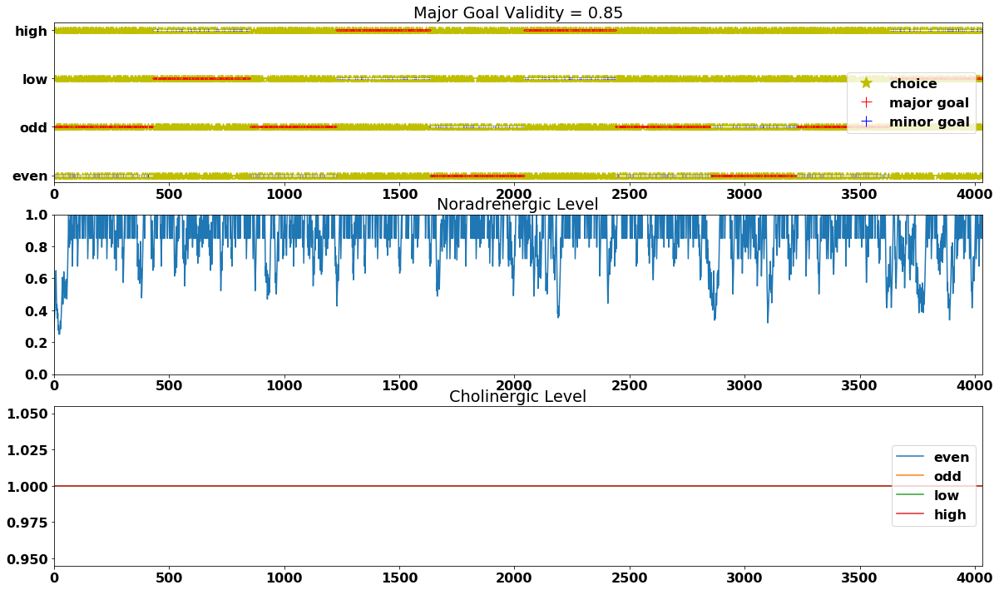

In [65]:
# trialRange+/-30 and two possibly valid cues (5) 
model_copy = copy.deepcopy(model)
correct, choice, ach_level, ach_avg_level, ne_level, correct_lbl, acts_prob, all_prob_85_5a = MNIST_uncertainty_task(model_copy,dataloader,validity_choices=0.85,ACH_CORRECT=ACH_CORRECT,ACH_INCORRECT=ACH_INCORRECT,NE_INCORRECT=NE_INCORRECT,NE_CORRECT=NE_CORRECT,trialRange=trialRange,trialInterval=trialInterval,alterValid=alterValid,num_considered=num_considered,num_threshold=num_threshold, previous_intervals=all_prob_99_1[1],previous_cues=all_prob_99_1[2],hasAChLesion=hasAChLesion,hasNELesion=hasNELesion)
plot_MNIST_uncertainty(correct, choice, ach_level, ach_avg_level, ne_level, correct_lbl, acts_prob, validity_choices=0.85,alterValid=alterValid)


A cue was randomly picked among integers 0~3 (i.e. even, odd, low, high respectively) every 400+/-30 trials for 10 times.
The cue validity was randomly selected among 0.85 in each trial.
A major cue or its alternative is possible for each trial depends on the cue validity.
0/4032 = 0.0% trials occurred when the predicted digit matched the cued digit but the cue was invalid
3041/4032 = 75.4% trials occurred when the predicted digit did not match the cued digit.
    348/4032 trials occurred when the predicted digit did not match the guess-target digit.
    2946/4032 trials occurred when the guess-target digit did not match the cued digit, i.e. when the guessed action was wrong.
829/4032 = 20.6% trials occurred when the predicted digit matches the major cued digit and is valid
162/4032 = 4.0% trials occurred when the predicted digit matches the minor cued digit and is valid
134/4032 = 3.3% trials occurred when the predicted digit matches the major cued digit but is invalidly altered
Lag l

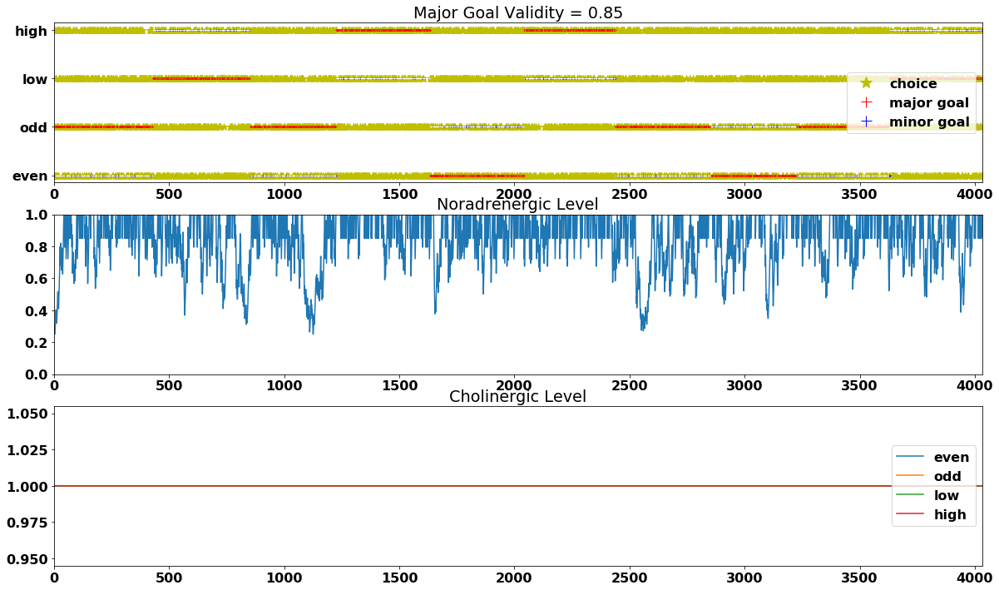

In [66]:
# trialRange+/-30 and two possibly valid cues (6) 
model_copy = copy.deepcopy(model)
correct, choice, ach_level, ach_avg_level, ne_level, correct_lbl, acts_prob, all_prob_85_6a = MNIST_uncertainty_task(model_copy,dataloader,validity_choices=0.85,ACH_CORRECT=ACH_CORRECT,ACH_INCORRECT=ACH_INCORRECT,NE_INCORRECT=NE_INCORRECT,NE_CORRECT=NE_CORRECT,trialRange=trialRange,trialInterval=trialInterval,alterValid=alterValid,num_considered=num_considered,num_threshold=num_threshold, previous_intervals=all_prob_99_1[1],previous_cues=all_prob_99_1[2],hasAChLesion=hasAChLesion,hasNELesion=hasNELesion)
plot_MNIST_uncertainty(correct, choice, ach_level, ach_avg_level, ne_level, correct_lbl, acts_prob, validity_choices=0.85,alterValid=alterValid)


A cue was randomly picked among integers 0~3 (i.e. even, odd, low, high respectively) every 400+/-30 trials for 10 times.
The cue validity was randomly selected among 0.85 in each trial.
A major cue or its alternative is possible for each trial depends on the cue validity.
0/4032 = 0.0% trials occurred when the predicted digit matched the cued digit but the cue was invalid
3087/4032 = 76.6% trials occurred when the predicted digit did not match the cued digit.
    357/4032 trials occurred when the predicted digit did not match the guess-target digit.
    3002/4032 trials occurred when the guess-target digit did not match the cued digit, i.e. when the guessed action was wrong.
801/4032 = 19.9% trials occurred when the predicted digit matches the major cued digit and is valid
144/4032 = 3.6% trials occurred when the predicted digit matches the minor cued digit and is valid
148/4032 = 3.7% trials occurred when the predicted digit matches the major cued digit but is invalidly altered
Lag l

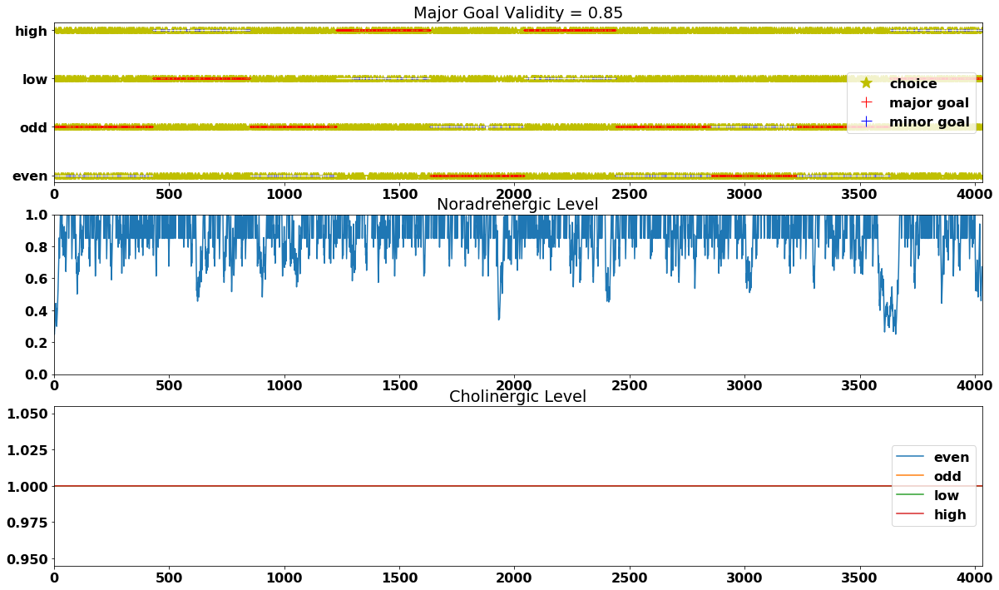

In [67]:
# trialRange+/-30 and two possibly valid cues (7) 
model_copy = copy.deepcopy(model)
correct, choice, ach_level, ach_avg_level, ne_level, correct_lbl, acts_prob, all_prob_85_7a = MNIST_uncertainty_task(model_copy,dataloader,validity_choices=0.85,ACH_CORRECT=ACH_CORRECT,ACH_INCORRECT=ACH_INCORRECT,NE_INCORRECT=NE_INCORRECT,NE_CORRECT=NE_CORRECT,trialRange=trialRange,trialInterval=trialInterval,alterValid=alterValid,num_considered=num_considered,num_threshold=num_threshold, previous_intervals=all_prob_99_1[1],previous_cues=all_prob_99_1[2],hasAChLesion=hasAChLesion,hasNELesion=hasNELesion)
plot_MNIST_uncertainty(correct, choice, ach_level, ach_avg_level, ne_level, correct_lbl, acts_prob, validity_choices=0.85,alterValid=alterValid)


A cue was randomly picked among integers 0~3 (i.e. even, odd, low, high respectively) every 400+/-30 trials for 10 times.
The cue validity was randomly selected among 0.85 in each trial.
A major cue or its alternative is possible for each trial depends on the cue validity.
0/4032 = 0.0% trials occurred when the predicted digit matched the cued digit but the cue was invalid
3116/4032 = 77.3% trials occurred when the predicted digit did not match the cued digit.
    363/4032 trials occurred when the predicted digit did not match the guess-target digit.
    3035/4032 trials occurred when the guess-target digit did not match the cued digit, i.e. when the guessed action was wrong.
774/4032 = 19.2% trials occurred when the predicted digit matches the major cued digit and is valid
142/4032 = 3.5% trials occurred when the predicted digit matches the minor cued digit and is valid
145/4032 = 3.6% trials occurred when the predicted digit matches the major cued digit but is invalidly altered
Lag l

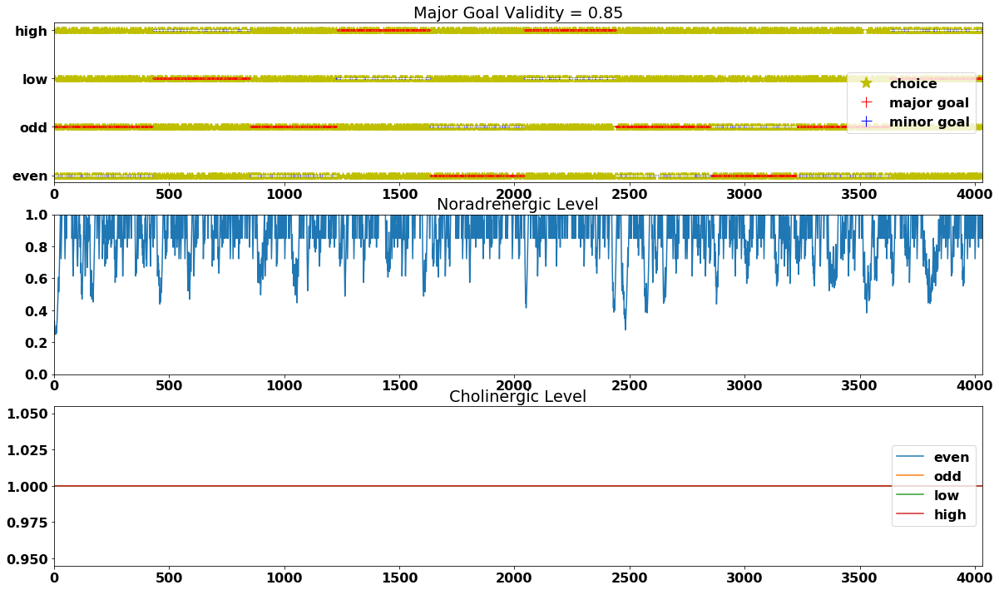

In [68]:
# trialRange+/-30 and two possibly valid cues (8) 
model_copy = copy.deepcopy(model)
correct, choice, ach_level, ach_avg_level, ne_level, correct_lbl, acts_prob, all_prob_85_8a = MNIST_uncertainty_task(model_copy,dataloader,validity_choices=0.85,ACH_CORRECT=ACH_CORRECT,ACH_INCORRECT=ACH_INCORRECT,NE_INCORRECT=NE_INCORRECT,NE_CORRECT=NE_CORRECT,trialRange=trialRange,trialInterval=trialInterval,alterValid=alterValid,num_considered=num_considered,num_threshold=num_threshold, previous_intervals=all_prob_99_1[1],previous_cues=all_prob_99_1[2],hasAChLesion=hasAChLesion,hasNELesion=hasNELesion)
plot_MNIST_uncertainty(correct, choice, ach_level, ach_avg_level, ne_level, correct_lbl, acts_prob, validity_choices=0.85,alterValid=alterValid)


A cue was randomly picked among integers 0~3 (i.e. even, odd, low, high respectively) every 400+/-30 trials for 10 times.
The cue validity was randomly selected among 0.85 in each trial.
A major cue or its alternative is possible for each trial depends on the cue validity.
0/4032 = 0.0% trials occurred when the predicted digit matched the cued digit but the cue was invalid
3128/4032 = 77.6% trials occurred when the predicted digit did not match the cued digit.
    343/4032 trials occurred when the predicted digit did not match the guess-target digit.
    3024/4032 trials occurred when the guess-target digit did not match the cued digit, i.e. when the guessed action was wrong.
749/4032 = 18.6% trials occurred when the predicted digit matches the major cued digit and is valid
155/4032 = 3.8% trials occurred when the predicted digit matches the minor cued digit and is valid
136/4032 = 3.4% trials occurred when the predicted digit matches the major cued digit but is invalidly altered
Lag l

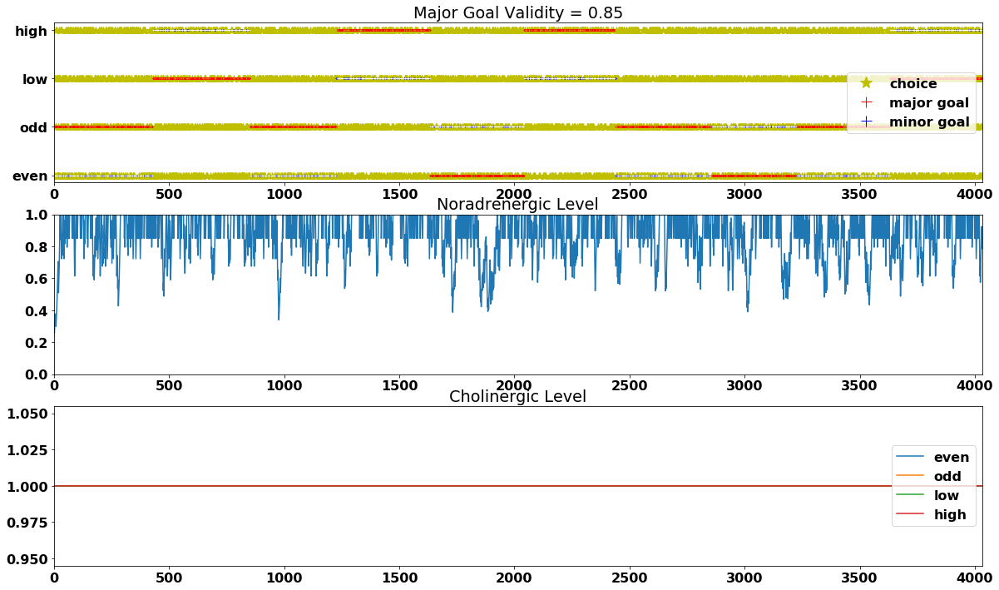

In [69]:
# trialRange+/-30 and two possibly valid cues (9) 
model_copy = copy.deepcopy(model)
correct, choice, ach_level, ach_avg_level, ne_level, correct_lbl, acts_prob, all_prob_85_9a = MNIST_uncertainty_task(model_copy,dataloader,validity_choices=0.85,ACH_CORRECT=ACH_CORRECT,ACH_INCORRECT=ACH_INCORRECT,NE_INCORRECT=NE_INCORRECT,NE_CORRECT=NE_CORRECT,trialRange=trialRange,trialInterval=trialInterval,alterValid=alterValid,num_considered=num_considered,num_threshold=num_threshold, previous_intervals=all_prob_99_1[1],previous_cues=all_prob_99_1[2],hasAChLesion=hasAChLesion,hasNELesion=hasNELesion)
plot_MNIST_uncertainty(correct, choice, ach_level, ach_avg_level, ne_level, correct_lbl, acts_prob, validity_choices=0.85,alterValid=alterValid)


A cue was randomly picked among integers 0~3 (i.e. even, odd, low, high respectively) every 400+/-30 trials for 10 times.
The cue validity was randomly selected among 0.85 in each trial.
A major cue or its alternative is possible for each trial depends on the cue validity.
0/4032 = 0.0% trials occurred when the predicted digit matched the cued digit but the cue was invalid
3137/4032 = 77.8% trials occurred when the predicted digit did not match the cued digit.
    331/4032 trials occurred when the predicted digit did not match the guess-target digit.
    3053/4032 trials occurred when the guess-target digit did not match the cued digit, i.e. when the guessed action was wrong.
774/4032 = 19.2% trials occurred when the predicted digit matches the major cued digit and is valid
121/4032 = 3.0% trials occurred when the predicted digit matches the minor cued digit and is valid
139/4032 = 3.4% trials occurred when the predicted digit matches the major cued digit but is invalidly altered
Lag l

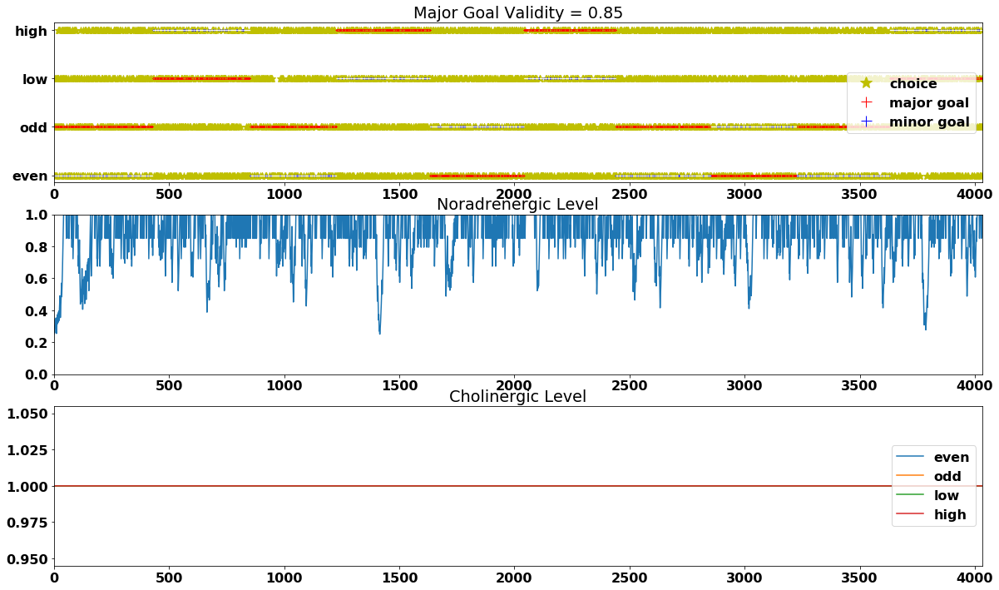

In [70]:
# trialRange+/-30 and two possibly valid cues (10) 
model_copy = copy.deepcopy(model)
correct, choice, ach_level, ach_avg_level, ne_level, correct_lbl, acts_prob, all_prob_85_10a = MNIST_uncertainty_task(model_copy,dataloader,validity_choices=0.85,ACH_CORRECT=ACH_CORRECT,ACH_INCORRECT=ACH_INCORRECT,NE_INCORRECT=NE_INCORRECT,NE_CORRECT=NE_CORRECT,trialRange=trialRange,trialInterval=trialInterval,alterValid=alterValid,num_considered=num_considered,num_threshold=num_threshold, previous_intervals=all_prob_99_1[1],previous_cues=all_prob_99_1[2],hasAChLesion=hasAChLesion,hasNELesion=hasNELesion)
plot_MNIST_uncertainty(correct, choice, ach_level, ach_avg_level, ne_level, correct_lbl, acts_prob, validity_choices=0.85,alterValid=alterValid)


In [71]:
all_85a_case_probs = [all_prob_85_1a,all_prob_85_2a,all_prob_85_3a,all_prob_85_4a,all_prob_85_5a,\
                      all_prob_85_6a,all_prob_85_7a,all_prob_85_8a,all_prob_85_9a,all_prob_85_10a]
averages_85a = average_probs(all_85a_case_probs)


Average lag length is: 391
Average prob pred wrong, prob pred cue A valid, prob pred cue B valid, prob pred cue A invalid,
    prob guess not match cue, prob pred not match guess, prob match cue A invalid alter: 
[0.773735119047619, 0.19154265873015874, 0.034722222222222224, 0.0, 0.7510168650793652, 0.08901289682539683, 0.03382936507936508]


### 4.2.3: validity_choices=0.7

A cue was randomly picked among integers 0~3 (i.e. even, odd, low, high respectively) every 400+/-30 trials for 10 times.
The cue validity was randomly selected among 0.7 in each trial.
A major cue or its alternative is possible for each trial depends on the cue validity.
0/4032 = 0.0% trials occurred when the predicted digit matched the cued digit but the cue was invalid
3109/4032 = 77.1% trials occurred when the predicted digit did not match the cued digit.
    382/4032 trials occurred when the predicted digit did not match the guess-target digit.
    3009/4032 trials occurred when the guess-target digit did not match the cued digit, i.e. when the guessed action was wrong.
631/4032 = 15.6% trials occurred when the predicted digit matches the major cued digit and is valid
292/4032 = 7.2% trials occurred when the predicted digit matches the minor cued digit and is valid
274/4032 = 6.8% trials occurred when the predicted digit matches the major cued digit but is invalidly altered
Lag le

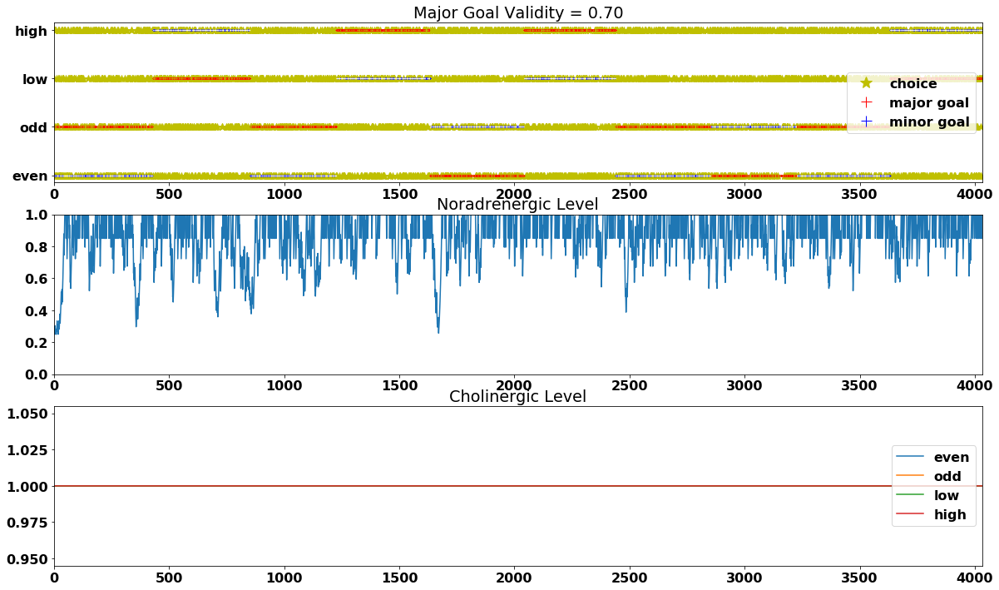

In [72]:
# trialRange+/-30 and two possibly valid cues (1) 
model_copy = copy.deepcopy(model)
correct, choice, ach_level, ach_avg_level, ne_level, correct_lbl, acts_prob, all_prob_70_1a = MNIST_uncertainty_task(model_copy,dataloader,validity_choices=0.70,ACH_CORRECT=ACH_CORRECT,ACH_INCORRECT=ACH_INCORRECT,NE_INCORRECT=NE_INCORRECT,NE_CORRECT=NE_CORRECT,trialRange=trialRange,trialInterval=trialInterval,alterValid=alterValid,num_considered=num_considered,num_threshold=num_threshold, previous_intervals=all_prob_99_1[1],previous_cues=all_prob_99_1[2],hasAChLesion=hasAChLesion,hasNELesion=hasNELesion)
plot_MNIST_uncertainty(correct, choice, ach_level, ach_avg_level, ne_level, correct_lbl, acts_prob, validity_choices=0.70,alterValid=alterValid)


A cue was randomly picked among integers 0~3 (i.e. even, odd, low, high respectively) every 400+/-30 trials for 10 times.
The cue validity was randomly selected among 0.7 in each trial.
A major cue or its alternative is possible for each trial depends on the cue validity.
0/4032 = 0.0% trials occurred when the predicted digit matched the cued digit but the cue was invalid
3118/4032 = 77.3% trials occurred when the predicted digit did not match the cued digit.
    357/4032 trials occurred when the predicted digit did not match the guess-target digit.
    3038/4032 trials occurred when the guess-target digit did not match the cued digit, i.e. when the guessed action was wrong.
657/4032 = 16.3% trials occurred when the predicted digit matches the major cued digit and is valid
257/4032 = 6.4% trials occurred when the predicted digit matches the minor cued digit and is valid
298/4032 = 7.4% trials occurred when the predicted digit matches the major cued digit but is invalidly altered
Lag le

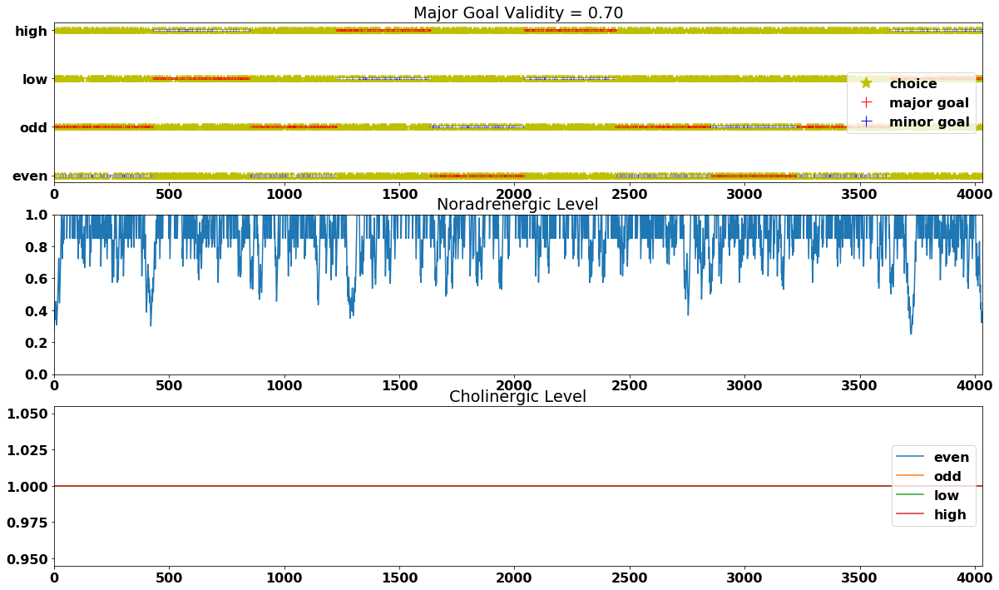

In [73]:
# trialRange+/-30 and two possibly valid cues (2) 
model_copy = copy.deepcopy(model)
correct, choice, ach_level, ach_avg_level, ne_level, correct_lbl, acts_prob, all_prob_70_2a = MNIST_uncertainty_task(model_copy,dataloader,validity_choices=0.70,ACH_CORRECT=ACH_CORRECT,ACH_INCORRECT=ACH_INCORRECT,NE_INCORRECT=NE_INCORRECT,NE_CORRECT=NE_CORRECT,trialRange=trialRange,trialInterval=trialInterval,alterValid=alterValid,num_considered=num_considered,num_threshold=num_threshold, previous_intervals=all_prob_99_1[1],previous_cues=all_prob_99_1[2],hasAChLesion=hasAChLesion,hasNELesion=hasNELesion)
plot_MNIST_uncertainty(correct, choice, ach_level, ach_avg_level, ne_level, correct_lbl, acts_prob, validity_choices=0.70,alterValid=alterValid)


A cue was randomly picked among integers 0~3 (i.e. even, odd, low, high respectively) every 400+/-30 trials for 10 times.
The cue validity was randomly selected among 0.7 in each trial.
A major cue or its alternative is possible for each trial depends on the cue validity.
0/4032 = 0.0% trials occurred when the predicted digit matched the cued digit but the cue was invalid
3090/4032 = 76.6% trials occurred when the predicted digit did not match the cued digit.
    363/4032 trials occurred when the predicted digit did not match the guess-target digit.
    2980/4032 trials occurred when the guess-target digit did not match the cued digit, i.e. when the guessed action was wrong.
690/4032 = 17.1% trials occurred when the predicted digit matches the major cued digit and is valid
252/4032 = 6.2% trials occurred when the predicted digit matches the minor cued digit and is valid
268/4032 = 6.6% trials occurred when the predicted digit matches the major cued digit but is invalidly altered
Lag le

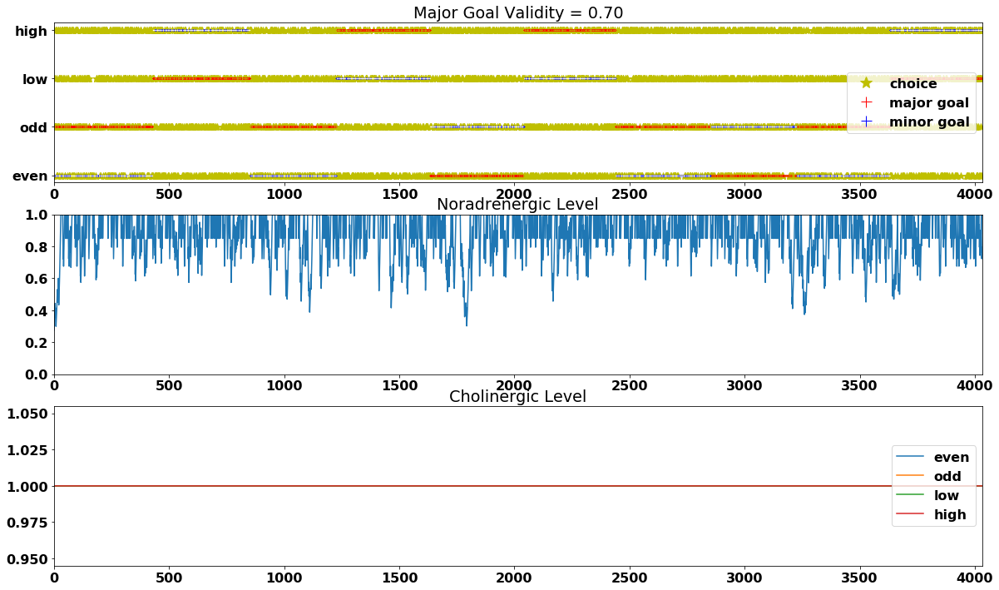

In [74]:
# trialRange+/-30 and two possibly valid cues (3) 
model_copy = copy.deepcopy(model)
correct, choice, ach_level, ach_avg_level, ne_level, correct_lbl, acts_prob, all_prob_70_3a = MNIST_uncertainty_task(model_copy,dataloader,validity_choices=0.70,ACH_CORRECT=ACH_CORRECT,ACH_INCORRECT=ACH_INCORRECT,NE_INCORRECT=NE_INCORRECT,NE_CORRECT=NE_CORRECT,trialRange=trialRange,trialInterval=trialInterval,alterValid=alterValid,num_considered=num_considered,num_threshold=num_threshold, previous_intervals=all_prob_99_1[1],previous_cues=all_prob_99_1[2],hasAChLesion=hasAChLesion,hasNELesion=hasNELesion)
plot_MNIST_uncertainty(correct, choice, ach_level, ach_avg_level, ne_level, correct_lbl, acts_prob, validity_choices=0.70,alterValid=alterValid)


A cue was randomly picked among integers 0~3 (i.e. even, odd, low, high respectively) every 400+/-30 trials for 10 times.
The cue validity was randomly selected among 0.7 in each trial.
A major cue or its alternative is possible for each trial depends on the cue validity.
0/4032 = 0.0% trials occurred when the predicted digit matched the cued digit but the cue was invalid
3123/4032 = 77.5% trials occurred when the predicted digit did not match the cued digit.
    383/4032 trials occurred when the predicted digit did not match the guess-target digit.
    3043/4032 trials occurred when the guess-target digit did not match the cued digit, i.e. when the guessed action was wrong.
627/4032 = 15.6% trials occurred when the predicted digit matches the major cued digit and is valid
282/4032 = 7.0% trials occurred when the predicted digit matches the minor cued digit and is valid
294/4032 = 7.3% trials occurred when the predicted digit matches the major cued digit but is invalidly altered
Lag le

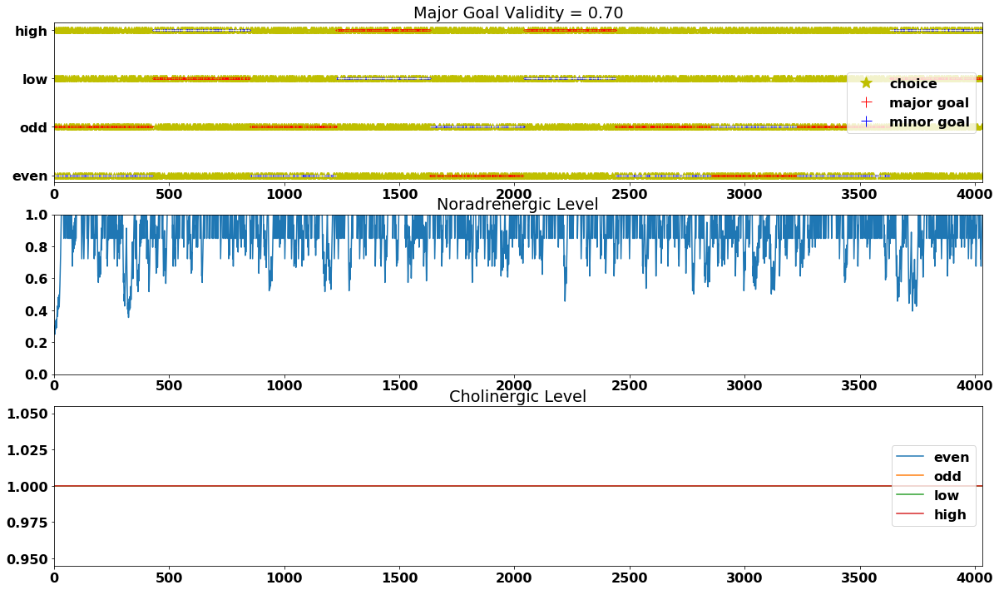

In [75]:
# trialRange+/-30 and two possibly valid cues (4) 
model_copy = copy.deepcopy(model)
correct, choice, ach_level, ach_avg_level, ne_level, correct_lbl, acts_prob, all_prob_70_4a = MNIST_uncertainty_task(model_copy,dataloader,validity_choices=0.70,ACH_CORRECT=ACH_CORRECT,ACH_INCORRECT=ACH_INCORRECT,NE_INCORRECT=NE_INCORRECT,NE_CORRECT=NE_CORRECT,trialRange=trialRange,trialInterval=trialInterval,alterValid=alterValid,num_considered=num_considered,num_threshold=num_threshold, previous_intervals=all_prob_99_1[1],previous_cues=all_prob_99_1[2],hasAChLesion=hasAChLesion,hasNELesion=hasNELesion)
plot_MNIST_uncertainty(correct, choice, ach_level, ach_avg_level, ne_level, correct_lbl, acts_prob, validity_choices=0.70,alterValid=alterValid)


A cue was randomly picked among integers 0~3 (i.e. even, odd, low, high respectively) every 400+/-30 trials for 10 times.
The cue validity was randomly selected among 0.7 in each trial.
A major cue or its alternative is possible for each trial depends on the cue validity.
0/4032 = 0.0% trials occurred when the predicted digit matched the cued digit but the cue was invalid
3126/4032 = 77.5% trials occurred when the predicted digit did not match the cued digit.
    352/4032 trials occurred when the predicted digit did not match the guess-target digit.
    3049/4032 trials occurred when the guess-target digit did not match the cued digit, i.e. when the guessed action was wrong.
640/4032 = 15.9% trials occurred when the predicted digit matches the major cued digit and is valid
266/4032 = 6.6% trials occurred when the predicted digit matches the minor cued digit and is valid
265/4032 = 6.6% trials occurred when the predicted digit matches the major cued digit but is invalidly altered
Lag le

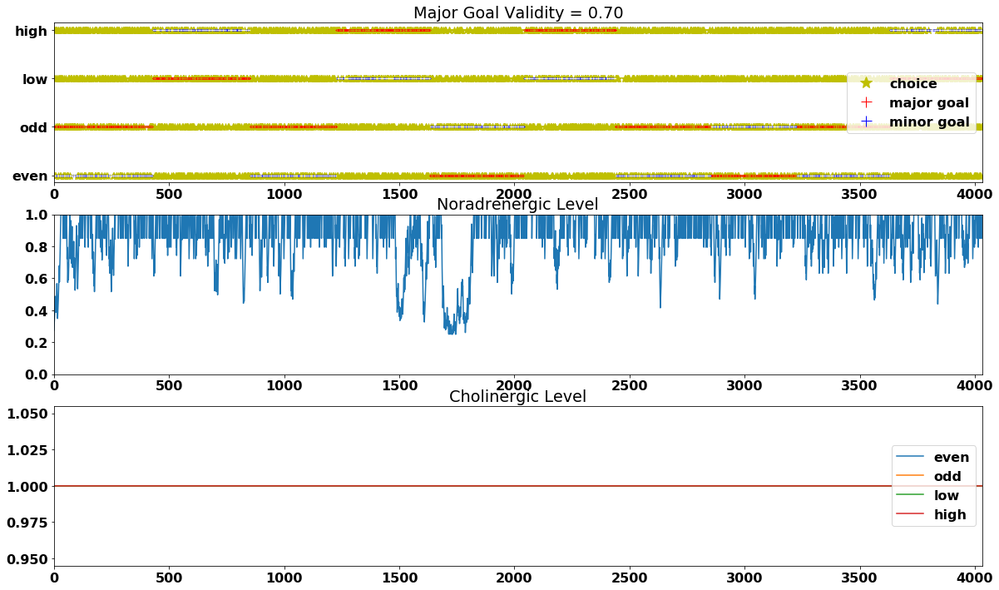

In [76]:
# trialRange+/-30 and two possibly valid cues (5) 
model_copy = copy.deepcopy(model)
correct, choice, ach_level, ach_avg_level, ne_level, correct_lbl, acts_prob, all_prob_70_5a = MNIST_uncertainty_task(model_copy,dataloader,validity_choices=0.70,ACH_CORRECT=ACH_CORRECT,ACH_INCORRECT=ACH_INCORRECT,NE_INCORRECT=NE_INCORRECT,NE_CORRECT=NE_CORRECT,trialRange=trialRange,trialInterval=trialInterval,alterValid=alterValid,num_considered=num_considered,num_threshold=num_threshold, previous_intervals=all_prob_99_1[1],previous_cues=all_prob_99_1[2],hasAChLesion=hasAChLesion,hasNELesion=hasNELesion)
plot_MNIST_uncertainty(correct, choice, ach_level, ach_avg_level, ne_level, correct_lbl, acts_prob, validity_choices=0.70,alterValid=alterValid)


A cue was randomly picked among integers 0~3 (i.e. even, odd, low, high respectively) every 400+/-30 trials for 10 times.
The cue validity was randomly selected among 0.7 in each trial.
A major cue or its alternative is possible for each trial depends on the cue validity.
0/4032 = 0.0% trials occurred when the predicted digit matched the cued digit but the cue was invalid
3118/4032 = 77.3% trials occurred when the predicted digit did not match the cued digit.
    359/4032 trials occurred when the predicted digit did not match the guess-target digit.
    3046/4032 trials occurred when the guess-target digit did not match the cued digit, i.e. when the guessed action was wrong.
657/4032 = 16.3% trials occurred when the predicted digit matches the major cued digit and is valid
257/4032 = 6.4% trials occurred when the predicted digit matches the minor cued digit and is valid
268/4032 = 6.6% trials occurred when the predicted digit matches the major cued digit but is invalidly altered
Lag le

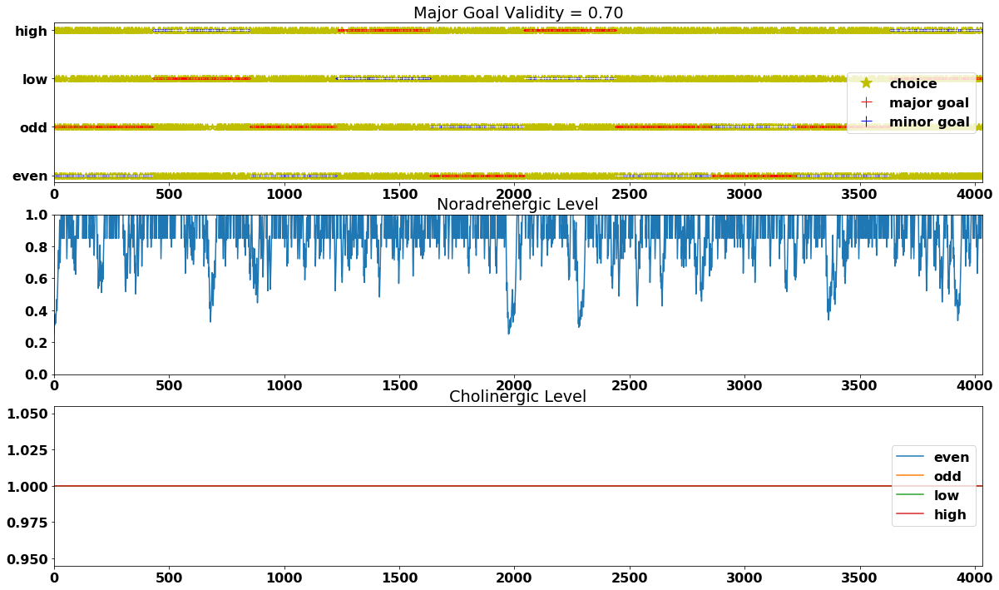

In [77]:
# trialRange+/-30 and two possibly valid cues (6) 
model_copy = copy.deepcopy(model)
correct, choice, ach_level, ach_avg_level, ne_level, correct_lbl, acts_prob, all_prob_70_6a = MNIST_uncertainty_task(model_copy,dataloader,validity_choices=0.70,ACH_CORRECT=ACH_CORRECT,ACH_INCORRECT=ACH_INCORRECT,NE_INCORRECT=NE_INCORRECT,NE_CORRECT=NE_CORRECT,trialRange=trialRange,trialInterval=trialInterval,alterValid=alterValid,num_considered=num_considered,num_threshold=num_threshold, previous_intervals=all_prob_99_1[1],previous_cues=all_prob_99_1[2],hasAChLesion=hasAChLesion,hasNELesion=hasNELesion)
plot_MNIST_uncertainty(correct, choice, ach_level, ach_avg_level, ne_level, correct_lbl, acts_prob, validity_choices=0.70,alterValid=alterValid)


A cue was randomly picked among integers 0~3 (i.e. even, odd, low, high respectively) every 400+/-30 trials for 10 times.
The cue validity was randomly selected among 0.7 in each trial.
A major cue or its alternative is possible for each trial depends on the cue validity.
0/4032 = 0.0% trials occurred when the predicted digit matched the cued digit but the cue was invalid
3077/4032 = 76.3% trials occurred when the predicted digit did not match the cued digit.
    362/4032 trials occurred when the predicted digit did not match the guess-target digit.
    2997/4032 trials occurred when the guess-target digit did not match the cued digit, i.e. when the guessed action was wrong.
665/4032 = 16.5% trials occurred when the predicted digit matches the major cued digit and is valid
290/4032 = 7.2% trials occurred when the predicted digit matches the minor cued digit and is valid
285/4032 = 7.1% trials occurred when the predicted digit matches the major cued digit but is invalidly altered
Lag le

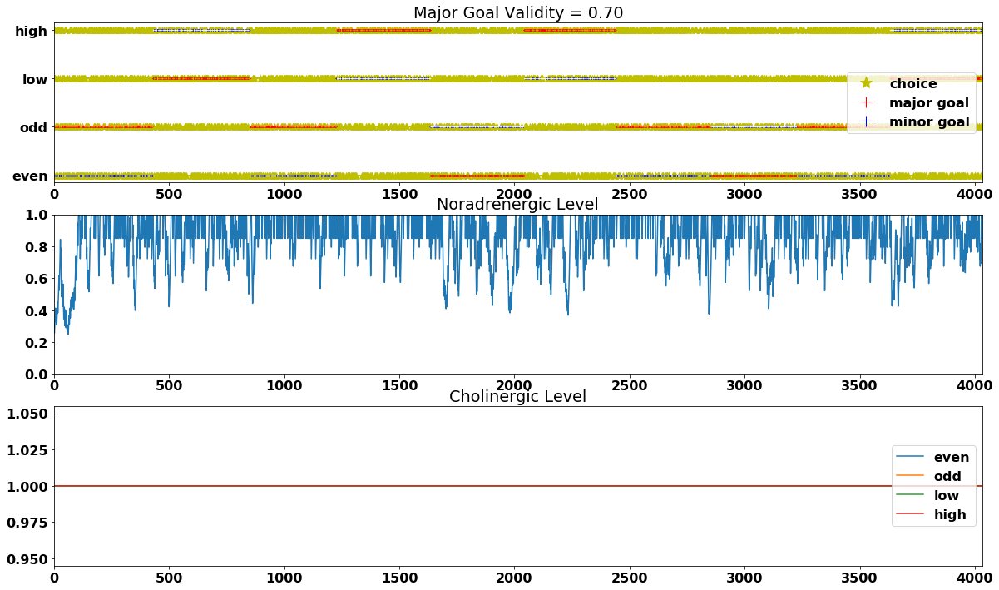

In [78]:
# trialRange+/-30 and two possibly valid cues (7) 
model_copy = copy.deepcopy(model)
correct, choice, ach_level, ach_avg_level, ne_level, correct_lbl, acts_prob, all_prob_70_7a = MNIST_uncertainty_task(model_copy,dataloader,validity_choices=0.70,ACH_CORRECT=ACH_CORRECT,ACH_INCORRECT=ACH_INCORRECT,NE_INCORRECT=NE_INCORRECT,NE_CORRECT=NE_CORRECT,trialRange=trialRange,trialInterval=trialInterval,alterValid=alterValid,num_considered=num_considered,num_threshold=num_threshold, previous_intervals=all_prob_99_1[1],previous_cues=all_prob_99_1[2],hasAChLesion=hasAChLesion,hasNELesion=hasNELesion)
plot_MNIST_uncertainty(correct, choice, ach_level, ach_avg_level, ne_level, correct_lbl, acts_prob, validity_choices=0.70,alterValid=alterValid)


A cue was randomly picked among integers 0~3 (i.e. even, odd, low, high respectively) every 400+/-30 trials for 10 times.
The cue validity was randomly selected among 0.7 in each trial.
A major cue or its alternative is possible for each trial depends on the cue validity.
0/4032 = 0.0% trials occurred when the predicted digit matched the cued digit but the cue was invalid
3133/4032 = 77.7% trials occurred when the predicted digit did not match the cued digit.
    400/4032 trials occurred when the predicted digit did not match the guess-target digit.
    3015/4032 trials occurred when the guess-target digit did not match the cued digit, i.e. when the guessed action was wrong.
640/4032 = 15.9% trials occurred when the predicted digit matches the major cued digit and is valid
259/4032 = 6.4% trials occurred when the predicted digit matches the minor cued digit and is valid
261/4032 = 6.5% trials occurred when the predicted digit matches the major cued digit but is invalidly altered
Lag le

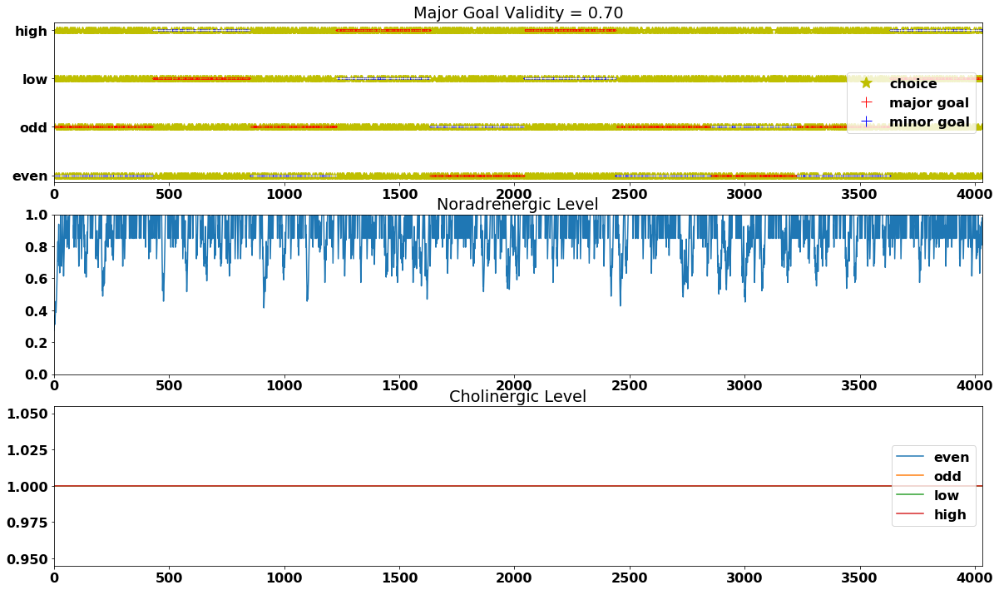

In [79]:
# trialRange+/-30 and two possibly valid cues (8) 
model_copy = copy.deepcopy(model)
correct, choice, ach_level, ach_avg_level, ne_level, correct_lbl, acts_prob, all_prob_70_8a = MNIST_uncertainty_task(model_copy,dataloader,validity_choices=0.70,ACH_CORRECT=ACH_CORRECT,ACH_INCORRECT=ACH_INCORRECT,NE_INCORRECT=NE_INCORRECT,NE_CORRECT=NE_CORRECT,trialRange=trialRange,trialInterval=trialInterval,alterValid=alterValid,num_considered=num_considered,num_threshold=num_threshold, previous_intervals=all_prob_99_1[1],previous_cues=all_prob_99_1[2],hasAChLesion=hasAChLesion,hasNELesion=hasNELesion)
plot_MNIST_uncertainty(correct, choice, ach_level, ach_avg_level, ne_level, correct_lbl, acts_prob, validity_choices=0.70,alterValid=alterValid)


A cue was randomly picked among integers 0~3 (i.e. even, odd, low, high respectively) every 400+/-30 trials for 10 times.
The cue validity was randomly selected among 0.7 in each trial.
A major cue or its alternative is possible for each trial depends on the cue validity.
0/4032 = 0.0% trials occurred when the predicted digit matched the cued digit but the cue was invalid
3113/4032 = 77.2% trials occurred when the predicted digit did not match the cued digit.
    355/4032 trials occurred when the predicted digit did not match the guess-target digit.
    3023/4032 trials occurred when the guess-target digit did not match the cued digit, i.e. when the guessed action was wrong.
619/4032 = 15.4% trials occurred when the predicted digit matches the major cued digit and is valid
300/4032 = 7.4% trials occurred when the predicted digit matches the minor cued digit and is valid
286/4032 = 7.1% trials occurred when the predicted digit matches the major cued digit but is invalidly altered
Lag le

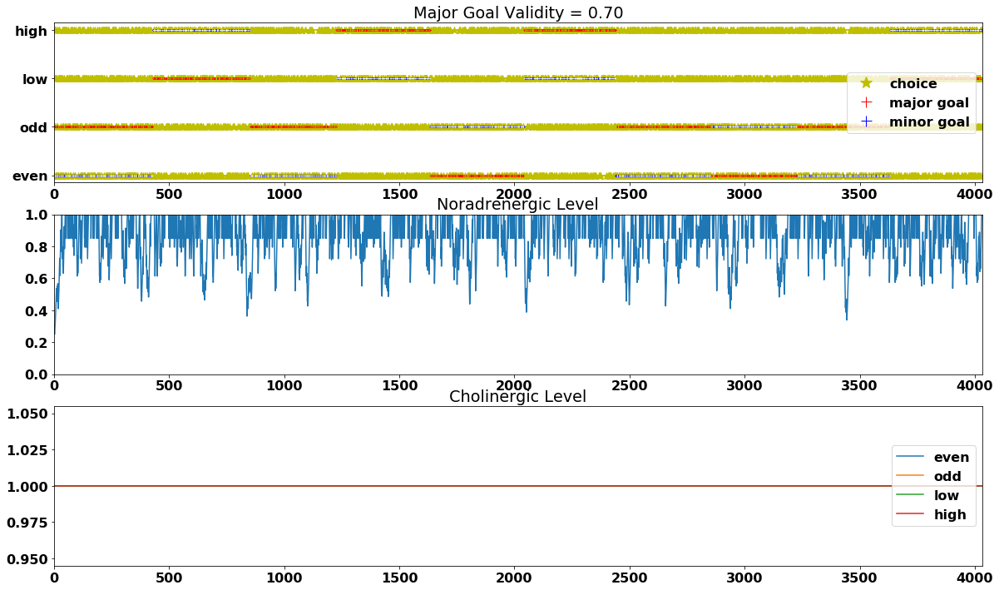

In [80]:
# trialRange+/-30 and two possibly valid cues (9) 
model_copy = copy.deepcopy(model)
correct, choice, ach_level, ach_avg_level, ne_level, correct_lbl, acts_prob, all_prob_70_9a = MNIST_uncertainty_task(model_copy,dataloader,validity_choices=0.70,ACH_CORRECT=ACH_CORRECT,ACH_INCORRECT=ACH_INCORRECT,NE_INCORRECT=NE_INCORRECT,NE_CORRECT=NE_CORRECT,trialRange=trialRange,trialInterval=trialInterval,alterValid=alterValid,num_considered=num_considered,num_threshold=num_threshold, previous_intervals=all_prob_99_1[1],previous_cues=all_prob_99_1[2],hasAChLesion=hasAChLesion,hasNELesion=hasNELesion)
plot_MNIST_uncertainty(correct, choice, ach_level, ach_avg_level, ne_level, correct_lbl, acts_prob, validity_choices=0.70,alterValid=alterValid)


A cue was randomly picked among integers 0~3 (i.e. even, odd, low, high respectively) every 400+/-30 trials for 10 times.
The cue validity was randomly selected among 0.7 in each trial.
A major cue or its alternative is possible for each trial depends on the cue validity.
0/4032 = 0.0% trials occurred when the predicted digit matched the cued digit but the cue was invalid
3071/4032 = 76.2% trials occurred when the predicted digit did not match the cued digit.
    328/4032 trials occurred when the predicted digit did not match the guess-target digit.
    2993/4032 trials occurred when the guess-target digit did not match the cued digit, i.e. when the guessed action was wrong.
666/4032 = 16.5% trials occurred when the predicted digit matches the major cued digit and is valid
295/4032 = 7.3% trials occurred when the predicted digit matches the minor cued digit and is valid
281/4032 = 7.0% trials occurred when the predicted digit matches the major cued digit but is invalidly altered
Lag le

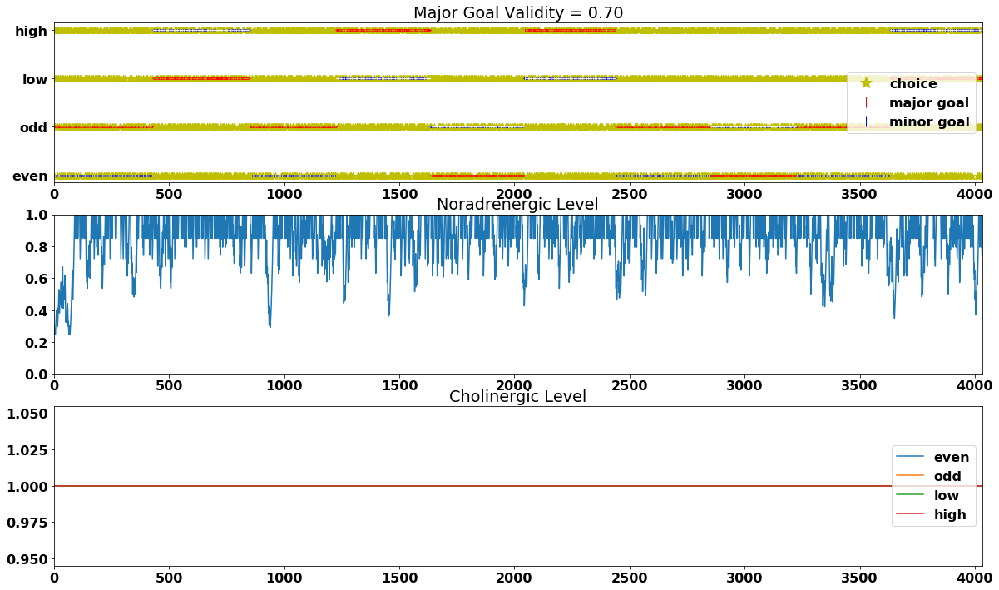

In [81]:
# trialRange+/-30 and two possibly valid cues (10) 
model_copy = copy.deepcopy(model)
correct, choice, ach_level, ach_avg_level, ne_level, correct_lbl, acts_prob, all_prob_70_10a = MNIST_uncertainty_task(model_copy,dataloader,validity_choices=0.70,ACH_CORRECT=ACH_CORRECT,ACH_INCORRECT=ACH_INCORRECT,NE_INCORRECT=NE_INCORRECT,NE_CORRECT=NE_CORRECT,trialRange=trialRange,trialInterval=trialInterval,alterValid=alterValid,num_considered=num_considered,num_threshold=num_threshold, previous_intervals=all_prob_99_1[1],previous_cues=all_prob_99_1[2],hasAChLesion=hasAChLesion,hasNELesion=hasNELesion)
plot_MNIST_uncertainty(correct, choice, ach_level, ach_avg_level, ne_level, correct_lbl, acts_prob, validity_choices=0.70,alterValid=alterValid)


In [82]:
all_70a_case_probs = [all_prob_70_1a,all_prob_70_2a,all_prob_70_3a,all_prob_70_4a,all_prob_70_5a,\
                      all_prob_70_6a,all_prob_70_7a,all_prob_70_8a,all_prob_70_9a,all_prob_70_10a]
averages_70a = average_probs(all_70a_case_probs)


Average lag length is: 398
Average prob pred wrong, prob pred cue A valid, prob pred cue B valid, prob pred cue A invalid,
    prob guess not match cue, prob pred not match guess, prob match cue A invalid alter: 
[0.7707837301587303, 0.16101190476190474, 0.06820436507936507, 0.0, 0.7488343253968254, 0.09030257936507936, 0.0689484126984127]


### 4.2.4: validity_choices=[0.99, 0.85, 0.70]

A cue was randomly picked among integers 0~3 (i.e. even, odd, low, high respectively) every 400+/-30 trials for 10 times.
The cue validity was randomly selected among [0.99, 0.85, 0.7] in each trial.
A major cue or its alternative is possible for each trial depends on the cue validity.
0/4032 = 0.0% trials occurred when the predicted digit matched the cued digit but the cue was invalid
3112/4032 = 77.2% trials occurred when the predicted digit did not match the cued digit.
    389/4032 trials occurred when the predicted digit did not match the guess-target digit.
    3018/4032 trials occurred when the guess-target digit did not match the cued digit, i.e. when the guessed action was wrong.
745/4032 = 18.5% trials occurred when the predicted digit matches the major cued digit and is valid
175/4032 = 4.3% trials occurred when the predicted digit matches the minor cued digit and is valid
155/4032 = 3.8% trials occurred when the predicted digit matches the major cued digit but is invalidly 

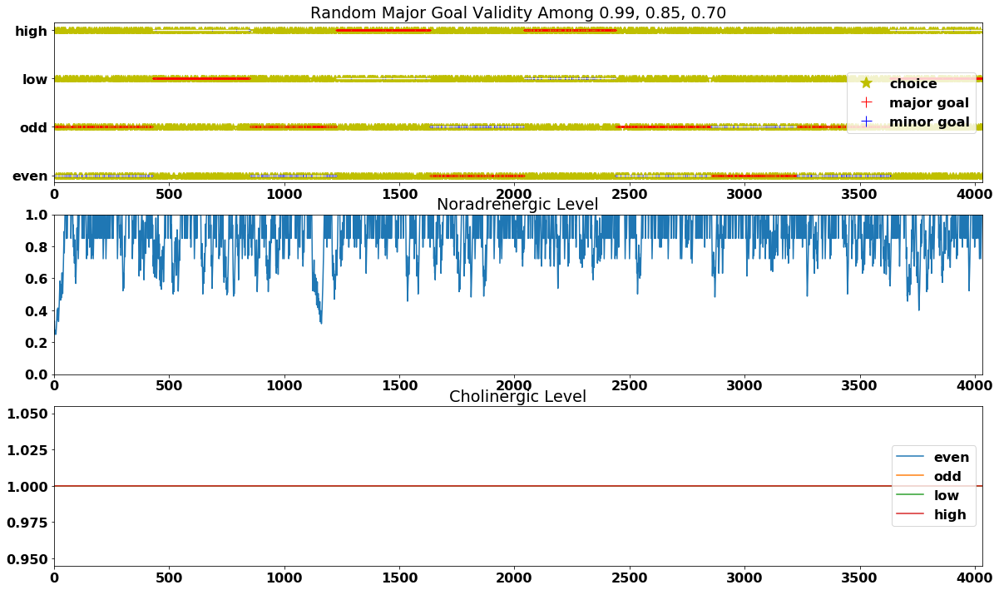

In [83]:
# trialRange+/-30 and two possibly valid cues (1) 
model_copy = copy.deepcopy(model)
correct, choice, ach_level, ach_avg_level, ne_level, correct_lbl, acts_prob, all_prob_multia_1 = MNIST_uncertainty_task(model_copy,dataloader,validity_choices=[0.99,0.85,0.70],ACH_CORRECT=ACH_CORRECT,ACH_INCORRECT=ACH_INCORRECT,NE_INCORRECT=NE_INCORRECT,NE_CORRECT=NE_CORRECT,trialRange=trialRange,trialInterval=trialInterval,alterValid=alterValid,num_considered=num_considered,num_threshold=num_threshold,previous_intervals=all_prob_99_1[1],previous_cues=all_prob_99_1[2],hasAChLesion=hasAChLesion,hasNELesion=hasNELesion)
plot_MNIST_uncertainty(correct, choice, ach_level, ach_avg_level, ne_level, correct_lbl, acts_prob, validity_choices=[0.99,0.85,0.70],alterValid=alterValid)


A cue was randomly picked among integers 0~3 (i.e. even, odd, low, high respectively) every 400+/-30 trials for 10 times.
The cue validity was randomly selected among [0.99, 0.85, 0.7] in each trial.
A major cue or its alternative is possible for each trial depends on the cue validity.
0/4032 = 0.0% trials occurred when the predicted digit matched the cued digit but the cue was invalid
3098/4032 = 76.8% trials occurred when the predicted digit did not match the cued digit.
    366/4032 trials occurred when the predicted digit did not match the guess-target digit.
    3004/4032 trials occurred when the guess-target digit did not match the cued digit, i.e. when the guessed action was wrong.
722/4032 = 17.9% trials occurred when the predicted digit matches the major cued digit and is valid
212/4032 = 5.3% trials occurred when the predicted digit matches the minor cued digit and is valid
214/4032 = 5.3% trials occurred when the predicted digit matches the major cued digit but is invalidly 

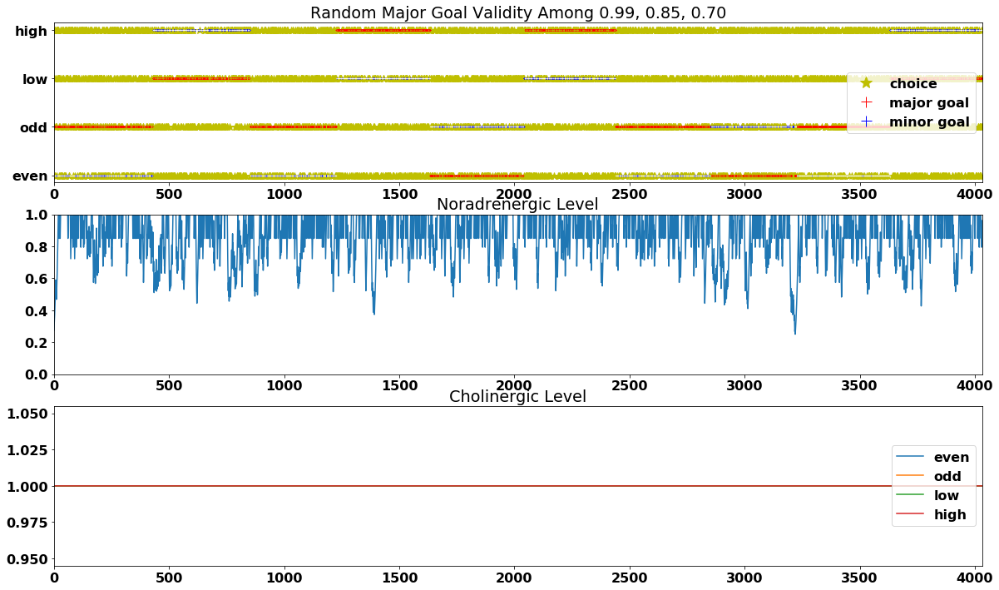

In [84]:
# trialRange+/-30 and two possibly valid cues (2) 
model_copy = copy.deepcopy(model)
correct, choice, ach_level, ach_avg_level, ne_level, correct_lbl, acts_prob, all_prob_multia_2 = MNIST_uncertainty_task(model_copy,dataloader,validity_choices=[0.99,0.85,0.70],ACH_CORRECT=ACH_CORRECT,ACH_INCORRECT=ACH_INCORRECT,NE_INCORRECT=NE_INCORRECT,NE_CORRECT=NE_CORRECT,trialRange=trialRange,trialInterval=trialInterval,alterValid=alterValid,num_considered=num_considered,num_threshold=num_threshold,previous_intervals=all_prob_99_1[1],previous_cues=all_prob_99_1[2],hasAChLesion=hasAChLesion,hasNELesion=hasNELesion)
plot_MNIST_uncertainty(correct, choice, ach_level, ach_avg_level, ne_level, correct_lbl, acts_prob, validity_choices=[0.99,0.85,0.70],alterValid=alterValid)


A cue was randomly picked among integers 0~3 (i.e. even, odd, low, high respectively) every 400+/-30 trials for 10 times.
The cue validity was randomly selected among [0.99, 0.85, 0.7] in each trial.
A major cue or its alternative is possible for each trial depends on the cue validity.
0/4032 = 0.0% trials occurred when the predicted digit matched the cued digit but the cue was invalid
3115/4032 = 77.3% trials occurred when the predicted digit did not match the cued digit.
    311/4032 trials occurred when the predicted digit did not match the guess-target digit.
    3032/4032 trials occurred when the guess-target digit did not match the cued digit, i.e. when the guessed action was wrong.
762/4032 = 18.9% trials occurred when the predicted digit matches the major cued digit and is valid
155/4032 = 3.8% trials occurred when the predicted digit matches the minor cued digit and is valid
152/4032 = 3.8% trials occurred when the predicted digit matches the major cued digit but is invalidly 

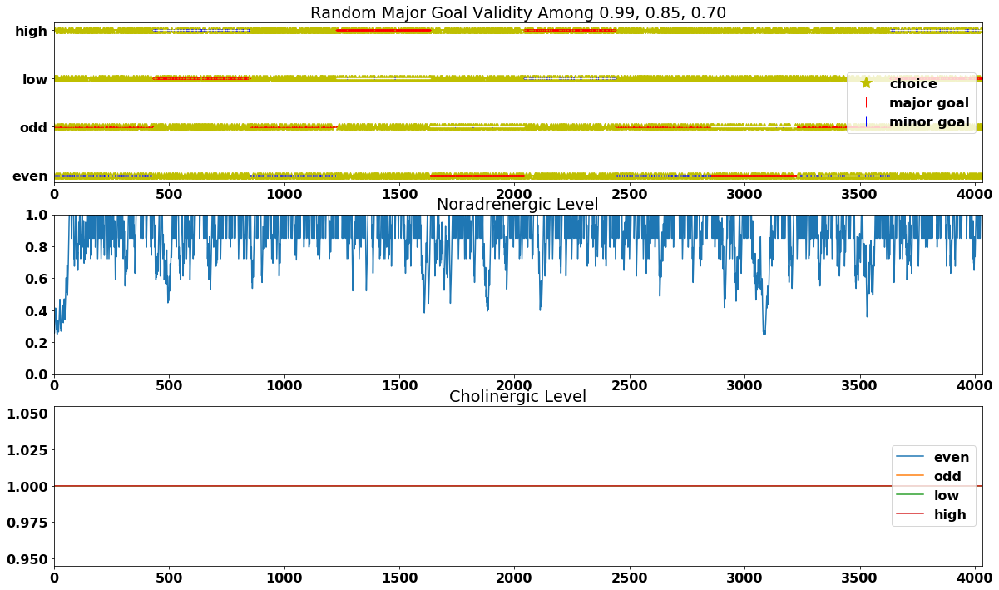

In [85]:
# trialRange+/-30 and two possibly valid cues (3) 
model_copy = copy.deepcopy(model)
correct, choice, ach_level, ach_avg_level, ne_level, correct_lbl, acts_prob, all_prob_multia_3 = MNIST_uncertainty_task(model_copy,dataloader,validity_choices=[0.99,0.85,0.70],ACH_CORRECT=ACH_CORRECT,ACH_INCORRECT=ACH_INCORRECT,NE_INCORRECT=NE_INCORRECT,NE_CORRECT=NE_CORRECT,trialRange=trialRange,trialInterval=trialInterval,alterValid=alterValid,num_considered=num_considered,num_threshold=num_threshold,previous_intervals=all_prob_99_1[1],previous_cues=all_prob_99_1[2],hasAChLesion=hasAChLesion,hasNELesion=hasNELesion)
plot_MNIST_uncertainty(correct, choice, ach_level, ach_avg_level, ne_level, correct_lbl, acts_prob, validity_choices=[0.99,0.85,0.70],alterValid=alterValid)


A cue was randomly picked among integers 0~3 (i.e. even, odd, low, high respectively) every 400+/-30 trials for 10 times.
The cue validity was randomly selected among [0.99, 0.85, 0.7] in each trial.
A major cue or its alternative is possible for each trial depends on the cue validity.
0/4032 = 0.0% trials occurred when the predicted digit matched the cued digit but the cue was invalid
3123/4032 = 77.5% trials occurred when the predicted digit did not match the cued digit.
    335/4032 trials occurred when the predicted digit did not match the guess-target digit.
    3054/4032 trials occurred when the guess-target digit did not match the cued digit, i.e. when the guessed action was wrong.
730/4032 = 18.1% trials occurred when the predicted digit matches the major cued digit and is valid
179/4032 = 4.4% trials occurred when the predicted digit matches the minor cued digit and is valid
170/4032 = 4.2% trials occurred when the predicted digit matches the major cued digit but is invalidly 

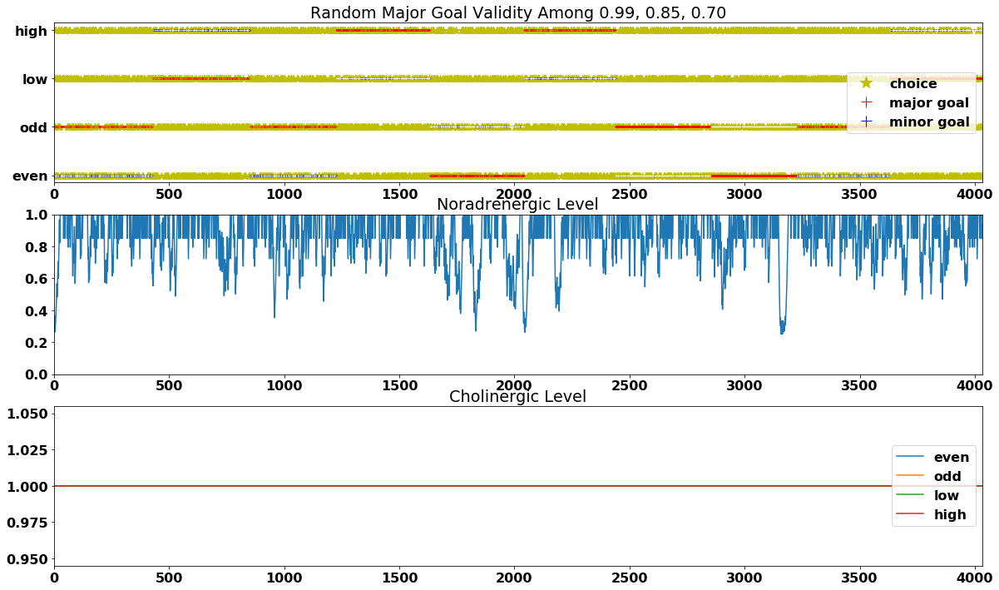

In [86]:
# trialRange+/-30 and two possibly valid cues (4) 
model_copy = copy.deepcopy(model)
correct, choice, ach_level, ach_avg_level, ne_level, correct_lbl, acts_prob, all_prob_multia_4 = MNIST_uncertainty_task(model_copy,dataloader,validity_choices=[0.99,0.85,0.70],ACH_CORRECT=ACH_CORRECT,ACH_INCORRECT=ACH_INCORRECT,NE_INCORRECT=NE_INCORRECT,NE_CORRECT=NE_CORRECT,trialRange=trialRange,trialInterval=trialInterval,alterValid=alterValid,num_considered=num_considered,num_threshold=num_threshold,previous_intervals=all_prob_99_1[1],previous_cues=all_prob_99_1[2],hasAChLesion=hasAChLesion,hasNELesion=hasNELesion)
plot_MNIST_uncertainty(correct, choice, ach_level, ach_avg_level, ne_level, correct_lbl, acts_prob, validity_choices=[0.99,0.85,0.70],alterValid=alterValid)


A cue was randomly picked among integers 0~3 (i.e. even, odd, low, high respectively) every 400+/-30 trials for 10 times.
The cue validity was randomly selected among [0.99, 0.85, 0.7] in each trial.
A major cue or its alternative is possible for each trial depends on the cue validity.
0/4032 = 0.0% trials occurred when the predicted digit matched the cued digit but the cue was invalid
3095/4032 = 76.8% trials occurred when the predicted digit did not match the cued digit.
    412/4032 trials occurred when the predicted digit did not match the guess-target digit.
    3003/4032 trials occurred when the guess-target digit did not match the cued digit, i.e. when the guessed action was wrong.
734/4032 = 18.2% trials occurred when the predicted digit matches the major cued digit and is valid
203/4032 = 5.0% trials occurred when the predicted digit matches the minor cued digit and is valid
197/4032 = 4.9% trials occurred when the predicted digit matches the major cued digit but is invalidly 

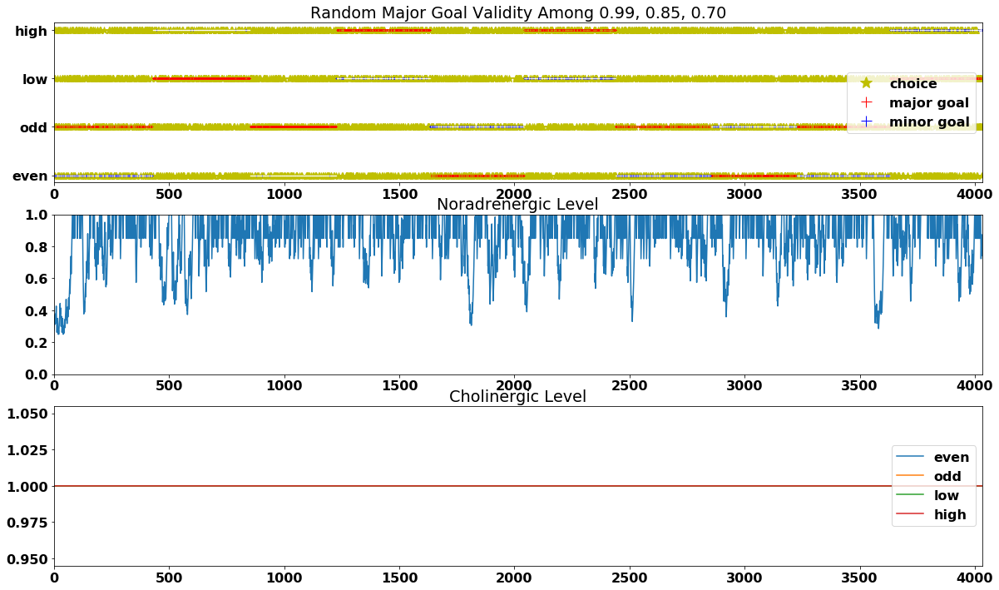

In [87]:
# trialRange+/-30 and two possibly valid cues (5) 
model_copy = copy.deepcopy(model)
correct, choice, ach_level, ach_avg_level, ne_level, correct_lbl, acts_prob, all_prob_multia_5 = MNIST_uncertainty_task(model_copy,dataloader,validity_choices=[0.99,0.85,0.70],ACH_CORRECT=ACH_CORRECT,ACH_INCORRECT=ACH_INCORRECT,NE_INCORRECT=NE_INCORRECT,NE_CORRECT=NE_CORRECT,trialRange=trialRange,trialInterval=trialInterval,alterValid=alterValid,num_considered=num_considered,num_threshold=num_threshold,previous_intervals=all_prob_99_1[1],previous_cues=all_prob_99_1[2],hasAChLesion=hasAChLesion,hasNELesion=hasNELesion)
plot_MNIST_uncertainty(correct, choice, ach_level, ach_avg_level, ne_level, correct_lbl, acts_prob, validity_choices=[0.99,0.85,0.70],alterValid=alterValid)


A cue was randomly picked among integers 0~3 (i.e. even, odd, low, high respectively) every 400+/-30 trials for 10 times.
The cue validity was randomly selected among [0.99, 0.85, 0.7] in each trial.
A major cue or its alternative is possible for each trial depends on the cue validity.
0/4032 = 0.0% trials occurred when the predicted digit matched the cued digit but the cue was invalid
3139/4032 = 77.9% trials occurred when the predicted digit did not match the cued digit.
    347/4032 trials occurred when the predicted digit did not match the guess-target digit.
    3049/4032 trials occurred when the guess-target digit did not match the cued digit, i.e. when the guessed action was wrong.
790/4032 = 19.6% trials occurred when the predicted digit matches the major cued digit and is valid
103/4032 = 2.6% trials occurred when the predicted digit matches the minor cued digit and is valid
122/4032 = 3.0% trials occurred when the predicted digit matches the major cued digit but is invalidly 

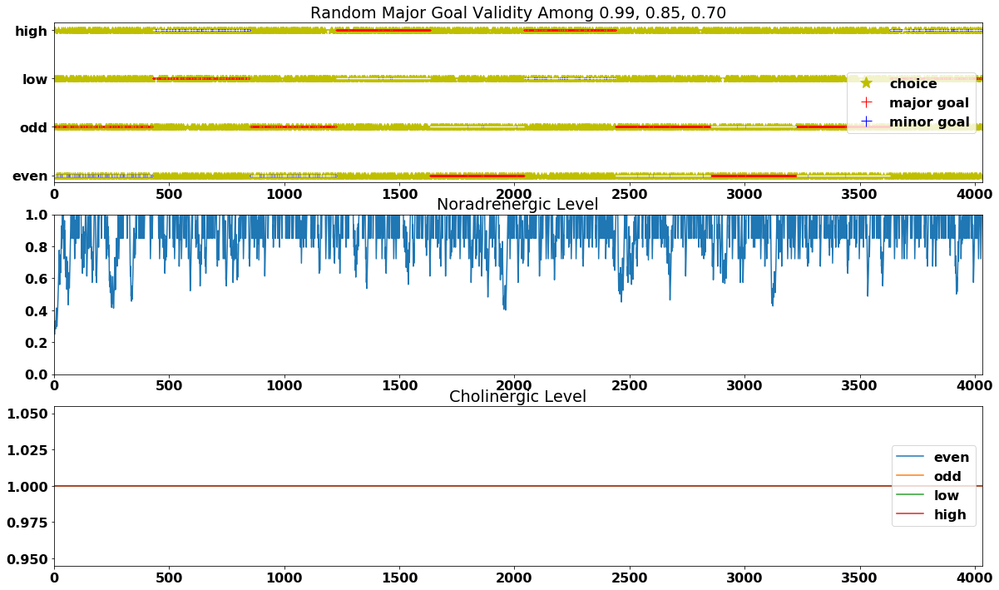

In [88]:
# trialRange+/-30 and two possibly valid cues (6) 
model_copy = copy.deepcopy(model)
correct, choice, ach_level, ach_avg_level, ne_level, correct_lbl, acts_prob, all_prob_multia_6 = MNIST_uncertainty_task(model_copy,dataloader,validity_choices=[0.99,0.85,0.70],ACH_CORRECT=ACH_CORRECT,ACH_INCORRECT=ACH_INCORRECT,NE_INCORRECT=NE_INCORRECT,NE_CORRECT=NE_CORRECT,trialRange=trialRange,trialInterval=trialInterval,alterValid=alterValid,num_considered=num_considered,num_threshold=num_threshold,previous_intervals=all_prob_99_1[1],previous_cues=all_prob_99_1[2],hasAChLesion=hasAChLesion,hasNELesion=hasNELesion)
plot_MNIST_uncertainty(correct, choice, ach_level, ach_avg_level, ne_level, correct_lbl, acts_prob, validity_choices=[0.99,0.85,0.70],alterValid=alterValid)


A cue was randomly picked among integers 0~3 (i.e. even, odd, low, high respectively) every 400+/-30 trials for 10 times.
The cue validity was randomly selected among [0.99, 0.85, 0.7] in each trial.
A major cue or its alternative is possible for each trial depends on the cue validity.
0/4032 = 0.0% trials occurred when the predicted digit matched the cued digit but the cue was invalid
3115/4032 = 77.3% trials occurred when the predicted digit did not match the cued digit.
    366/4032 trials occurred when the predicted digit did not match the guess-target digit.
    3022/4032 trials occurred when the guess-target digit did not match the cued digit, i.e. when the guessed action was wrong.
755/4032 = 18.7% trials occurred when the predicted digit matches the major cued digit and is valid
162/4032 = 4.0% trials occurred when the predicted digit matches the minor cued digit and is valid
158/4032 = 3.9% trials occurred when the predicted digit matches the major cued digit but is invalidly 

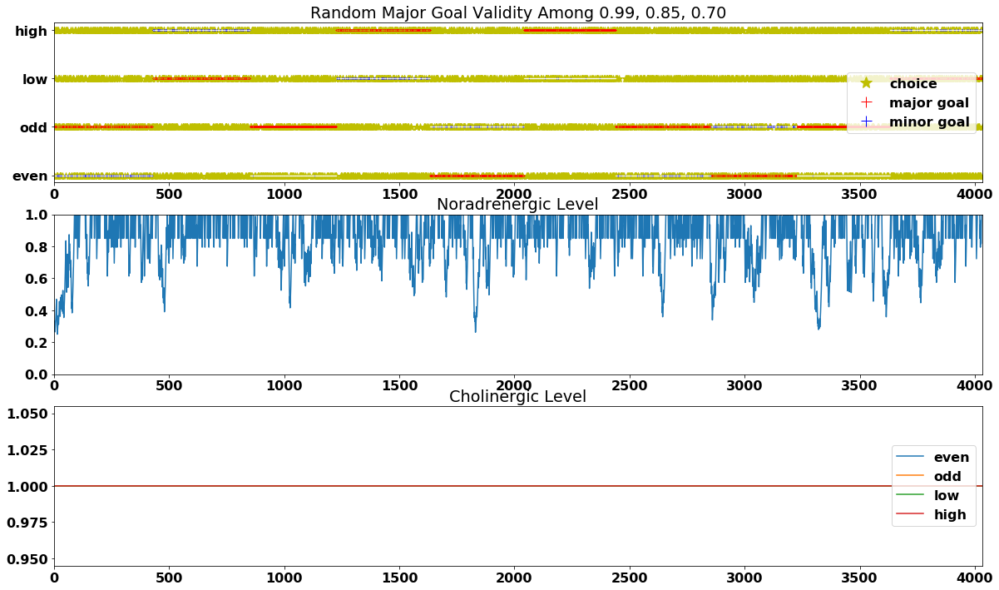

In [89]:
# trialRange+/-30 and two possibly valid cues (7) 
model_copy = copy.deepcopy(model)
correct, choice, ach_level, ach_avg_level, ne_level, correct_lbl, acts_prob, all_prob_multia_7 = MNIST_uncertainty_task(model_copy,dataloader,validity_choices=[0.99,0.85,0.70],ACH_CORRECT=ACH_CORRECT,ACH_INCORRECT=ACH_INCORRECT,NE_INCORRECT=NE_INCORRECT,NE_CORRECT=NE_CORRECT,trialRange=trialRange,trialInterval=trialInterval,alterValid=alterValid,num_considered=num_considered,num_threshold=num_threshold,previous_intervals=all_prob_99_1[1],previous_cues=all_prob_99_1[2],hasAChLesion=hasAChLesion,hasNELesion=hasNELesion)
plot_MNIST_uncertainty(correct, choice, ach_level, ach_avg_level, ne_level, correct_lbl, acts_prob, validity_choices=[0.99,0.85,0.70],alterValid=alterValid)


A cue was randomly picked among integers 0~3 (i.e. even, odd, low, high respectively) every 400+/-30 trials for 10 times.
The cue validity was randomly selected among [0.99, 0.85, 0.7] in each trial.
A major cue or its alternative is possible for each trial depends on the cue validity.
0/4032 = 0.0% trials occurred when the predicted digit matched the cued digit but the cue was invalid
3102/4032 = 76.9% trials occurred when the predicted digit did not match the cued digit.
    350/4032 trials occurred when the predicted digit did not match the guess-target digit.
    3010/4032 trials occurred when the guess-target digit did not match the cued digit, i.e. when the guessed action was wrong.
830/4032 = 20.6% trials occurred when the predicted digit matches the major cued digit and is valid
100/4032 = 2.5% trials occurred when the predicted digit matches the minor cued digit and is valid
95/4032 = 2.4% trials occurred when the predicted digit matches the major cued digit but is invalidly a

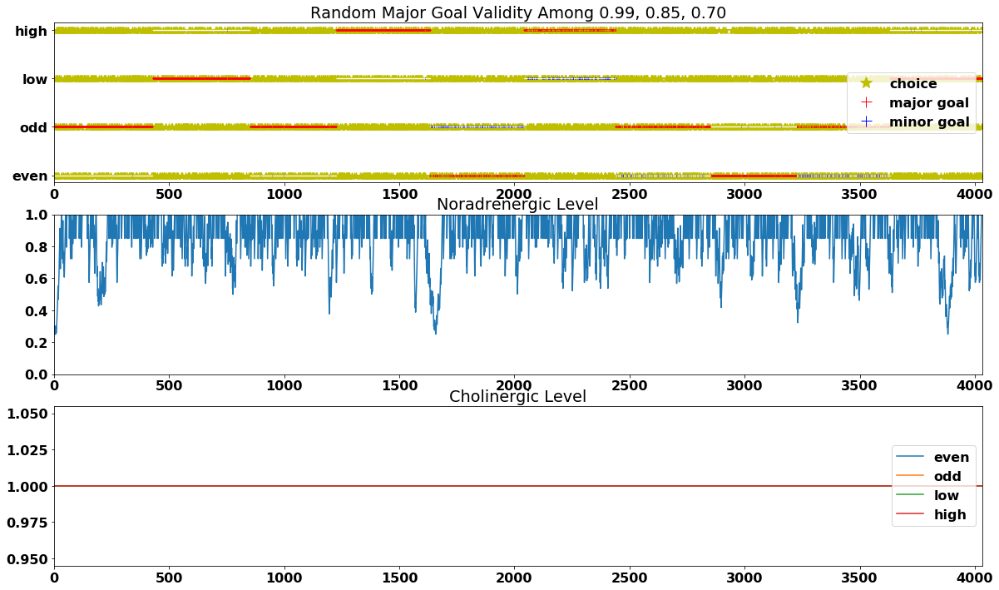

In [90]:
# trialRange+/-30 and two possibly valid cues (8) 
model_copy = copy.deepcopy(model)
correct, choice, ach_level, ach_avg_level, ne_level, correct_lbl, acts_prob, all_prob_multia_8 = MNIST_uncertainty_task(model_copy,dataloader,validity_choices=[0.99,0.85,0.70],ACH_CORRECT=ACH_CORRECT,ACH_INCORRECT=ACH_INCORRECT,NE_INCORRECT=NE_INCORRECT,NE_CORRECT=NE_CORRECT,trialRange=trialRange,trialInterval=trialInterval,alterValid=alterValid,num_considered=num_considered,num_threshold=num_threshold,previous_intervals=all_prob_99_1[1],previous_cues=all_prob_99_1[2],hasAChLesion=hasAChLesion,hasNELesion=hasNELesion)
plot_MNIST_uncertainty(correct, choice, ach_level, ach_avg_level, ne_level, correct_lbl, acts_prob, validity_choices=[0.99,0.85,0.70],alterValid=alterValid)


A cue was randomly picked among integers 0~3 (i.e. even, odd, low, high respectively) every 400+/-30 trials for 10 times.
The cue validity was randomly selected among [0.99, 0.85, 0.7] in each trial.
A major cue or its alternative is possible for each trial depends on the cue validity.
0/4032 = 0.0% trials occurred when the predicted digit matched the cued digit but the cue was invalid
3102/4032 = 76.9% trials occurred when the predicted digit did not match the cued digit.
    330/4032 trials occurred when the predicted digit did not match the guess-target digit.
    3038/4032 trials occurred when the guess-target digit did not match the cued digit, i.e. when the guessed action was wrong.
793/4032 = 19.7% trials occurred when the predicted digit matches the major cued digit and is valid
137/4032 = 3.4% trials occurred when the predicted digit matches the minor cued digit and is valid
156/4032 = 3.9% trials occurred when the predicted digit matches the major cued digit but is invalidly 

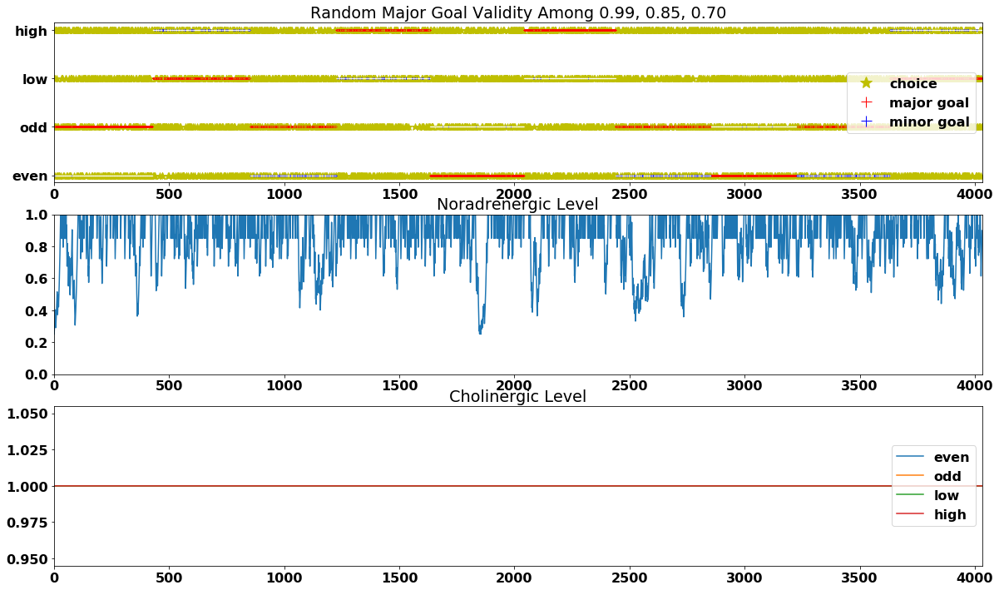

In [91]:
# trialRange+/-30 and two possibly valid cues (9) 
model_copy = copy.deepcopy(model)
correct, choice, ach_level, ach_avg_level, ne_level, correct_lbl, acts_prob, all_prob_multia_9 = MNIST_uncertainty_task(model_copy,dataloader,validity_choices=[0.99,0.85,0.70],ACH_CORRECT=ACH_CORRECT,ACH_INCORRECT=ACH_INCORRECT,NE_INCORRECT=NE_INCORRECT,NE_CORRECT=NE_CORRECT,trialRange=trialRange,trialInterval=trialInterval,alterValid=alterValid,num_considered=num_considered,num_threshold=num_threshold,previous_intervals=all_prob_99_1[1],previous_cues=all_prob_99_1[2],hasAChLesion=hasAChLesion,hasNELesion=hasNELesion)
plot_MNIST_uncertainty(correct, choice, ach_level, ach_avg_level, ne_level, correct_lbl, acts_prob, validity_choices=[0.99,0.85,0.70],alterValid=alterValid)


A cue was randomly picked among integers 0~3 (i.e. even, odd, low, high respectively) every 400+/-30 trials for 10 times.
The cue validity was randomly selected among [0.99, 0.85, 0.7] in each trial.
A major cue or its alternative is possible for each trial depends on the cue validity.
0/4032 = 0.0% trials occurred when the predicted digit matched the cued digit but the cue was invalid
3108/4032 = 77.1% trials occurred when the predicted digit did not match the cued digit.
    375/4032 trials occurred when the predicted digit did not match the guess-target digit.
    3015/4032 trials occurred when the guess-target digit did not match the cued digit, i.e. when the guessed action was wrong.
767/4032 = 19.0% trials occurred when the predicted digit matches the major cued digit and is valid
157/4032 = 3.9% trials occurred when the predicted digit matches the minor cued digit and is valid
168/4032 = 4.2% trials occurred when the predicted digit matches the major cued digit but is invalidly 

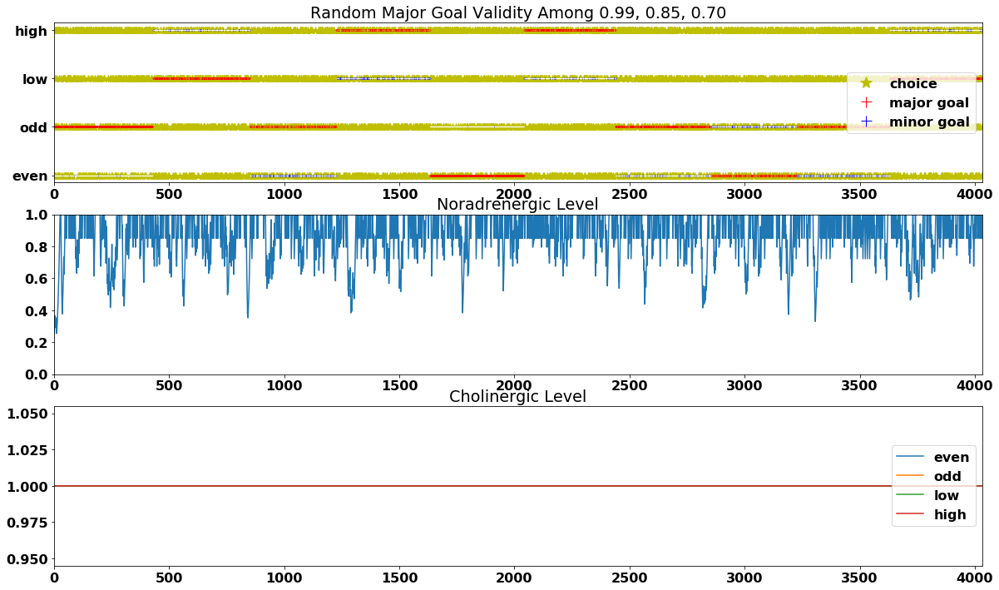

In [92]:
# trialRange+/-30 and two possibly valid cues (10) 
model_copy = copy.deepcopy(model)
correct, choice, ach_level, ach_avg_level, ne_level, correct_lbl, acts_prob, all_prob_multia_10 = MNIST_uncertainty_task(model_copy,dataloader,validity_choices=[0.99,0.85,0.70],ACH_CORRECT=ACH_CORRECT,ACH_INCORRECT=ACH_INCORRECT,NE_INCORRECT=NE_INCORRECT,NE_CORRECT=NE_CORRECT,trialRange=trialRange,trialInterval=trialInterval,alterValid=alterValid,num_considered=num_considered,num_threshold=num_threshold,previous_intervals=all_prob_99_1[1],previous_cues=all_prob_99_1[2],hasAChLesion=hasAChLesion,hasNELesion=hasNELesion)
plot_MNIST_uncertainty(correct, choice, ach_level, ach_avg_level, ne_level, correct_lbl, acts_prob, validity_choices=[0.99,0.85,0.70],alterValid=alterValid)


In [93]:
all_multia_case_probs = [all_prob_multia_1,all_prob_multia_2,all_prob_multia_3,all_prob_multia_4,all_prob_multia_5,\
                         all_prob_multia_6,all_prob_multia_7,all_prob_multia_8,all_prob_multia_9,all_prob_multia_10]
averages_multia = average_probs(all_multia_case_probs)


Average lag length is: 393
Average prob pred wrong, prob pred cue A valid, prob pred cue B valid, prob pred cue A invalid,
    prob guess not match cue, prob pred not match guess, prob match cue A invalid alter: 
[0.7715525793650794, 0.18918650793650793, 0.0392609126984127, 0.0, 0.7501240079365079, 0.08881448412698412, 0.039360119047619054]


plt.plot(np.arange(len(choice)),choice,'y*',markersize=9) #'y*',markersize=8
    plt.plot(ind_cue1,correct[ind_cue1],'r+',markersize=2) #'r+',markersize=1
    plt.plot(ind_cue2,correct[ind_cue2],'b+',markersize=2) #'b+',markersize=3
    if alterValid:
        alter = np.array([crt+1 if crt%2==0 else crt-1 for crt in correct.tolist()])
        plt.plot(ind_cue1,alter[ind_cue1],'w.',markersize=0.5)#1
        plt.plot(ind_cue2,alter[ind_cue2],'y.',markersize=0.5)#1
    plt.xlim(0,len(correct))